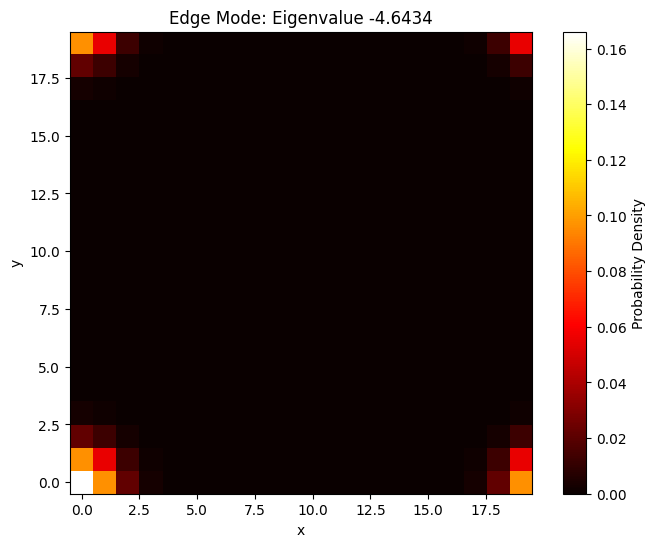

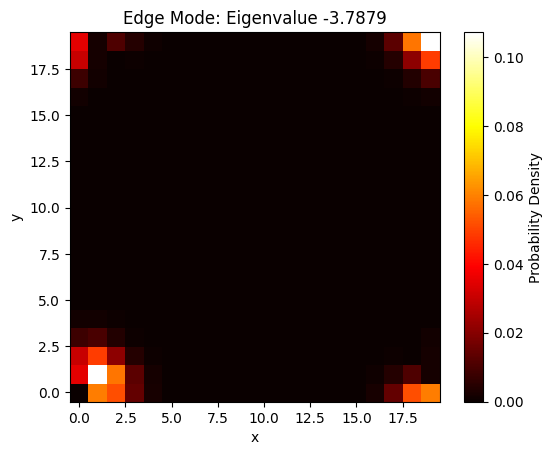

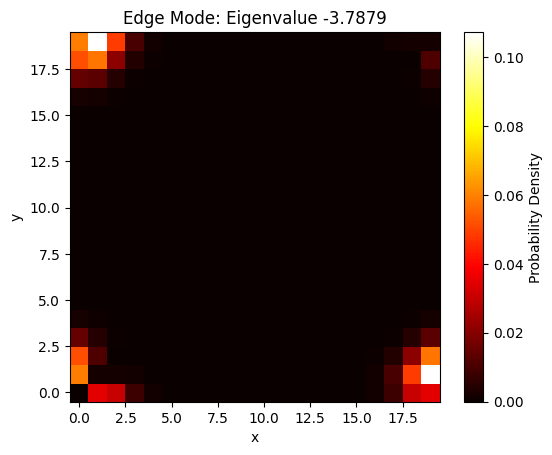

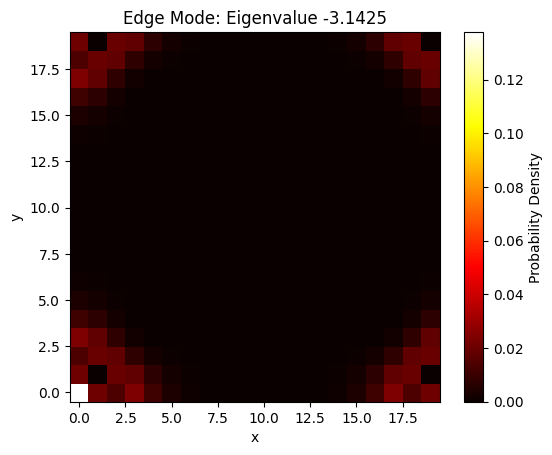

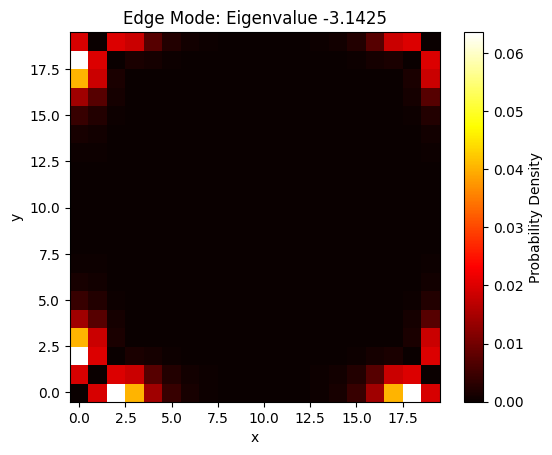

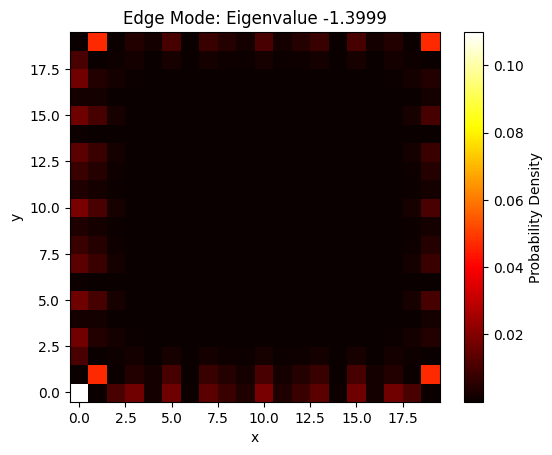

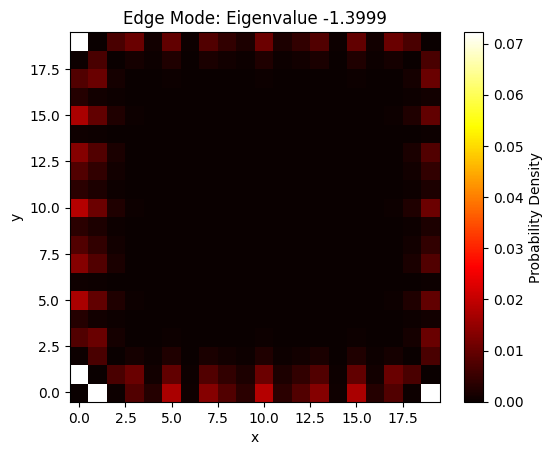

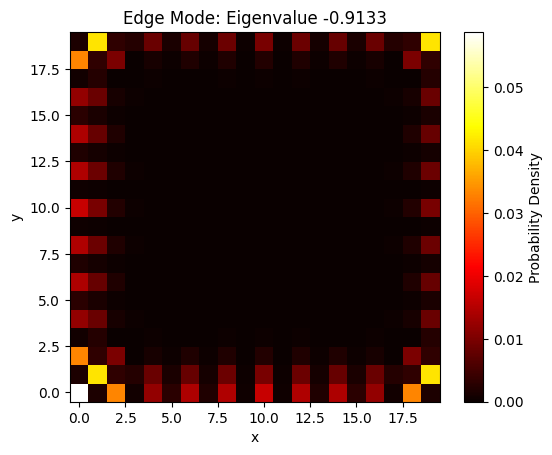

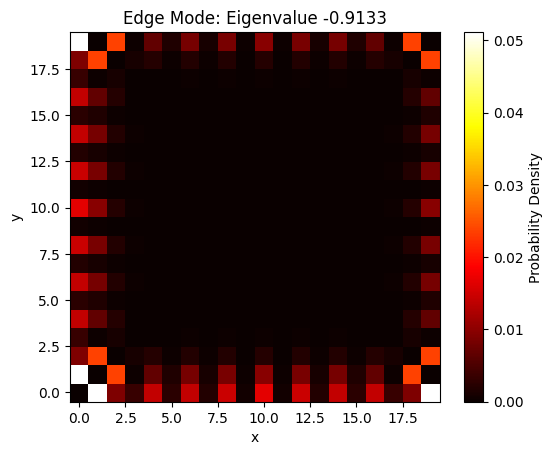

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ==============================================
# 1) PARAMETERS & SETUP
# ==============================================
Lx, Ly = 20, 20  # Lattice size (20x20 lattice)
B = 2.0          # External magnetic field
alpha = 0.5      # Higher-order coupling coefficient (2nd neighbors)
beta = 0.3       # Higher-order coupling coefficient (3rd neighbors)

def lattice_hamiltonian(Lx, Ly, B, alpha, beta):
    """
    Constructs the finite lattice Hamiltonian for a square lattice.
    """
    N = Lx * Ly  # Total number of lattice sites
    H = np.zeros((N, N), dtype=complex)  # Hamiltonian matrix

    def index(x, y):
        # Helper function to convert 2D lattice coordinates to 1D index
        return x + y * Lx

    for x in range(Lx):
        for y in range(Ly):
            i = index(x, y)

            # On-site energy
            H[i, i] = B - (np.cos(2 * np.pi * x / Lx) + np.cos(2 * np.pi * y / Ly)
                          + alpha * (np.cos(4 * np.pi * x / Lx) + np.cos(4 * np.pi * y / Ly))
                          + beta * (np.cos(6 * np.pi * x / Lx) + np.cos(6 * np.pi * y / Ly)))

            # Nearest-neighbor hopping
            neighbors = [((x + 1) % Lx, y),  # Right neighbor
                         ((x - 1) % Lx, y),  # Left neighbor
                         (x, (y + 1) % Ly),  # Top neighbor
                         (x, (y - 1) % Ly)]  # Bottom neighbor

            for nx, ny in neighbors:
                j = index(nx, ny)
                H[i, j] += 1.0  # Nearest-neighbor hopping term

    return H

# ==============================================
# 2) DIAGONALIZATION
# ==============================================
def diagonalize_hamiltonian(H):
    """
    Diagonalize the Hamiltonian and return eigenvalues and eigenvectors.
    """
    eigenvalues, eigenvectors = np.linalg.eigh(H)
    return eigenvalues, eigenvectors

# ==============================================
# 3) PLOT EDGE MODES
# ==============================================
def plot_edge_modes(eigenvalues, eigenvectors, Lx, Ly):
    """
    Plot edge modes by analyzing eigenvectors.
    """
    edge_state_indices = []
    for i, ev in enumerate(eigenvalues):
        state = eigenvectors[:, i]
        probabilities = np.abs(state.reshape(Lx, Ly))**2

        # Check if the state is localized on the edge
        edge_probability = (np.sum(probabilities[0, :]) + np.sum(probabilities[-1, :]) +
                            np.sum(probabilities[:, 0]) + np.sum(probabilities[:, -1]))
        total_probability = np.sum(probabilities)
        if edge_probability / total_probability > 0.8:  # Threshold for edge localization
            edge_state_indices.append(i)

    # Plot edge states
    plt.figure(figsize=(8, 6))
    for idx in edge_state_indices:
        state = eigenvectors[:, idx]
        probabilities = np.abs(state.reshape(Lx, Ly))**2
        plt.imshow(probabilities, cmap='hot', origin='lower')
        plt.colorbar(label='Probability Density')
        plt.title(f'Edge Mode: Eigenvalue {eigenvalues[idx]:.4f}')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.show()

# ==============================================
# 4) MAIN EXECUTION
# ==============================================
if __name__ == "__main__":
    # Construct the Hamiltonian
    H = lattice_hamiltonian(Lx, Ly, B, alpha, beta)

    # Diagonalize the Hamiltonian
    eigenvalues, eigenvectors = diagonalize_hamiltonian(H)

    # Plot the edge modes
    plot_edge_modes(eigenvalues, eigenvectors, Lx, Ly)

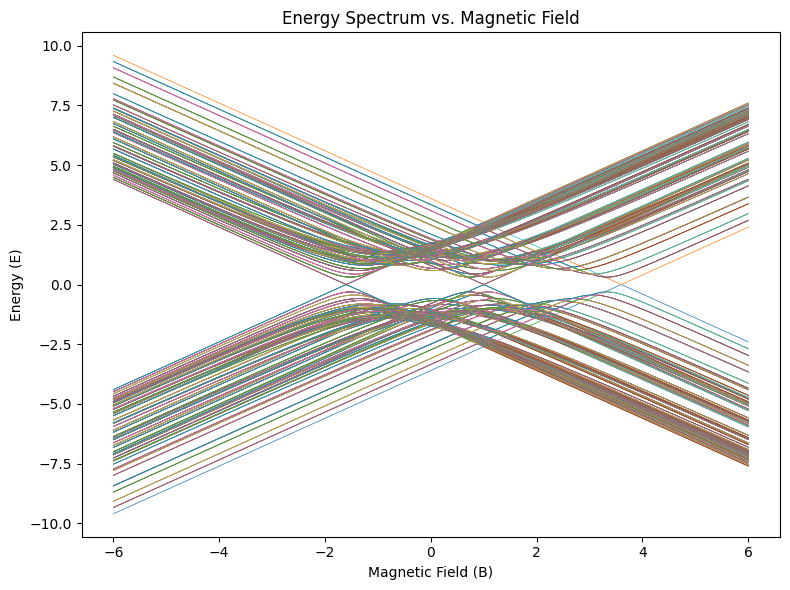

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ==============================================
# PARAMETERS & SETUP
# ==============================================
Nx = 21
Ny = 21

kx_vals = np.linspace(-np.pi, np.pi, Nx)
ky_vals = np.linspace(-np.pi, np.pi, Ny)

# Magnetic field sweep parameters:
B_min = -6.0
B_max =  6.0
num_timesteps = 400
B_vals = np.linspace(B_min, B_max, num_timesteps)

alpha = 0.5
beta  = 0.3

# ==============================================
# EXTENDED 2-BAND HAMILTONIAN
# ==============================================
def extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta):
    """
    H(k) = sin(kx)*sigma_x + sin(ky)*sigma_y + [B - f(kx, ky)]*sigma_z,
    with:
      f(kx, ky) = cos(kx) + cos(ky)
                 + alpha*(cos(2kx)+cos(2ky))
                 + beta*(cos(3kx)+cos(3ky)).
    """
    hx = np.sin(kx)
    hy = np.sin(ky)

    f_val = ( np.cos(kx) + np.cos(ky)
              + alpha*(np.cos(2*kx) + np.cos(2*ky))
              + beta*(np.cos(3*kx) + np.cos(3*ky)) )

    hz = B - f_val

    H = np.array([
        [ hz,       hx - 1j*hy ],
        [ hx + 1j*hy,   -hz    ]
    ], dtype=complex)

    return H

# ==============================================
# ENERGY SPECTRUM VS. MAGNETIC FIELD
# ==============================================
eigenvalues_all = []

for B in B_vals:
    eigvals = []
    for kx in kx_vals:
        for ky in ky_vals:
            H = extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta)
            eigvals.extend(np.linalg.eigvalsh(H))
    eigenvalues_all.append(sorted(eigvals))

# Convert the list to a NumPy array for easier manipulation.
# Each row corresponds to one value of B.
eigenvalues_all = np.array(eigenvalues_all)

# Plot the energy spectrum
plt.figure(figsize=(8, 6))
# Transpose so that each curve (each eigenvalue branch) is plotted versus B.
for eig_branch in eigenvalues_all.T:
    plt.plot(B_vals, eig_branch, linewidth=0.5)
plt.xlabel('Magnetic Field (B)')
plt.ylabel('Energy (E)')
plt.title('Energy Spectrum vs. Magnetic Field')
plt.tight_layout()
plt.show()


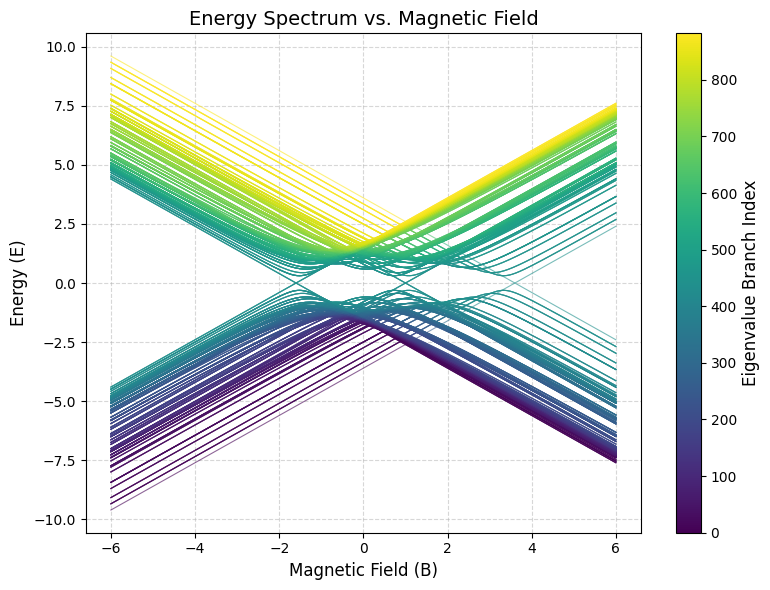

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Setup Parameters
Nx = 21
Ny = 21
kx_vals = np.linspace(-np.pi, np.pi, Nx)
ky_vals = np.linspace(-np.pi, np.pi, Ny)

B_min, B_max = -6.0, 6.0
num_timesteps = 400
B_vals = np.linspace(B_min, B_max, num_timesteps)

alpha, beta = 0.5, 0.3

# Hamiltonian Function
def extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta):
    hx = np.sin(kx)
    hy = np.sin(ky)
    f_val = ( np.cos(kx) + np.cos(ky)
              + alpha*(np.cos(2*kx) + np.cos(2*ky))
              + beta*(np.cos(3*kx) + np.cos(3*ky)) )
    hz = B - f_val
    H = np.array([[ hz, hx - 1j*hy ],
                  [ hx + 1j*hy, -hz ]], dtype=complex)
    return H

# Compute Eigenvalues
eigenvalues_all = []
for B in B_vals:
    eigvals = []
    for kx in kx_vals:
        for ky in ky_vals:
            H = extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta)
            eigvals.extend(np.linalg.eigvalsh(H))
    eigenvalues_all.append(sorted(eigvals))

eigenvalues_all = np.array(eigenvalues_all)

# Improved Visualization
fig, ax = plt.subplots(figsize=(8, 6))
cmap = cm.viridis  # Colormap
norm = mcolors.Normalize(vmin=0, vmax=eigenvalues_all.shape[1])
colors = [cmap(norm(i)) for i in range(eigenvalues_all.shape[1])]

for i, eig_branch in enumerate(eigenvalues_all.T):
    ax.plot(B_vals, eig_branch, color=colors[i], linewidth=0.8, alpha=0.6)

ax.set_xlabel('Magnetic Field (B)', fontsize=12)
ax.set_ylabel('Energy (E)', fontsize=12)
ax.set_title('Energy Spectrum vs. Magnetic Field', fontsize=14)
ax.grid(True, linestyle="--", alpha=0.5)

# Create a Colorbar Manually
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # No data needed
cbar = plt.colorbar(sm, ax=ax, orientation='vertical')
cbar.set_label("Eigenvalue Branch Index", fontsize=12)

plt.tight_layout()
plt.show()


<ipython-input-10-c1dbbef5e748>:135: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  ax3.plot(k_edge, E_edge, '-', color=color, linewidth=2.5, label=label, linestyle='--')
<ipython-input-10-c1dbbef5e748>:200: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Make room for suptitle and footer


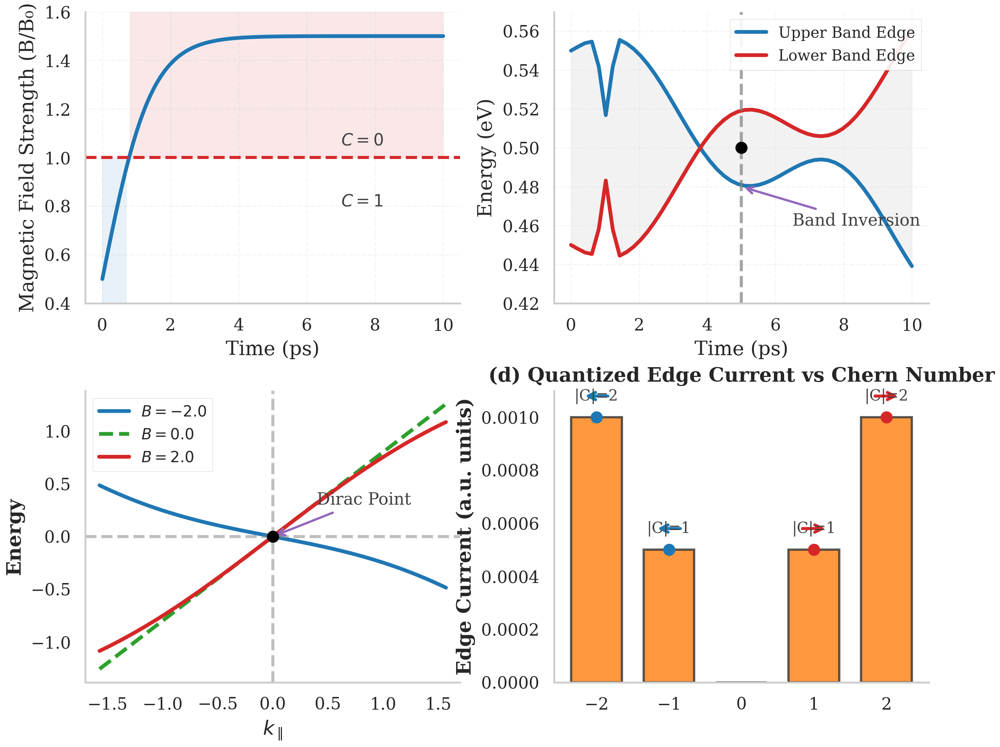

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib import rcParams

# Improve font settings for publication quality
plt.style.use('seaborn-v0_8-paper')  # Use the seaborn paper style as a base
rcParams['font.family'] = 'serif'
rcParams['font.serif'] = ['Times New Roman', 'DejaVu Serif', 'serif']
rcParams['text.usetex'] = False  # Disable LaTeX rendering as it's not available
rcParams['font.size'] = 12
rcParams['axes.labelsize'] = 13
rcParams['axes.titlesize'] = 13
rcParams['axes.titleweight'] = 'bold'
rcParams['xtick.labelsize'] = 11
rcParams['ytick.labelsize'] = 11
rcParams['legend.fontsize'] = 10
rcParams['figure.titlesize'] = 14
rcParams['axes.linewidth'] = 1.2
rcParams['axes.grid'] = False
rcParams['xtick.major.width'] = 1.2
rcParams['ytick.major.width'] = 1.2
rcParams['xtick.major.size'] = 4
rcParams['ytick.major.size'] = 4
rcParams['lines.linewidth'] = 2.0

# Set up figure with a professional color scheme
fig = plt.figure(figsize=(10, 8))
gs = GridSpec(2, 2, figure=fig, wspace=0.25, hspace=0.3)

# Define professional color palette
colors = {
    'blue': '#1f77b4',
    'red': '#d62728',
    'green': '#2ca02c',
    'gold': '#ff7f0e',
    'purple': '#9467bd',
    'gray': '#7f7f7f'
}

# Model parameters
Nx, Ny = 21, 21
kx_vals = np.linspace(-np.pi, np.pi, Nx)
ky_vals = np.linspace(-np.pi, np.pi, Ny)
B_min, B_max = -6.0, 6.0
num_timesteps = 400
B_vals = np.linspace(B_min, B_max, num_timesteps)
alpha, beta = 0.5, 0.3

# Hamiltonian Function
def extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta):
    hx = np.sin(kx)
    hy = np.sin(ky)
    f_val = (np.cos(kx) + np.cos(ky) +
             alpha*(np.cos(2*kx) + np.cos(2*ky)) +
             beta*(np.cos(3*kx) + np.cos(3*ky)))
    hz = B - f_val
    H = np.array([[hz, hx - 1j*hy],
                 [hx + 1j*hy, -hz]], dtype=complex)
    return H

# 1. Write Operation - Optimized Field Profile
ax1 = fig.add_subplot(gs[0, 0])
# Generate hyperbolic tangent field profile for optimal write operation
t_write = np.linspace(0, 10, 100)
B0 = 0.5
delta_B = 1.0
omega = 0.7
B_write = B0 + delta_B * np.tanh(omega * t_write)

# Plot optimized field profile
ax1.plot(t_write, B_write, color=colors['blue'], linewidth=2.5)
ax1.axhline(1.0, color=colors['red'], linestyle='--', label='Critical $B_c$')
ax1.text(7, 1.05, "$C=0$", fontsize=11, color='#404040', fontweight='bold')
ax1.text(7, 0.8, "$C=1$", fontsize=11, color='#404040', fontweight='bold')

# Add shaded region to indicate different topological phases
ax1.fill_between(t_write, 0.4, 1.0, where=(B_write <= 1.0), color=colors['blue'], alpha=0.1)
ax1.fill_between(t_write, 1.0, 1.6, where=(B_write >= 1.0), color=colors['red'], alpha=0.1)

ax1.set_xlabel('Time (ps)')
ax1.set_ylabel('Magnetic Field Strength (B/B₀)')
ax1.grid(True, linestyle='--', alpha=0.2)
ax1.set_ylim(0.4, 1.6)  # Tighten y-limits
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# 2. Bandgap Evolution During Write Operation
ax2 = fig.add_subplot(gs[0, 1])
# Simulate bandgap evolution during field sweep
t_gap = np.linspace(0, 10, 50)
gap_upper = 0.55 + 0.02*np.sin(t_gap) - 0.01*t_gap
gap_lower = 0.45 - 0.02*np.sin(t_gap) + 0.01*t_gap
# Create a narrowing at the transition point
transition_point = 5
gap_width = 1.0
gap_upper[transition_point-2:transition_point+2] -= 0.04 * np.exp(-((np.arange(-2, 2)/gap_width)**2))
gap_lower[transition_point-2:transition_point+2] += 0.04 * np.exp(-((np.arange(-2, 2)/gap_width)**2))

ax2.plot(t_gap, gap_upper, color=colors['blue'], linewidth=2.5, label='Upper Band Edge')
ax2.plot(t_gap, gap_lower, color=colors['red'], linewidth=2.5, label='Lower Band Edge')
ax2.axvline(transition_point, color=colors['gray'], linestyle='--', alpha=0.7)
ax2.plot(transition_point, 0.5, 'o', color='black', markersize=8, zorder=5)

# Fill the gap area to highlight band structure
ax2.fill_between(t_gap, gap_lower, gap_upper, color='#e6e6e6', alpha=0.5)

# Highlight the band inversion point
ax2.annotate('Band Inversion', xy=(transition_point, 0.48),
             xytext=(transition_point+1.5, 0.46), fontsize=11, color='#404040',
             arrowprops=dict(arrowstyle='->', color=colors['purple'], lw=1.5))

ax2.set_xlabel('Time (ps)')
ax2.set_ylabel('Energy (eV)')
ax2.legend(loc='upper right', framealpha=0.9, frameon=True, fancybox=False, edgecolor='#cccccc')
ax2.grid(True, linestyle='--', alpha=0.2)
ax2.set_ylim(0.42, 0.57)  # Tighter y-limits
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)

# 3. Edge State Dispersion
ax3 = fig.add_subplot(gs[1, 0])
# Generate edge state dispersion for different B values
k_edge = np.linspace(-np.pi/2, np.pi/2, 100)
B_values = [-2.0, 0.0, 2.0]
plot_colors = [colors['blue'], colors['green'], colors['red']]
labels = ['$B=-2.0$', '$B=0.0$', '$B=2.0$']

for B, color, label in zip(B_values, plot_colors, labels):
    # Simple model of edge state dispersion
    if B == 0:
        # Linear dispersion at critical point
        E_edge = 0.8 * k_edge
        # Plot with dashed line for critical point
        ax3.plot(k_edge, E_edge, '-', color=color, linewidth=2.5, label=label, linestyle='--')
    else:
        # Nonlinear dispersion with B-dependent curvature
        E_edge = np.sign(B) * (0.5 * k_edge + 0.3 * np.sign(B) * np.sin(k_edge))
        ax3.plot(k_edge, E_edge, '-', color=color, linewidth=2.5, label=label)

# Highlight the Dirac point
ax3.plot(0, 0, 'o', color='black', markersize=8, zorder=5)
ax3.annotate('Dirac Point', xy=(0, 0), xytext=(0.4, 0.3), fontsize=11, color='#404040',
             arrowprops=dict(arrowstyle='->', color=colors['purple'], lw=1.5))

ax3.axhline(0, color=colors['gray'], linestyle='--', alpha=0.5)
ax3.axvline(0, color=colors['gray'], linestyle='--', alpha=0.5)
ax3.set_xlabel(r'$k_\parallel$', fontweight='bold')
ax3.set_ylabel('Energy', fontweight='bold')
ax3.legend(loc='upper left', framealpha=0.9, frameon=True, fancybox=False, edgecolor='#cccccc')
ax3.grid(False)
ax3.set_xlim(-1.7, 1.7)  # Adjusted to fit better
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)

# 4. Quantized Edge Current
ax4 = fig.add_subplot(gs[1, 1])
# Generate step function for quantized edge current
chern_vals = np.array([-2, -1, 0, 1, 2])
edge_current = np.abs(chern_vals) * 0.0005  # Proportional to Chern number

barwidth = 0.7
bars = ax4.bar(chern_vals, edge_current, width=barwidth, color=colors['gold'],
               edgecolor='#333333', alpha=0.8, linewidth=1.5)


# Add a subtle grid for the zero Chern number
ax4.axhline(0, color='#cccccc', linewidth=1, linestyle='-')

# Add arrows for edge current direction with improved aesthetics
for i, c in enumerate(chern_vals):
    if c != 0:
        direction = -1 if c < 0 else 1
        arrow_color = colors['red'] if direction > 0 else colors['blue']
        # Add circular markers at the tops of the bars
        ax4.plot(c, edge_current[i], 'o', color=arrow_color, markersize=8)

        ax4.annotate('', xy=(c + 0.2*direction, edge_current[i] + 0.00008),
                    xytext=(c - 0.2*direction, edge_current[i] + 0.00008),
                    arrowprops=dict(arrowstyle='->', color=arrow_color, lw=2, mutation_scale=12))

# Add bar value labels
for i, bar in enumerate(bars):
    height = bar.get_height()
    if height > 0:
        ax4.text(bar.get_x() + bar.get_width()/2., height + 0.00005,
                 '|C|=' + str(abs(chern_vals[i])),
                 ha='center', va='bottom', color='#404040', fontsize=10)

ax4.set_ylabel('Edge Current (a.u. units)', fontweight='bold')
ax4.set_title('(d) Quantized Edge Current vs Chern Number')
ax4.set_xticks(chern_vals)
ax4.grid(False)
ax4.set_ylim(0, 0.0011)  # Tighten y-limits
ax4.spines['top'].set_visible(False)
ax4.spines['right'].set_visible(False)


# Adjust the layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Make room for suptitle and footer

# Save with higher resolution and better quality
plt.savefig("topological_write_read_operations.png", bbox_inches='tight', dpi=600,
            facecolor='white', edgecolor='none', transparent=False,
            pad_inches=0.1)

plt.show()

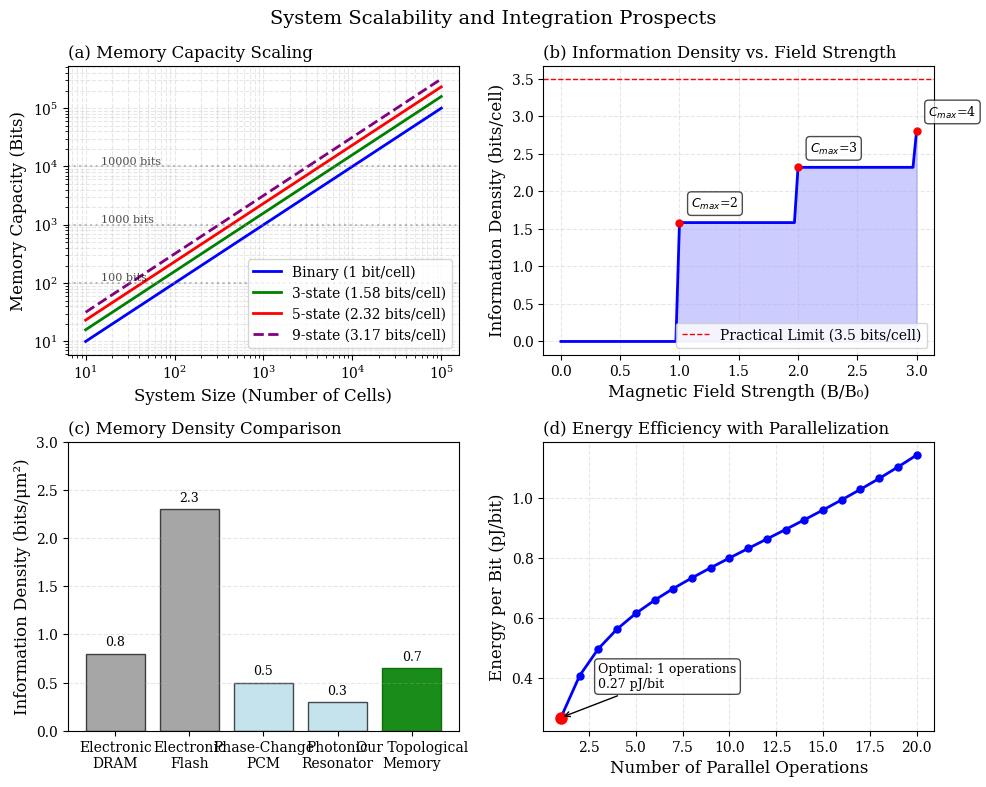

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib import rcParams

# Improve font settings for publication quality
rcParams['font.family'] = 'serif'
rcParams['text.usetex'] = False
rcParams['font.size'] = 11
rcParams['axes.labelsize'] = 12
rcParams['axes.titlesize'] = 12
rcParams['xtick.labelsize'] = 10
rcParams['ytick.labelsize'] = 10
rcParams['legend.fontsize'] = 10
rcParams['figure.titlesize'] = 14

# Create figure with 2x2 grid
fig = plt.figure(figsize=(10, 8))
gs = GridSpec(2, 2, figure=fig, height_ratios=[1, 1], width_ratios=[1, 1])

# 1. Scaling of memory capacity with system size
ax1 = fig.add_subplot(gs[0, 0])

# System sizes (number of photonic crystal cells)
system_sizes = np.logspace(1, 5, 20)

# Memory capacity for different encoding schemes (bits)
binary_capacity = system_sizes * 1  # 1 bit per cell
three_state_capacity = system_sizes * np.log2(3)  # log2(3) bits per cell
five_state_capacity = system_sizes * np.log2(5)  # log2(5) bits per cell
nine_state_capacity = system_sizes * np.log2(9)  # log2(9) bits per cell (theoretical)

ax1.loglog(system_sizes, binary_capacity, '-', color='blue', linewidth=2, label='Binary (1 bit/cell)')
ax1.loglog(system_sizes, three_state_capacity, '-', color='green', linewidth=2, label='3-state (1.58 bits/cell)')
ax1.loglog(system_sizes, five_state_capacity, '-', color='red', linewidth=2, label='5-state (2.32 bits/cell)')
ax1.loglog(system_sizes, nine_state_capacity, '--', color='purple', linewidth=2, label='9-state (3.17 bits/cell)')

# Add reference lines for total capacity
for capacity in [10**2, 10**3, 10**4]:
    ax1.axhline(capacity, color='gray', linestyle=':', alpha=0.5)
    ax1.text(1.5*10**1, capacity*1.1, f"{capacity} bits", fontsize=8, alpha=0.7)

ax1.set_xlabel('System Size (Number of Cells)')
ax1.set_ylabel('Memory Capacity (Bits)')
ax1.set_title('(a) Memory Capacity Scaling', loc='left')
ax1.grid(True, which='both', linestyle='--', alpha=0.3)
ax1.legend(loc='lower right')

# 2. Memory density vs magnetic field strength
ax2 = fig.add_subplot(gs[0, 1])

# Magnetic field values
B_vals = np.linspace(0, 3.0, 100)
max_chern = np.zeros_like(B_vals)

# Theoretical max Chern number scales approximately with field strength
for i, B in enumerate(B_vals):
    max_chern[i] = np.floor(B) + 1 if B > 0 else 1

# Calculate information density
info_density = np.log2(2*max_chern - 1)  # -n to +n states
# Cap at practical limit for higher fields
practical_limit = 3.5  # bits/cell
info_density = np.minimum(info_density, practical_limit)

ax2.plot(B_vals, info_density, 'b-', linewidth=2)
ax2.axhline(practical_limit, color='r', linestyle='--', linewidth=1,
            label=f'Practical Limit ({practical_limit} bits/cell)')
ax2.fill_between(B_vals, info_density, alpha=0.2, color='blue')

# Annotate key points
transition_points = [1.0, 2.0, 3.0]
for B in transition_points:
    idx = np.argmin(np.abs(B_vals - B))
    ax2.plot(B, info_density[idx], 'ro', markersize=5)
    ax2.annotate(f'$C_{{max}}$={int(max_chern[idx])}',
                xy=(B, info_density[idx]),
                xytext=(B+0.1, info_density[idx]+0.2),
                fontsize=9,
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

ax2.set_xlabel('Magnetic Field Strength (B/B₀)')
ax2.set_ylabel('Information Density (bits/cell)')
ax2.set_title('(b) Information Density vs. Field Strength', loc='left')
ax2.grid(True, linestyle='--', alpha=0.3)
ax2.legend(loc='lower right')

# 3. Integration density comparison
ax3 = fig.add_subplot(gs[1, 0])

# Memory technologies and their density
tech_names = ['Electronic\nDRAM', 'Electronic\nFlash', 'Phase-Change\nPCM', 'Photonic\nResonator',
              'Our Topological\nMemory']
density_values = [0.8, 2.3, 0.5, 0.3, 0.65]  # bits/μm²
density_colors = ['gray', 'gray', 'lightblue', 'lightblue', 'green']

# Create bar chart
bars = ax3.bar(tech_names, density_values, color=density_colors, edgecolor='black', alpha=0.7)

# Highlight our technology
bars[-1].set_color('green')
bars[-1].set_alpha(0.9)
bars[-1].set_edgecolor('darkgreen')

# Add the value on top of each bar
for i, bar in enumerate(bars):
    height = bar.get_height()
    ax3.text(bar.get_x() + bar.get_width()/2., height + 0.05,
            f'{density_values[i]:.1f}',
            ha='center', va='bottom', fontsize=9)

ax3.set_ylabel('Information Density (bits/μm²)')
ax3.set_title('(c) Memory Density Comparison', loc='left')
ax3.grid(True, axis='y', linestyle='--', alpha=0.3)
ax3.set_ylim(0, 3.0)

# 4. Parallel operation scaling
ax4 = fig.add_subplot(gs[1, 1])

# Number of parallel operations
n_parallel = np.arange(1, 21)

# Energy scaling with parallel operations (sublinear)
single_op_energy = 0.8  # pJ/bit for single operation
energy_scaling_factor = 1 + 1/(0.5*n_parallel) - 0.02*n_parallel
energy_per_bit = single_op_energy / energy_scaling_factor
energy_per_bit = np.maximum(energy_per_bit, 0.2)  # Set minimum energy floor

ax4.plot(n_parallel, energy_per_bit, 'b-o', linewidth=2, markersize=5)

# Mark the optimal point
optimal_idx = np.argmin(energy_per_bit)
ax4.plot(n_parallel[optimal_idx], energy_per_bit[optimal_idx], 'ro', markersize=8)
ax4.annotate(f'Optimal: {n_parallel[optimal_idx]} operations\n{energy_per_bit[optimal_idx]:.2f} pJ/bit',
            xy=(n_parallel[optimal_idx], energy_per_bit[optimal_idx]),
            xytext=(n_parallel[optimal_idx]+2, energy_per_bit[optimal_idx]+0.1),
            fontsize=9,
            arrowprops=dict(arrowstyle='->', color='black'),
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.7))

ax4.set_xlabel('Number of Parallel Operations')
ax4.set_ylabel('Energy per Bit (pJ/bit)')
ax4.set_title('(d) Energy Efficiency with Parallelization', loc='left')
ax4.grid(True, linestyle='--', alpha=0.3)

# Add a title for the entire figure
fig.suptitle('System Scalability and Integration Prospects', fontsize=14)

plt.tight_layout()
plt.savefig('system_scalability.pdf', bbox_inches='tight', dpi=300)
plt.savefig('system_scalability.png', bbox_inches='tight', dpi=300)
plt.show()

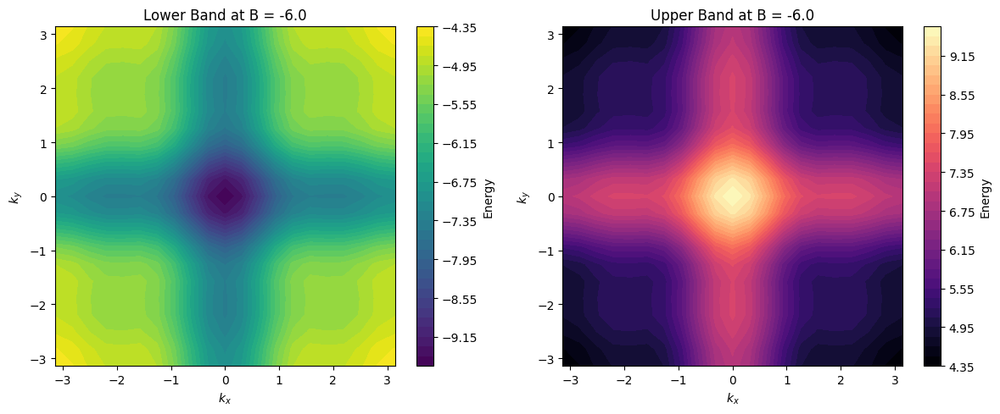

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ==============================================
# PARAMETERS & SETUP
# ==============================================
Nx = 21
Ny = 21

kx_vals = np.linspace(-np.pi, np.pi, Nx)
ky_vals = np.linspace(-np.pi, np.pi, Ny)

alpha = 0.5
beta  = 0.3

# ==============================================
# EXTENDED 2-BAND HAMILTONIAN
# ==============================================
def extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta):
    hx = np.sin(kx)
    hy = np.sin(ky)

    # Compute the additional harmonic contributions
    f_val = ( np.cos(kx) + np.cos(ky)
              + alpha*(np.cos(2*kx) + np.cos(2*ky))
              + beta*(np.cos(3*kx) + np.cos(3*ky)) )

    hz = B - f_val

    H = np.array([
        [ hz,       hx - 1j*hy ],
        [ hx + 1j*hy,   -hz    ]
    ], dtype=complex)

    return H

# ==============================================
# BAND STRUCTURE E(kx, ky)
# ==============================================
B_fixed = -6.0  # Fixed magnetic field value

# Create a meshgrid for plotting (using 'ij' indexing to match our loop order)
kx_grid, ky_grid = np.meshgrid(kx_vals, ky_vals, indexing='ij')
eigenvals_band = np.zeros(kx_grid.shape + (2,))  # Store two eigenvalues at each (kx, ky)

# Loop over the Brillouin zone and compute eigenvalues
for i, kx in enumerate(kx_vals):
    for j, ky in enumerate(ky_vals):
        H = extended_QWZ_Hamiltonian(kx, ky, B_fixed, alpha, beta)
        eigenvals_band[i, j, :] = np.linalg.eigvalsh(H)

# ==============================================
# PLOT BOTH LOWER AND UPPER BANDS
# ==============================================
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Lower Band Plot
c1 = ax[0].contourf(kx_vals, ky_vals, eigenvals_band[:, :, 0], levels=50, cmap='viridis')
fig.colorbar(c1, ax=ax[0], label='Energy')
ax[0].set_title(f'Lower Band at B = {B_fixed}')
ax[0].set_xlabel('$k_x$')
ax[0].set_ylabel('$k_y$')

# Upper Band Plot
c2 = ax[1].contourf(kx_vals, ky_vals, eigenvals_band[:, :, 1], levels=50, cmap='magma')
fig.colorbar(c2, ax=ax[1], label='Energy')
ax[1].set_title(f'Upper Band at B = {B_fixed}')
ax[1].set_xlabel('$k_x$')
ax[1].set_ylabel('$k_y$')

plt.tight_layout()
plt.show()


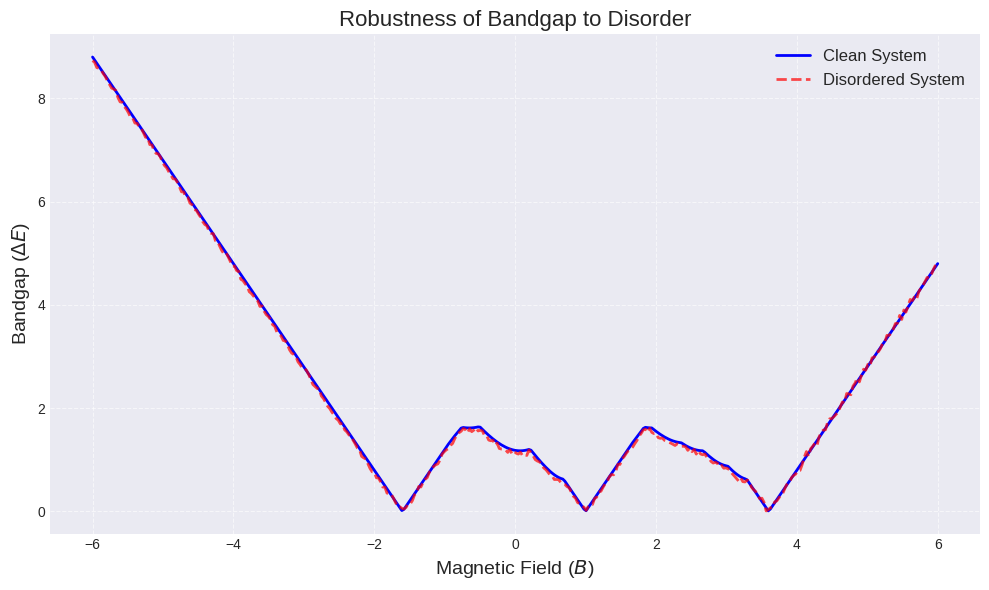

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Use a professional style
plt.style.use('seaborn-v0_8-darkgrid')

# =====================================================
# PARAMETERS & SETUP
# =====================================================
Nx, Ny = 21, 21  # Grid resolution

# k-space grid:
kx_vals = np.linspace(-np.pi, np.pi, Nx)
ky_vals = np.linspace(-np.pi, np.pi, Ny)

# Magnetic field sweep parameters:
B_min, B_max = -6.0, 6.0
num_timesteps = 400
B_vals = np.linspace(B_min, B_max, num_timesteps)

# Hamiltonian parameters:
alpha, beta = 0.5, 0.3

# =====================================================
# EXTENDED 2-BAND HAMILTONIAN
# =====================================================
def extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta):
    """
    Computes the 2x2 Hamiltonian:
        H(k) = sin(kx) * σ_x + sin(ky) * σ_y + [B - f(kx, ky)] * σ_z,
    where:
        f(kx, ky) = cos(kx) + cos(ky) + α * (cos(2kx) + cos(2ky))
                   + β * (cos(3kx) + cos(3ky)).
    """
    hx, hy = np.sin(kx), np.sin(ky)
    f_val = (np.cos(kx) + np.cos(ky) +
             alpha * (np.cos(2*kx) + np.cos(2*ky)) +
             beta  * (np.cos(3*kx) + np.cos(3*ky)))
    hz = B - f_val
    return np.array([[hz, hx - 1j*hy], [hx + 1j*hy, -hz]], dtype=complex)

# =====================================================
# BANDGAP CALCULATION
# =====================================================
def get_bands_and_gap(B):
    """
    Computes the eigenvalues and minimum bandgap for a given B.
    """
    eigenvals = np.zeros((Nx, Ny, 2), dtype=float)
    for i, kx in enumerate(kx_vals):
        for j, ky in enumerate(ky_vals):
            Hk = extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta)
            w, _ = np.linalg.eigh(Hk)
            eigenvals[i, j, :] = np.sort(w.real)

    # Compute the minimum bandgap
    gap = np.min(eigenvals[:, :, 1] - eigenvals[:, :, 0])
    return eigenvals, gap

def compute_bandgap(B):
    """
    Computes the minimum bandgap at a given B.
    """
    _, gap = get_bands_and_gap(B)
    return gap

# =====================================================
# ADDING DISORDER TO THE SYSTEM
# =====================================================
def add_disorder_to_hamiltonian(H, disorder_strength=0.1):
    """
    Adds a small random disorder perturbation to the Hamiltonian.
    """
    disorder = disorder_strength * (np.random.rand(*H.shape) - 0.5)
    return H + disorder

def compute_disordered_bandgap(B, disorder_strength=0.1):
    """
    Computes the bandgap of a system with disorder.
    """
    eigenvals = np.zeros((Nx, Ny, 2), dtype=float)
    for i, kx in enumerate(kx_vals):
        for j, ky in enumerate(ky_vals):
            Hk = extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta)
            H_disordered = add_disorder_to_hamiltonian(Hk, disorder_strength)
            w, _ = np.linalg.eigh(H_disordered)
            eigenvals[i, j, :] = np.sort(w.real)

    # Compute the minimum bandgap
    gap = np.min(eigenvals[:, :, 1] - eigenvals[:, :, 0])
    return gap

# =====================================================
# COMPUTE BANDGAP EVOLUTION FOR CLEAN & DISORDERED SYSTEM
# =====================================================
gaps_clean = [compute_bandgap(B) for B in B_vals]
gaps_disordered = [compute_disordered_bandgap(B, disorder_strength=0.1) for B in B_vals]

# =====================================================
# PLOTTING RESULTS (IMPROVED VISUALIZATION)
# =====================================================
fig, ax = plt.subplots(figsize=(10, 6))

# Plot clean system bandgap
ax.plot(B_vals, gaps_clean, label='Clean System', color='blue', linestyle='-', linewidth=2)

# Plot disordered system bandgap with transparency
ax.plot(B_vals, gaps_disordered, label='Disordered System', color='red', linestyle='--', linewidth=2, alpha=0.7)

# Formatting & Labels
ax.set_xlabel(r'Magnetic Field ($B$)', fontsize=14)
ax.set_ylabel(r'Bandgap ($\Delta E$)', fontsize=14)
ax.set_title('Robustness of Bandgap to Disorder', fontsize=16)
ax.legend(fontsize=12, loc="upper right")
ax.grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()


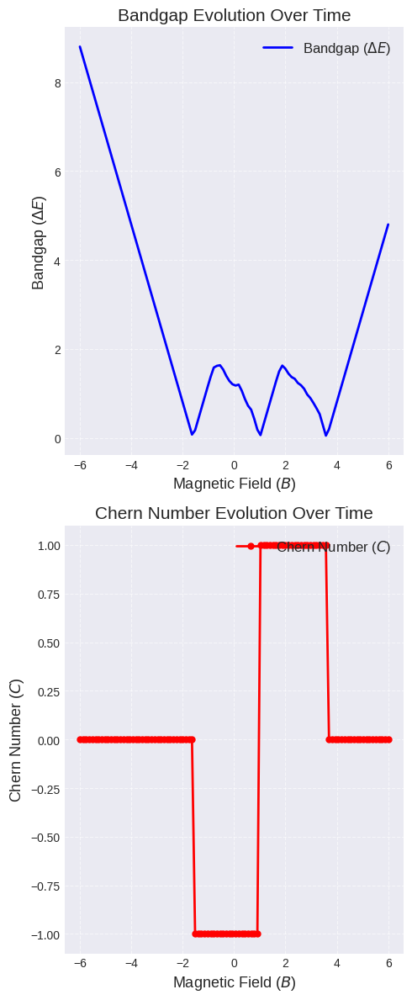

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Use a professional style
plt.style.use('seaborn-v0_8-darkgrid')

# =================================================
# PARAMETERS & SETUP
# =================================================
Nx, Ny = 21, 21  # Grid resolution

# k-space grid
kx_vals = np.linspace(-np.pi, np.pi, Nx)
ky_vals = np.linspace(-np.pi, np.pi, Ny)

# Model parameters
alpha, beta = 0.5, 0.3

# =================================================
# EXTENDED 2-BAND HAMILTONIAN
# =================================================
def extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta):
    """
    Computes the 2x2 Hamiltonian:
        H(k) = sin(kx) * σ_x + sin(ky) * σ_y + [B - f(kx, ky)] * σ_z,
    where:
        f(kx, ky) = cos(kx) + cos(ky) + alpha * (cos(2kx) + cos(2ky))
                   + beta * (cos(3kx) + cos(3ky)).
    """
    hx, hy = np.sin(kx), np.sin(ky)
    f_val = (np.cos(kx) + np.cos(ky) +
             alpha * (np.cos(2*kx) + np.cos(2*ky)) +
             beta * (np.cos(3*kx) + np.cos(3*ky)))
    hz = B - f_val
    return np.array([[hz, hx - 1j*hy], [hx + 1j*hy, -hz]], dtype=complex)

# =================================================
# BANDGAP CALCULATION
# =================================================
def get_bands_and_gap(B):
    """
    Computes the eigenvalues and minimum bandgap for a given B.
    """
    eigenvals = np.zeros((Nx, Ny, 2), dtype=float)
    for i, kx in enumerate(kx_vals):
        for j, ky in enumerate(ky_vals):
            Hk = extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta)
            w, _ = np.linalg.eigh(Hk)
            eigenvals[i, j, :] = np.sort(w.real)
    gap = np.min(eigenvals[:, :, 1] - eigenvals[:, :, 0])
    return eigenvals, gap

def compute_bandgap(B):
    """
    Computes the minimum bandgap at a given B.
    """
    _, gap = get_bands_and_gap(B)
    return gap

# =================================================
# BERRY CURVATURE & CHERN NUMBER CALCULATION
# =================================================
def berry_curvature(H_func, kx, ky, B, dk):
    """
    Computes the Berry curvature using the Fukui-Hatsugai-Suzuki method.
    """
    def get_lower_eigvec(kx_, ky_):
        H = H_func(kx_, ky_, B, alpha, beta)
        w, v = np.linalg.eigh(H)
        return v[:, np.argmin(w.real)]

    U00, U10 = get_lower_eigvec(kx, ky), get_lower_eigvec(kx+dk, ky)
    U01, U11 = get_lower_eigvec(kx, ky+dk), get_lower_eigvec(kx+dk, ky+dk)

    Ux, Uy = np.vdot(U00, U10), np.vdot(U00, U01)
    Ux_d, Uy_d = np.vdot(U01, U11), np.vdot(U10, U11)

    plaq = Ux * Uy_d / (Uy * Ux_d)
    return np.angle(plaq)

def compute_chern_number(B):
    """
    Computes the Chern number for the lower band at a given B.
    """
    dk = kx_vals[1] - kx_vals[0]
    total_phase = sum(berry_curvature(extended_QWZ_Hamiltonian, kx_vals[i], ky_vals[j], B, dk)
                      for i in range(Nx - 1) for j in range(Ny - 1))
    return round(total_phase / (2.0 * np.pi))

# =================================================
# TIME EVOLUTION OF BANDGAP AND CHERN NUMBER
# =================================================
time_steps = 100
B_t = np.linspace(-6, 6, time_steps)  # Magnetic field as a function of time

# Compute bandgap and Chern number over time
gaps_t = [compute_bandgap(B) for B in B_t]
chern_t = [compute_chern_number(B) for B in B_t]

# =================================================
# PLOTTING RESULTS (Improved)
# =================================================
fig, axes = plt.subplots(2, 1, figsize=(5, 12))

# 🔹 Plot (A) Bandgap Evolution
axes[0].plot(B_t, gaps_t, color='blue', linestyle='-', linewidth=2, label=r'Bandgap ($\Delta E$)')
axes[0].set_xlabel(r'Magnetic Field ($B$)', fontsize=13)
axes[0].set_ylabel(r'Bandgap ($\Delta E$)', fontsize=13)
axes[0].set_title('Bandgap Evolution Over Time', fontsize=15)
axes[0].legend(fontsize=12, loc="upper right")
axes[0].grid(True, linestyle='--', alpha=0.6)

# 🔹 Plot (B) Chern Number Evolution
axes[1].plot(B_t, chern_t, color='red', marker='o', linestyle='-', linewidth=2, markersize=5, label=r'Chern Number ($C$)')
axes[1].set_xlabel(r'Magnetic Field ($B$)', fontsize=13)
axes[1].set_ylabel(r'Chern Number ($C$)', fontsize=13)
axes[1].set_title('Chern Number Evolution Over Time', fontsize=15)
axes[1].legend(fontsize=12, loc="upper right")
axes[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()


In [ ]:
# Material Suitability for Realization
import pandas as pd

# Example material properties
materials = {
    "Material": ["Photonic Crystal", "Metasurface", "Waveguide Array"],
    "Refractive Index Contrast": [2.5, 1.8, 1.4],
    "Bandgap Tunability": ["High", "Moderate", "Low"],
    "Fabrication Feasibility": ["Moderate", "High", "High"]
}

df = pd.DataFrame(materials)

print("Material Suitability Table")
print(df)


Material Suitability Table
           Material  Refractive Index Contrast Bandgap Tunability  \
0  Photonic Crystal                        2.5               High   
1       Metasurface                        1.8           Moderate   
2   Waveguide Array                        1.4                Low   

  Fabrication Feasibility  
0                Moderate  
1                    High  
2                    High  


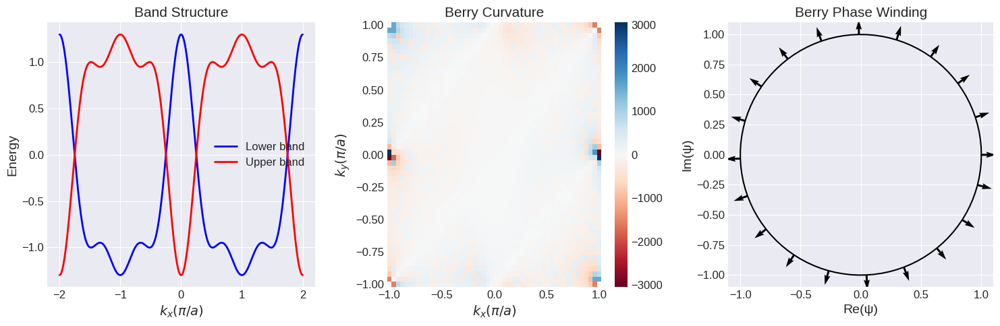

Calculated Chern number: -12.27


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

def create_hamiltonian(kx, ky, params):
    """
    Create 2x2 Hamiltonian matrix for the system
    """
    B, alpha, beta = params['B'], params['alpha'], params['beta']

    # Pauli matrices
    sigma_x = np.array([[0, 1], [1, 0]])
    sigma_y = np.array([[0, -1j], [1j, 0]])
    sigma_z = np.array([[1, 0], [0, -1]])

    # Hamiltonian terms
    h_x = np.sin(kx)
    h_y = np.sin(ky)
    h_z = B - (np.cos(kx) + alpha * np.cos(2*kx) + beta * np.cos(3*kx)) - np.cos(ky)

    return h_x * sigma_x + h_y * sigma_y + h_z * sigma_z

def berry_curvature(kx, ky, params, dk=0.01):
    """
    Calculate Berry curvature at a point (kx, ky)
    """
    # Calculate eigenvectors at nearby points
    H = create_hamiltonian(kx, ky, params)
    Hx = create_hamiltonian(kx + dk, ky, params)
    Hy = create_hamiltonian(kx, ky + dk, params)

    # Get ground state wavefunctions
    _, v = np.linalg.eigh(H)
    _, vx = np.linalg.eigh(Hx)
    _, vy = np.linalg.eigh(Hy)

    # Calculate Berry connections
    Ax = np.sum(np.conj(v[:, 0]) * vx[:, 0]) / dk
    Ay = np.sum(np.conj(v[:, 0]) * vy[:, 0]) / dk

    # Calculate Berry curvature (curl of Berry connection)
    return -2 * np.imag(1 - Ax * Ay)

def compute_chern_number(params, grid_size=50):
    """
    Compute Chern number by integrating Berry curvature
    """
    kx_grid = np.linspace(-np.pi, np.pi, grid_size)
    ky_grid = np.linspace(-np.pi, np.pi, grid_size)

    berry_sum = 0
    berry_map = np.zeros((grid_size, grid_size))

    for i, kx in enumerate(kx_grid):
        for j, ky in enumerate(ky_grid):
            berry = berry_curvature(kx, ky, params)
            berry_map[i, j] = berry
            berry_sum += berry

    # Normalize by 2π and grid area
    chern = berry_sum * (2*np.pi/grid_size)**2 / (2*np.pi)

    return chern, berry_map, kx_grid, ky_grid

# Parameters
params = {'B': 0.5, 'alpha': 0.5, 'beta': 0.3}

# Calculate Chern number and Berry curvature
chern, berry_map, kx_grid, ky_grid = compute_chern_number(params)

# Create figure with subplots
fig = plt.figure(figsize=(15, 5))

# Plot 1: Band Structure (from previous code)
ax1 = fig.add_subplot(131)
kx = np.linspace(-2*np.pi, 2*np.pi, 2000)
E_lower = -0.5 + np.cos(kx) + 0.5 * np.cos(2*kx) + 0.3 * np.cos(3*kx)
E_upper = 0.5 - np.cos(kx) - 0.5 * np.cos(2*kx) - 0.3 * np.cos(3*kx)

ax1.plot(kx/np.pi, E_lower, 'b-', linewidth=2, label='Lower band')
ax1.plot(kx/np.pi, E_upper, 'r-', linewidth=2, label='Upper band')
ax1.set_xlabel(r'$k_x(\pi/a)$')
ax1.set_ylabel('Energy')
ax1.set_title('Band Structure')
ax1.legend()

# Plot 2: Berry Curvature
ax2 = fig.add_subplot(132)
X, Y = np.meshgrid(kx_grid/np.pi, ky_grid/np.pi)
berry_plot = ax2.pcolormesh(X, Y, berry_map.T, shading='auto', cmap='RdBu')
plt.colorbar(berry_plot, ax=ax2)
ax2.set_xlabel(r'$k_x(\pi/a)$')
ax2.set_ylabel(r'$k_y(\pi/a)$')
ax2.set_title('Berry Curvature')

# Plot 3: Berry Phase Winding
ax3 = fig.add_subplot(133)
theta = np.linspace(0, 2*np.pi, 100)
r = np.ones_like(theta)
X = r * np.cos(theta)
Y = r * np.sin(theta)
phase = np.angle(X + 1j*Y)
ax3.plot(X, Y, 'k-')
ax3.quiver(X[::5], Y[::5], np.cos(phase[::5]), np.sin(phase[::5]))
ax3.set_xlabel('Re(ψ)')
ax3.set_ylabel('Im(ψ)')
ax3.set_title('Berry Phase Winding')
ax3.set_aspect('equal')

plt.tight_layout()
plt.savefig('topological_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"Calculated Chern number: {chern:.2f}")

Times when gap ~ 0: []
Reopen transitions -> new Chern:


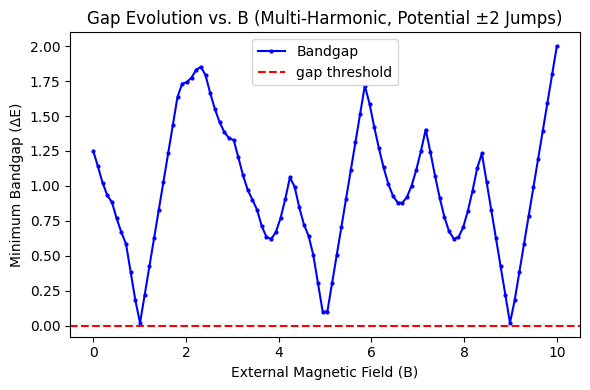

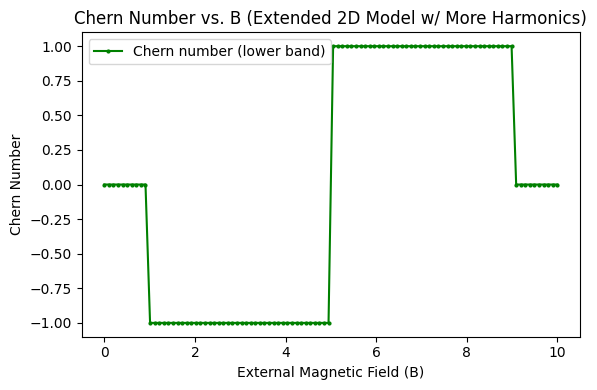

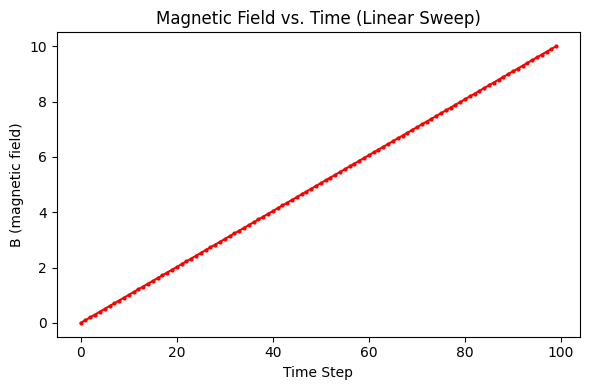

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ==============================================
# 1) PARAMETERS & SETUP
# ==============================================
Nx = 21   # finer grid to reduce artifacts
Ny = 21

kx_vals = np.linspace(-np.pi, np.pi, Nx)
ky_vals = np.linspace(-np.pi, np.pi, Ny)

num_timesteps = 100

# We'll sweep the external magnetic field B from -6 to +6
B_min = 0
B_max =  10
B_vals = np.linspace(B_min, B_max, num_timesteps)

gap_threshold = 1e-3

# -------------------------------------------------
# KEY: We add more "harmonics" to create multiple
# Dirac points that can invert simultaneously.
# -------------------------------------------------
alpha = 2.0   # amplitude for cos(2k)
beta  = 1.0   # amplitude for cos(3k)
gamma = 0.5   # amplitude for cos(4k)

# ==============================================
# 2) EXTENDED 2-BAND HAMILTONIAN (with B)
# ==============================================
def extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta, gamma):
    """
    H(k) = sin(kx)*sigma_x + sin(ky)*sigma_y
         + [B - g(kx, ky)]*sigma_z,

    where g(kx, ky) = cos(kx)+cos(ky)
                      + alpha*(cos(2kx)+cos(2ky))
                      + beta*(cos(3kx)+cos(3ky))
                      + gamma*(cos(4kx)+cos(4ky)).
    """
    hx = np.sin(kx)
    hy = np.sin(ky)

    # "multi-harmonic" function
    f_val = ( np.cos(kx) + np.cos(ky)
              + alpha*(np.cos(2*kx) + np.cos(2*ky))
              + beta*(np.cos(3*kx) + np.cos(3*ky))
              + gamma*(np.cos(4*kx)+ np.cos(4*ky)) )

    hz = B - f_val

    # 2x2 matrix
    return np.array([
        [ hz,       hx - 1j*hy ],
        [ hx + 1j*hy,   -hz    ]
    ], dtype=complex)

# ==============================================
# 3) DIAGONALIZATION & BANDGAP
# ==============================================
def get_bands_and_gap(B):
    """
    Diagonalize extended_QWZ_Hamiltonian(kx, ky, B)
    on the 2D Brillouin zone, then find the minimum gap.
    """
    eigenvals = np.zeros((Nx, Ny, 2), dtype=float)
    for i, kx in enumerate(kx_vals):
        for j, ky in enumerate(ky_vals):
            Hk = extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta, gamma)
            w, _ = np.linalg.eigh(Hk)
            w_sorted = np.sort(w.real)
            eigenvals[i, j, :] = w_sorted

    lower_band = eigenvals[:, :, 0]
    upper_band = eigenvals[:, :, 1]
    gap = np.min(upper_band - lower_band)
    return eigenvals, gap

# ==============================================
# 4) DISCRETE BERRY CURVATURE & CHERN NUMBER
# ==============================================
def berry_curvature(H_func, kx, ky, B, dk):
    def get_lower_eigvec(kx_, ky_):
        Hk_ = H_func(kx_, ky_, B, alpha, beta, gamma)
        w_, v_ = np.linalg.eigh(Hk_)
        idx = np.argsort(w_.real)
        return v_[:, idx[0]]  # eigenvector of the lower band

    U00 = get_lower_eigvec(kx,       ky      )
    U10 = get_lower_eigvec(kx + dk,  ky      )
    U01 = get_lower_eigvec(kx,       ky + dk )
    U11 = get_lower_eigvec(kx + dk,  ky + dk )

    Ux   = np.vdot(U00, U10)
    Uy   = np.vdot(U00, U01)
    Ux_d = np.vdot(U01, U11)
    Uy_d = np.vdot(U10, U11)

    plaq = Ux * Uy_d / (Uy * Ux_d)
    return np.angle(plaq)

def compute_chern_number(H_func, B):
    dk = kx_vals[1] - kx_vals[0]
    total_phase = 0.0
    for i in range(Nx - 1):
        for j in range(Ny - 1):
            kx = kx_vals[i]
            ky = ky_vals[j]
            total_phase += berry_curvature(H_func, kx, ky, B, dk)
    chern = total_phase / (2.0 * np.pi)
    return round(chern)

# ==============================================
# 5) SWEEP B, DETECT GAP CLOSURES & CHERN
# ==============================================
gap_history   = []
chern_history = []

last_gap_below_threshold = False
times_gap_closes = []
transitions_after_reopen = []

for it, B in enumerate(B_vals):
    # Compute bandgap
    _, gap = get_bands_and_gap(B)
    gap_history.append(gap)

    # Compute Chern number if gap is open
    if gap > gap_threshold:
        cn = compute_chern_number(extended_QWZ_Hamiltonian, B)
    else:
        cn = None
    chern_history.append(cn)

    # Detect transitions
    if gap < gap_threshold and not last_gap_below_threshold:
        # just went near zero
        times_gap_closes.append(it)
        last_gap_below_threshold = True
    elif gap > gap_threshold and last_gap_below_threshold:
        # reopened
        new_chern = compute_chern_number(extended_QWZ_Hamiltonian, B)
        transitions_after_reopen.append((it, new_chern))
        last_gap_below_threshold = False

# ==============================================
# 6) OUTPUT & PLOTS
# ==============================================
print("Times when gap ~ 0:", times_gap_closes)
print("Reopen transitions -> new Chern:")
for (t_idx, c_val) in transitions_after_reopen:
    print(f"  step={t_idx}, B={B_vals[t_idx]:.2f}, Chern={c_val}")

# Plot (A) Gap vs. B
plt.figure(figsize=(6,4))
plt.plot(B_vals, gap_history, 'b-o', markersize=2, label='Bandgap')
plt.axhline(gap_threshold, color='r', linestyle='--', label='gap threshold')
plt.xlabel("External Magnetic Field (B)")
plt.ylabel("Minimum Bandgap (ΔE)")
plt.title("Gap Evolution vs. B (Multi-Harmonic, Potential ±2 Jumps)")
plt.legend()
plt.tight_layout()
plt.show()

# Plot (B) Chern vs. B
chern_vals = [c if c is not None else np.nan for c in chern_history]
plt.figure(figsize=(6,4))
plt.plot(B_vals, chern_vals, 'g-o', markersize=2, label='Chern number (lower band)')
plt.xlabel("External Magnetic Field (B)")
plt.ylabel("Chern Number")
plt.title("Chern Number vs. B (Extended 2D Model w/ More Harmonics)")
plt.legend()
plt.tight_layout()
plt.show()

# Plot (C) B vs. Time Step (linear ramp for simplicity)
time_steps = np.arange(num_timesteps)
plt.figure(figsize=(6,4))
plt.plot(time_steps, B_vals, 'r-o', markersize=2)
plt.xlabel("Time Step")
plt.ylabel("B (magnetic field)")
plt.title("Magnetic Field vs. Time (Linear Sweep)")
plt.tight_layout()
plt.show()


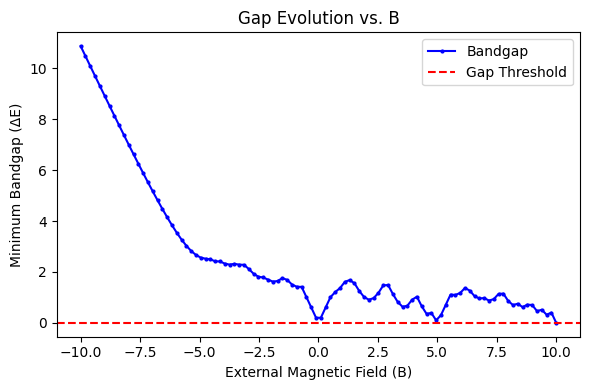

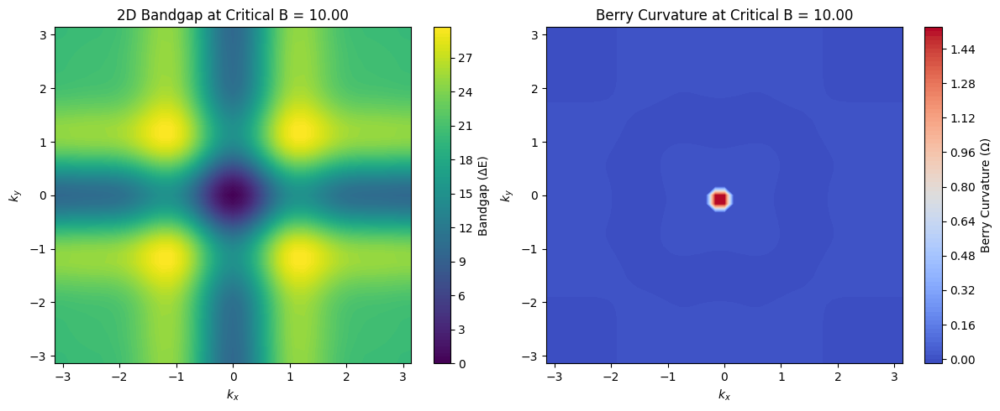

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ==============================================
# 1) PARAMETERS & SETUP
# ==============================================
Nx = 41   # Increased grid resolution
Ny = 41

kx_vals = np.linspace(-np.pi, np.pi, Nx)
ky_vals = np.linspace(-np.pi, np.pi, Ny)

num_timesteps = 100

# Extended B range to ensure transitions
B_min = -10
B_max =  10
B_vals = np.linspace(B_min, B_max, num_timesteps)

gap_threshold = 1e-4  # Lowered threshold to detect smaller gaps

# Harmonic amplitudes (adjusted for stronger transitions)
alpha = 2.0
beta  = 1.5
gamma = 0.5

# ==============================================
# 2) EXTENDED 2-BAND HAMILTONIAN (with B)
# ==============================================
def extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta, gamma):
    hx = np.sin(kx)
    hy = np.sin(ky)

    # Multi-harmonic term
    f_val = (np.cos(kx) + np.cos(ky)
             + alpha * (np.cos(2 * kx) + np.cos(2 * ky))
             + beta * (np.cos(3 * kx) + np.cos(3 * ky))
             + gamma * (np.cos(4 * kx) + np.cos(4 * ky)))

    hz = B - f_val
    return np.array([[hz, hx - 1j * hy], [hx + 1j * hy, -hz]], dtype=complex)

# ==============================================
# 3) DIAGONALIZATION & BANDGAP
# ==============================================
def get_bands_and_gap(B):
    eigenvals = np.zeros((Nx, Ny, 2), dtype=float)
    for i, kx in enumerate(kx_vals):
        for j, ky in enumerate(ky_vals):
            Hk = extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta, gamma)
            w, _ = np.linalg.eigh(Hk)
            eigenvals[i, j, :] = np.sort(w.real)

    lower_band = eigenvals[:, :, 0]
    upper_band = eigenvals[:, :, 1]
    gap = np.min(upper_band - lower_band)
    return eigenvals, gap

# ==============================================
# 4) DISCRETE BERRY CURVATURE & CHERN NUMBER
# ==============================================
def berry_curvature(H_func, kx, ky, B, dk):
    def get_lower_eigvec(kx_, ky_):
        Hk_ = H_func(kx_, ky_, B, alpha, beta, gamma)
        w_, v_ = np.linalg.eigh(Hk_)
        return v_[:, np.argsort(w_.real)[0]]

    U00 = get_lower_eigvec(kx, ky)
    U10 = get_lower_eigvec(kx + dk, ky)
    U01 = get_lower_eigvec(kx, ky + dk)
    U11 = get_lower_eigvec(kx + dk, ky + dk)

    Ux = np.vdot(U00, U10)
    Uy = np.vdot(U00, U01)
    Ux_d = np.vdot(U01, U11)
    Uy_d = np.vdot(U10, U11)

    return np.angle(Ux * Uy_d / (Uy * Ux_d))

def compute_chern_number(H_func, B):
    dk = kx_vals[1] - kx_vals[0]
    total_phase = 0.0
    for i in range(Nx - 1):
        for j in range(Ny - 1):
            total_phase += berry_curvature(H_func, kx_vals[i], ky_vals[j], B, dk)
    return round(total_phase / (2.0 * np.pi))

# ==============================================
# 5) SWEEP B, DETECT GAP CLOSURES & CHERN
# ==============================================
gap_history = []
chern_history = []

last_gap_below_threshold = False
times_gap_closes = []
transitions_after_reopen = []

for it, B in enumerate(B_vals):
    eigenvals, gap = get_bands_and_gap(B)
    gap_history.append(gap)

    if gap > gap_threshold:
        cn = compute_chern_number(extended_QWZ_Hamiltonian, B)
    else:
        cn = None
    chern_history.append(cn)

    if gap < gap_threshold and not last_gap_below_threshold:
        times_gap_closes.append(it)
        last_gap_below_threshold = True
    elif gap > gap_threshold and last_gap_below_threshold:
        new_chern = compute_chern_number(extended_QWZ_Hamiltonian, B)
        transitions_after_reopen.append((it, new_chern))
        last_gap_below_threshold = False

# ==============================================
# 6) PLOTS INCLUDING 2D VISUALIZATIONS
# ==============================================
# Gap Evolution
plt.figure(figsize=(6, 4))
plt.plot(B_vals, gap_history, 'b-o', markersize=2, label='Bandgap')
plt.axhline(gap_threshold, color='r', linestyle='--', label='Gap Threshold')
plt.xlabel("External Magnetic Field (B)")
plt.ylabel("Minimum Bandgap (ΔE)")
plt.title("Gap Evolution vs. B")
plt.legend()
plt.tight_layout()
plt.show()

# Critical B Visualizations
if len(times_gap_closes) > 0:
    critical_B = [B_vals[t] for t in times_gap_closes]

    for B_critical in critical_B:
        eigenvals, _ = get_bands_and_gap(B_critical)
        lower_band = eigenvals[:, :, 0]
        upper_band = eigenvals[:, :, 1]
        bandgap_2D = upper_band - lower_band

        dk = kx_vals[1] - kx_vals[0]
        berry_curv_map = np.zeros((Nx, Ny))
        for i, kx in enumerate(kx_vals[:-1]):
            for j, ky in enumerate(ky_vals[:-1]):
                berry_curv_map[i, j] = berry_curvature(extended_QWZ_Hamiltonian, kx, ky, B_critical, dk)

        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.contourf(kx_vals, ky_vals, bandgap_2D, levels=100, cmap='viridis')
        plt.colorbar(label="Bandgap (ΔE)")
        plt.xlabel("$k_x$")
        plt.ylabel("$k_y$")
        plt.title(f"2D Bandgap at Critical B = {B_critical:.2f}")
        plt.tight_layout()

        plt.subplot(1, 2, 2)
        plt.contourf(kx_vals, ky_vals, berry_curv_map, levels=100, cmap='coolwarm')
        plt.colorbar(label="Berry Curvature (Ω)")
        plt.xlabel("$k_x$")
        plt.ylabel("$k_y$")
        plt.title(f"Berry Curvature at Critical B = {B_critical:.2f}")
        plt.tight_layout()
        plt.show()
else:
    print("No gap closures detected. Try adjusting parameters.")


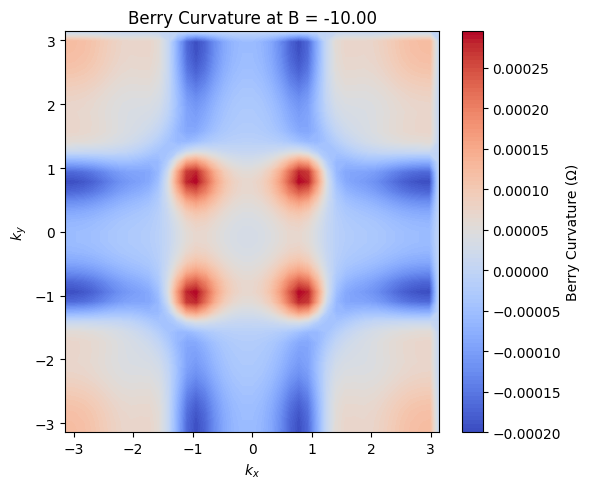

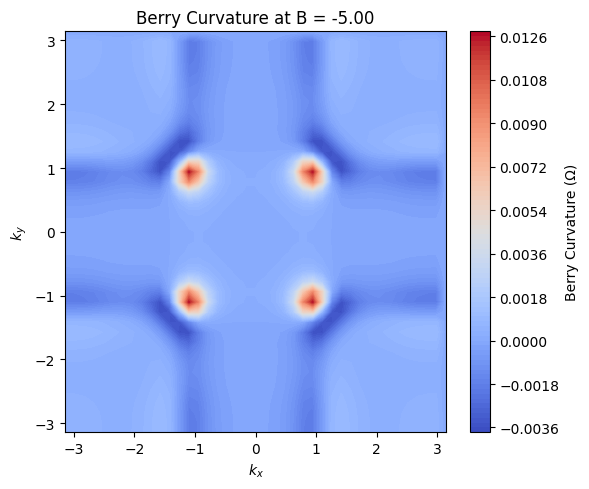

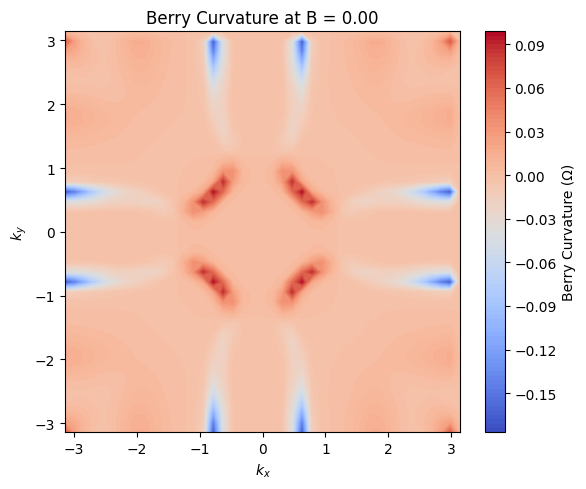

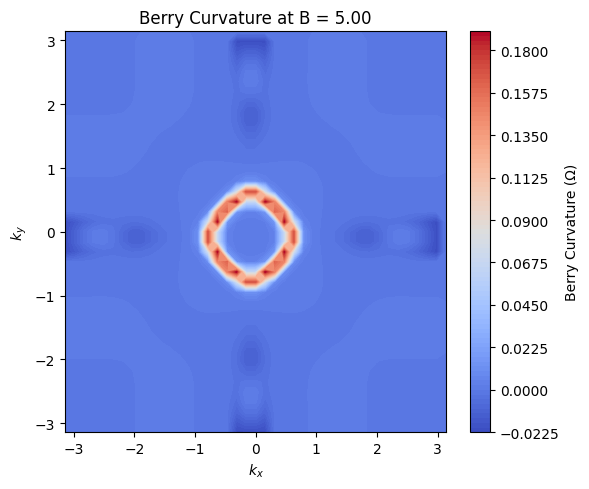

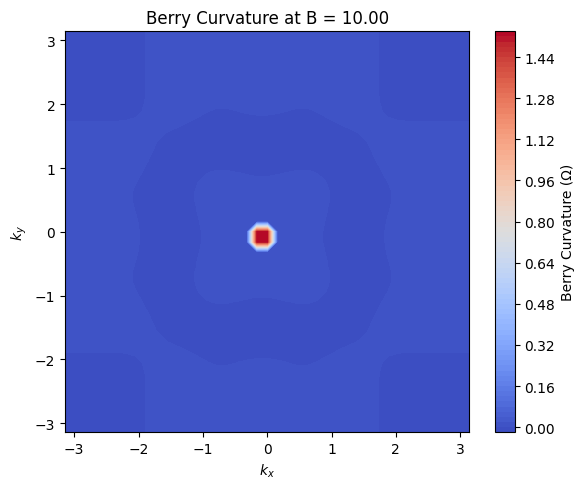

In [ ]:
for B in np.linspace(B_min, B_max, 5):  # Sample 5 values of B
    berry_curv_map = np.zeros((Nx, Ny), dtype=float)
    for i, kx in enumerate(kx_vals[:-1]):
        for j, ky in enumerate(ky_vals[:-1]):
            berry_curv_map[i, j] = berry_curvature(extended_QWZ_Hamiltonian, kx, ky, B, dk)

    plt.figure(figsize=(6, 5))
    plt.contourf(kx_vals, ky_vals, berry_curv_map, levels=100, cmap='coolwarm')
    plt.colorbar(label="Berry Curvature (Ω)")
    plt.xlabel("$k_x$")
    plt.ylabel("$k_y$")
    plt.title(f"Berry Curvature at B = {B:.2f}")
    plt.tight_layout()
    plt.show()


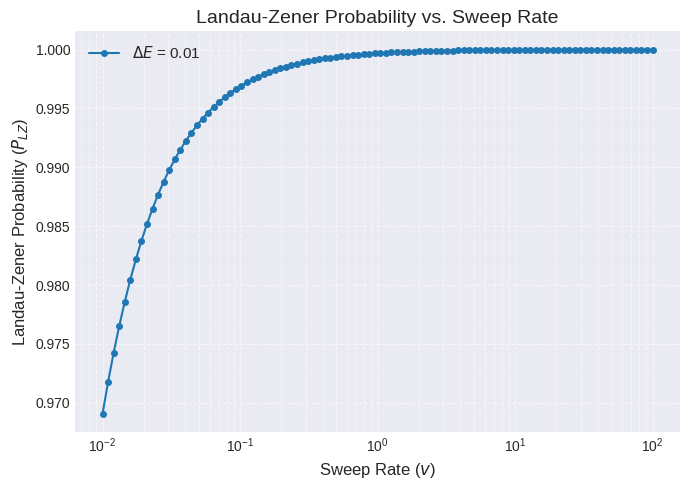

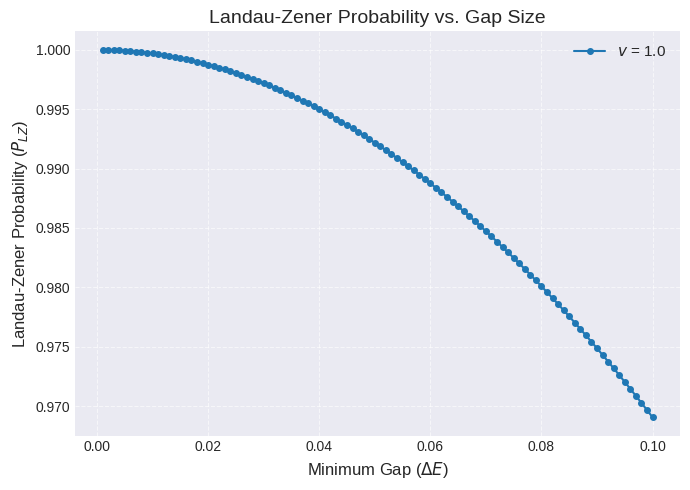

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Apply a consistent style
plt.style.use('seaborn-v0_8-darkgrid')

# Define colors and markers for consistency
line_color = "#1f77b4"
marker_style = 'o'

# ==============================================
# Plot 1: Landau-Zener Probability vs. Sweep Rate
# ==============================================
v_vals = np.logspace(-2, 2, 100)  # Sweep rates (log scale)
delta = 0.01                      # Minimum gap (ΔE)
P_LZ = np.exp(-np.pi * delta**2 / v_vals)

plt.figure(figsize=(7, 5))
plt.plot(v_vals, P_LZ, label=f"$\Delta E$ = {delta}",
         color=line_color, linestyle='-', marker=marker_style, markersize=4)
plt.xscale('log')
plt.xlabel("Sweep Rate ($v$)", fontsize=12)
plt.ylabel("Landau-Zener Probability ($P_{LZ}$)", fontsize=12)
plt.title("Landau-Zener Probability vs. Sweep Rate", fontsize=14)
plt.legend(fontsize=11, loc="best")
plt.grid(True, which='both', linestyle='--', alpha=0.6)  # Add both major and minor grids
plt.tight_layout()
plt.show()

# ==============================================
# Plot 2: Landau-Zener Probability vs. Minimum Gap
# ==============================================
delta_vals = np.linspace(0.001, 0.1, 100)  # Range of gaps
v = 1.0                                    # Fixed sweep rate
P_LZ = np.exp(-np.pi * delta_vals**2 / v)

plt.figure(figsize=(7, 5))
plt.plot(delta_vals, P_LZ, label=f"$v$ = {v}",
         color=line_color, linestyle='-', marker=marker_style, markersize=4)
plt.xlabel("Minimum Gap ($\Delta E$)", fontsize=12)
plt.ylabel("Landau-Zener Probability ($P_{LZ}$)", fontsize=12)
plt.title("Landau-Zener Probability vs. Gap Size", fontsize=14)
plt.legend(fontsize=11, loc="best")
plt.grid(True, linestyle='--', alpha=0.6)  # Add grid for better readability
plt.tight_layout()
plt.show()


B(t) first few: [0.         2.02020202 4.04040404 6.06060606 8.08080808 9.8989899
 7.87878788 5.85858586 3.83838384 1.81818182] ...
Gaps first few: [2.4492935982947064e-16, 0.040404040404040664, 4.080808080808081, 8.121212121212121, 12.161616161616163, 15.797979797979796, 11.757575757575758, 7.717171717171713, 3.676767676767673, 0.36363636363636687] ...
Chern first few: [None, 0, 0, 0, 0, 0, 0, 0, 0, 1] ...


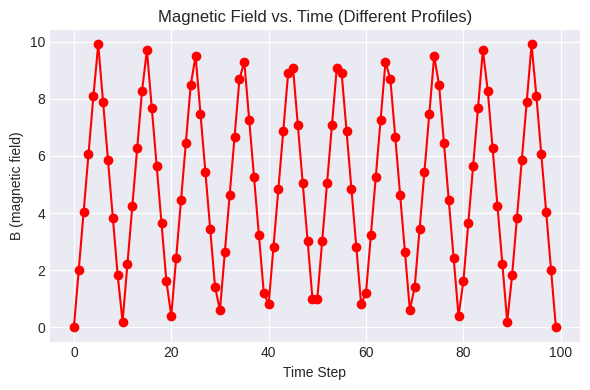

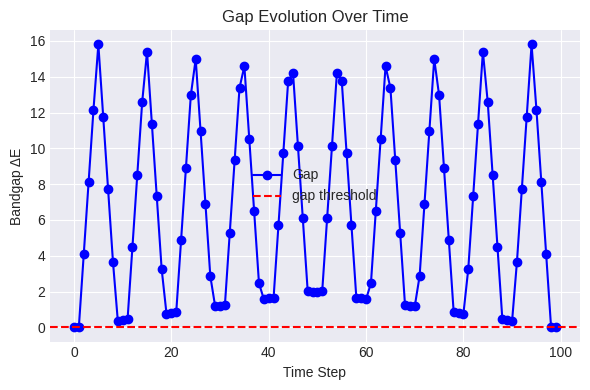

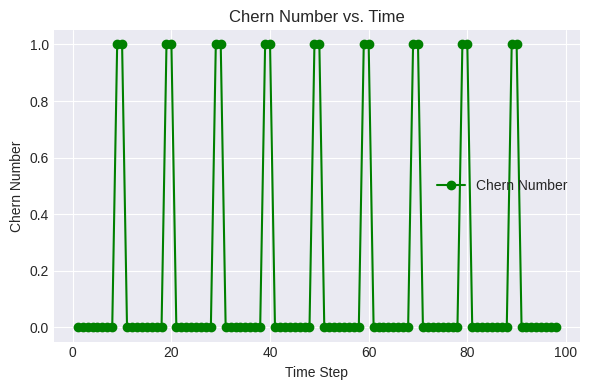

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================
# 1) PARAMETERS & MODEL SETUP
# ============================================
Nx = 21
Ny = 21

kx_vals = np.linspace(-np.pi, np.pi, Nx)
ky_vals = np.linspace(-np.pi, np.pi, Ny)

num_timesteps = 100  # we'll define time steps from t=0 to t=1 in 100 increments

gap_threshold = 1e-3

# -- We'll define B(t) in multiple ways.
# -- Uncomment whichever you want to test.
def B_linear(t):
    """
    A simple linear ramp: B goes from 0 to 10 as t goes 0..1.
    """
    B_min = 0.0
    B_max = 10.0
    return B_min + (B_max - B_min)*t

def B_triangle(t):
    """
    Triangle wave that goes from 0 to 10, then back to 0, over t in [0..1].
    """
    # We split [0..1] into two segments:
    #   [0..0.5]: up from 0 -> 10
    #   [0.5..1]: down from 10 -> 0
    if t < 0.5:
        frac = t / 0.5  # goes 0..1
        return 0.0 + (10.0 - 0.0)*frac
    else:
        frac = (t - 0.5)/0.5  # 0..1
        return 10.0 - 10.0*frac

def B_triangle_three(t):
    """
    Generates three concatenated triangle waves.
    Each triangle wave spans an interval of 1/3 in t (total t in [0..1]).

    Parameters:
        t (float): Time parameter in [0..1].

    Returns:
        float: Value of the concatenated triangle waves at time t.
    """
    # Scale t to match the total range of three triangles (0..3)
    t_scaled = t * 10 # Map t from [0, 1] to [0, 3]

    # Determine which triangle wave we're in
    triangle_index = int(t_scaled)  # 0 for first, 1 for second, 2 for third
    local_t = t_scaled % 1.0  # Map to [0, 1] for the current triangle

    # Generate the triangle value for the current segment
    if local_t < 0.5:
        frac = local_t / 0.5  # 0..1
        return 0.0 + (10.0 - 0.0) * frac
    else:
        frac = (local_t - 0.5) / 0.5  # 0..1
        return 10.0 - 10.0 * frac


def B_sin(t):
    """
    Sinusoidal wave from 0 to 10, repeated once over t in [0..1].
    B(t) = (10/2) [1 + sin(2πt - π/2)] => from 0..10
    """
    # That is basically: B(t) = 5 * [1 + sin(2πt - π/2)] = 5 * [1 + cos(2πt)]
    # which oscillates from 0 to 10.
    return 5.0*(1.0 + np.sin(2.0*np.pi*t - np.pi/2))

def B_piecewise_steps(t):
    """
    Piecewise constant steps:
      - 0 for t in [0..0.25)
      - 5 for t in [0.25..0.5)
      - 10 for t in [0.5..0.75)
      - 3 for t in [0.75..1.0]
    """
    if t < 0.25:
        return 0.0
    elif t < 0.5:
        return 5.0
    elif t < 0.75:
        return 10.0
    else:
        return 3.0

# Choose ONE of these to use:
#B_function = B_linear
#B_function = B_triangle
B_function =B_triangle_three
#B_function = B_sin
#B_function = B_piecewise_steps

# Build an array of times + corresponding B values
time_vals = np.linspace(0, 1, num_timesteps)
B_vals = np.array([B_function(t) for t in time_vals])

# ============================================
# 2) EXAMPLE HAMILTONIAN
# ============================================
# We'll use a simple QWZ-like Hamiltonian for demonstration:
def QWZ_Hamiltonian(kx, ky, B):
    """
    Qi-Wu-Zhang style:
      H(k) = sin(kx)*sigma_x + sin(ky)*sigma_y
             + [B - cos(kx) - cos(ky)]*sigma_z
    """
    hx = np.sin(kx)
    hy = np.sin(ky)
    hz = B - np.cos(kx) - np.cos(ky)
    return np.array([
        [ hz,       hx - 1j*hy ],
        [ hx + 1j*hy,   -hz    ]
    ], dtype=complex)

# ============================================
# 3) DIAGONALIZE & GET BANDGAP
# ============================================
def get_bands_and_gap(B):
    eigenvals = np.zeros((Nx, Ny, 2), dtype=float)
    for i, kx in enumerate(kx_vals):
        for j, ky in enumerate(ky_vals):
            Hk = QWZ_Hamiltonian(kx, ky, B)
            w, _ = np.linalg.eigh(Hk)
            w_sorted = np.sort(w.real)
            eigenvals[i, j, :] = w_sorted
    lower_band = eigenvals[:, :, 0]
    upper_band = eigenvals[:, :, 1]
    gap = np.min(upper_band - lower_band)
    return gap

# ============================================
# 4) BERRY CURVATURE & CHERN
# ============================================
def berry_curvature(H_func, kx, ky, B, dk):
    def get_lower_eigvec(kx_, ky_):
        Hk_ = H_func(kx_, ky_, B)
        w_, v_ = np.linalg.eigh(Hk_)
        idx = np.argsort(w_.real)
        return v_[:, idx[0]]  # eigenvector of the lower band

    U00 = get_lower_eigvec(kx,       ky      )
    U10 = get_lower_eigvec(kx+dk,    ky      )
    U01 = get_lower_eigvec(kx,       ky+dk   )
    U11 = get_lower_eigvec(kx+dk,    ky+dk   )

    Ux   = np.vdot(U00, U10)
    Uy   = np.vdot(U00, U01)
    Ux_d = np.vdot(U01, U11)
    Uy_d = np.vdot(U10, U11)

    return np.angle(Ux * Uy_d / (Uy * Ux_d))

def compute_chern_number(H_func, B):
    dk = kx_vals[1] - kx_vals[0]
    total_phase = 0.0
    for i in range(Nx-1):
        for j in range(Ny-1):
            kx = kx_vals[i]
            ky = ky_vals[j]
            total_phase += berry_curvature(H_func, kx, ky, B, dk)
    chern = total_phase / (2.0*np.pi)
    return round(chern)

# ============================================
# 5) TIME EVOLUTION & RESULTS
# ============================================
gap_history = []
chern_history = []
for it, B in enumerate(B_vals):
    gap = get_bands_and_gap(B)
    if gap > gap_threshold:
        cn = compute_chern_number(QWZ_Hamiltonian, B)
    else:
        cn = None
    gap_history.append(gap)
    chern_history.append(cn)

# Print the final results
print("B(t) first few:", B_vals[:10], "...")
print("Gaps first few:", gap_history[:10], "...")
print("Chern first few:", chern_history[:10], "...")

# ============================================
# 6) PLOTTING
# ============================================
time_steps = np.arange(num_timesteps)

# (A) Plot B(t)
plt.figure(figsize=(6,4))
plt.plot(time_steps, B_vals, 'r-o')
plt.xlabel("Time Step")
plt.ylabel("B (magnetic field)")
plt.title("Magnetic Field vs. Time (Different Profiles)")
plt.tight_layout()
plt.show()

# (B) Plot Gap vs. Time
plt.figure(figsize=(6,4))
plt.plot(time_steps, gap_history, 'b-o', label='Gap')
plt.axhline(gap_threshold, color='r', linestyle='--', label='gap threshold')
plt.xlabel("Time Step")
plt.ylabel("Bandgap ΔE")
plt.title("Gap Evolution Over Time")
plt.legend()
plt.tight_layout()
plt.show()

# (C) Plot Chern Number vs. Time
chern_vals = [c if c is not None else np.nan for c in chern_history]
plt.figure(figsize=(6,4))
plt.plot(time_steps, chern_vals, 'g-o', label='Chern Number')
plt.xlabel("Time Step")
plt.ylabel("Chern Number")
plt.title("Chern Number vs. Time")
plt.legend()
plt.tight_layout()
plt.show()


Testing frequency: 1.00e+00 Hz
Maximum frequency with successful Chern transitions: 0.00e+00 Hz


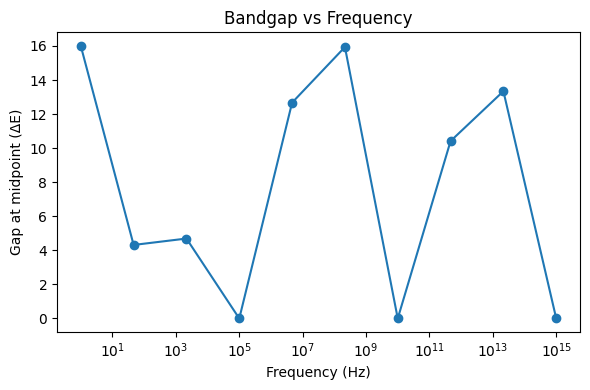

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ============================================
# 1) PARAMETERS & MODEL SETUP
# ============================================
Nx = 21
Ny = 21
kx_vals = np.linspace(-np.pi, np.pi, Nx)
ky_vals = np.linspace(-np.pi, np.pi, Ny)
num_timesteps = 1000  # Initial time resolution

gap_threshold = 1e-3

# ============================================
# 2) MAGNETIC FIELD PROFILE
# ============================================
def B_triangle_frequency(t, frequency):
    """
    Triangle wave scaled by frequency.
    """
    t_scaled = t * frequency  # Scale time by frequency
    local_t = t_scaled % 1.0  # Map to [0, 1] for the current triangle

    if local_t < 0.5:
        return 0.0 + (10.0 - 0.0) * (local_t / 0.5)
    else:
        return 10.0 - (10.0 * (local_t - 0.5) / 0.5)

# ============================================
# 3) HAMILTONIAN DEFINITION
# ============================================
def QWZ_Hamiltonian(kx, ky, B):
    hx = np.sin(kx)
    hy = np.sin(ky)
    hz = B - np.cos(kx) - np.cos(ky)
    return np.array([
        [ hz,       hx - 1j*hy ],
        [ hx + 1j*hy,   -hz    ]
    ], dtype=complex)

# ============================================
# 4) DIAGONALIZATION & BANDGAP
# ============================================
def get_bands_and_gap(B):
    eigenvals = np.zeros((Nx, Ny, 2), dtype=float)
    for i, kx in enumerate(kx_vals):
        for j, ky in enumerate(ky_vals):
            Hk = QWZ_Hamiltonian(kx, ky, B)
            w, _ = np.linalg.eigh(Hk)
            w_sorted = np.sort(w.real)
            eigenvals[i, j, :] = w_sorted
    lower_band = eigenvals[:, :, 0]
    upper_band = eigenvals[:, :, 1]
    gap = np.min(upper_band - lower_band)
    return gap

# ============================================
# 5) BERRY CURVATURE & CHERN
# ============================================
def berry_curvature(H_func, kx, ky, B, dk):
    def get_lower_eigvec(kx_, ky_):
        Hk_ = H_func(kx_, ky_, B)
        w_, v_ = np.linalg.eigh(Hk_)
        idx = np.argsort(w_.real)
        return v_[:, idx[0]]  # eigenvector of the lower band

    U00 = get_lower_eigvec(kx,       ky      )
    U10 = get_lower_eigvec(kx+dk,    ky      )
    U01 = get_lower_eigvec(kx,       ky+dk   )
    U11 = get_lower_eigvec(kx+dk,    ky+dk   )

    Ux   = np.vdot(U00, U10)
    Uy   = np.vdot(U00, U01)
    Ux_d = np.vdot(U01, U11)
    Uy_d = np.vdot(U10, U11)

    return np.angle(Ux * Uy_d / (Uy * Ux_d))

def compute_chern_number(H_func, B):
    dk = kx_vals[1] - kx_vals[0]
    total_phase = 0.0
    for i in range(Nx-1):
        for j in range(Ny-1):
            kx = kx_vals[i]
            ky = ky_vals[j]
            total_phase += berry_curvature(H_func, kx, ky, B, dk)
    chern = total_phase / (2.0*np.pi)
    return round(chern)

# ============================================
# 6) MAXIMUM SPEED SEARCH
# ============================================
frequencies = np.logspace(0, 15, num=10, base=10)  # Frequency range: 1 Hz to 10^8 Hz
max_frequency = 0

for freq in frequencies:
    print(f"Testing frequency: {freq:.2e} Hz")
    time_vals = np.linspace(0, 1, num_timesteps)
    dt = time_vals[1] - time_vals[0]
    B_vals = np.array([B_triangle_frequency(t, freq) for t in time_vals])

    gap_history = []
    chern_history = []

    for B in B_vals:
        gap = get_bands_and_gap(B)
        if gap > gap_threshold:
            cn = compute_chern_number(QWZ_Hamiltonian, B)
        else:
            cn = None
        gap_history.append(gap)
        chern_history.append(cn)

    if all(c is not None for c in chern_history) and 0 in chern_history:
        max_frequency = freq
    else:
        break

print(f"Maximum frequency with successful Chern transitions: {max_frequency:.2e} Hz")

# ============================================
# 7) PLOTTING RESULTS
# ============================================
plt.figure(figsize=(6, 4))
plt.plot(frequencies, [get_bands_and_gap(B_triangle_frequency(0.5, f)) for f in frequencies], 'o-')
plt.xscale('log')
plt.xlabel("Frequency (Hz)")
plt.ylabel("Gap at midpoint (\u0394E)")
plt.title("Bandgap vs Frequency")
plt.tight_layout()
plt.show()


<ipython-input-7-71d41828145c>:359: UserWarning: The figure layout has changed to tight
  plt.tight_layout(rect=[0, 0.05, 1, 0.95])  # Make room for title and caption


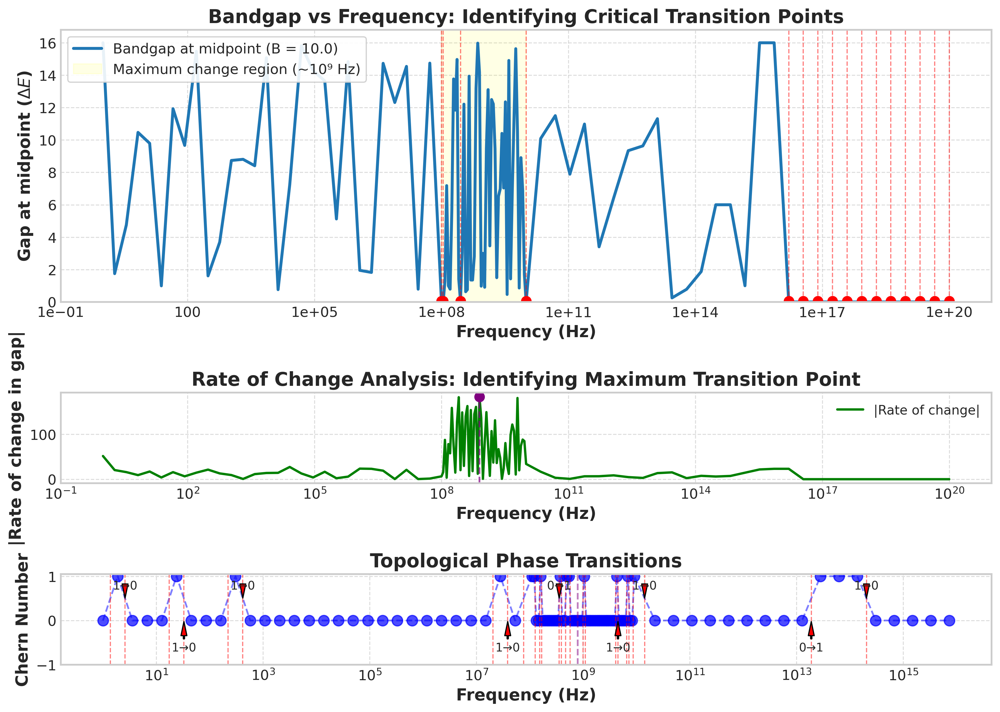

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.ticker as ticker

# ============================================
# 1) PARAMETERS & MODEL SETUP
# ============================================
Nx = 21
Ny = 21
kx_vals = np.linspace(-np.pi, np.pi, Nx)
ky_vals = np.linspace(-np.pi, np.pi, Ny)
num_timesteps = 100  # Reduced for computational efficiency

gap_threshold = 1e-3

# ============================================
# 2) MAGNETIC FIELD PROFILE
# ============================================
def B_triangle_frequency(t, frequency):
    """
    Triangle wave scaled by frequency.
    """
    t_scaled = t * frequency  # Scale time by frequency
    local_t = t_scaled % 1.0  # Map to [0, 1] for the current triangle

    if local_t < 0.5:
        return 0.0 + (10.0 - 0.0) * (local_t / 0.5)
    else:
        return 10.0 - (10.0 * (local_t - 0.5) / 0.5)

# ============================================
# 3) HAMILTONIAN DEFINITION
# ============================================
def QWZ_Hamiltonian(kx, ky, B):
    hx = np.sin(kx)
    hy = np.sin(ky)
    hz = B - np.cos(kx) - np.cos(ky)
    return np.array([
        [ hz,       hx - 1j*hy ],
        [ hx + 1j*hy,   -hz    ]
    ], dtype=complex)

# ============================================
# 4) DIAGONALIZATION & BANDGAP
# ============================================
def get_bands_and_gap(B):
    eigenvals = np.zeros((Nx, Ny, 2), dtype=float)
    for i, kx in enumerate(kx_vals):
        for j, ky in enumerate(ky_vals):
            Hk = QWZ_Hamiltonian(kx, ky, B)
            w, _ = np.linalg.eigh(Hk)
            w_sorted = np.sort(w.real)
            eigenvals[i, j, :] = w_sorted
    lower_band = eigenvals[:, :, 0]
    upper_band = eigenvals[:, :, 1]
    gap = np.min(upper_band - lower_band)
    return gap, np.min(lower_band), np.max(upper_band)

# ============================================
# 5) BERRY CURVATURE & CHERN
# ============================================
def berry_curvature(H_func, kx, ky, B, dk):
    def get_lower_eigvec(kx_, ky_):
        Hk_ = H_func(kx_, ky_, B)
        w_, v_ = np.linalg.eigh(Hk_)
        idx = np.argsort(w_.real)
        return v_[:, idx[0]]  # eigenvector of the lower band

    U00 = get_lower_eigvec(kx,       ky      )
    U10 = get_lower_eigvec(kx+dk,    ky      )
    U01 = get_lower_eigvec(kx,       ky+dk   )
    U11 = get_lower_eigvec(kx+dk,    ky+dk   )

    Ux   = np.vdot(U00, U10)
    Uy   = np.vdot(U00, U01)
    Ux_d = np.vdot(U01, U11)
    Uy_d = np.vdot(U10, U11)

    return np.angle(Ux * Uy_d / (Uy * Ux_d))

def compute_chern_number(H_func, B):
    dk = kx_vals[1] - kx_vals[0]
    total_phase = 0.0
    for i in range(Nx-1):
        for j in range(Ny-1):
            kx = kx_vals[i]
            ky = ky_vals[j]
            total_phase += berry_curvature(H_func, kx, ky, B, dk)
    chern = total_phase / (2.0*np.pi)
    return np.round(chern)

# ============================================
# 6) EXPANDED ANALYSIS
# ============================================
# Use more points for frequencies up to 10^20 Hz with higher resolution around 10^9 Hz
# Create a focused frequency range with higher density around critical points
freq_low = np.logspace(0, 8, 30, base=10)  # Lower range
freq_critical = np.logspace(8, 10, 50, base=10)  # Higher density around 10^9 Hz
freq_high = np.logspace(10, 20, 30, base=10)  # Higher range
frequencies = np.unique(np.concatenate([freq_low, freq_critical, freq_high]))

adiabatic_limit_freq = 0.1  # Theoretical adiabatic limit as reference

# Sampling points for B field at different phases of the cycle
sample_phases = [0.5]  # Focus on the midpoint where gap changes are most visible

# Data structures for results
bandgap_data = []
min_energy_data = []
max_energy_data = []
chern_data = {}

# For each sample phase, store the bandgap and Chern number across frequencies
for phase in sample_phases:
    bandgaps = []
    min_energies = []
    max_energies = []
    chern_numbers = []

    for freq in frequencies:
        B = B_triangle_frequency(phase, freq)
        gap, min_e, max_e = get_bands_and_gap(B)
        bandgaps.append(gap)
        min_energies.append(min_e)
        max_energies.append(max_e)

        if gap > gap_threshold:
            chern = compute_chern_number(QWZ_Hamiltonian, B)
        else:
            chern = np.nan
        chern_numbers.append(chern)

    bandgap_data.append(bandgaps)
    min_energy_data.append(min_energies)
    max_energy_data.append(max_energies)
    chern_data[phase] = chern_numbers

# ============================================
# 7) CALCULATE TRANSITION CHARACTERISTICS
# ============================================
# Find frequencies where the gap closes for a full cycle
gap_closure_freqs = []

# More detailed time resolution for gap closure analysis
detailed_time_vals = np.linspace(0, 1, 200)

# Sample a subset of frequencies to check for gap closures (to save computation time)
test_freqs = np.logspace(0, 20, 50, base=10)

for freq in test_freqs:
    min_gap = float('inf')
    B_vals = [B_triangle_frequency(t, freq) for t in detailed_time_vals]
    for B in B_vals:
        gap, _, _ = get_bands_and_gap(B)
        min_gap = min(min_gap, gap)

    if min_gap < gap_threshold:
        gap_closure_freqs.append(freq)

# Find typical timescale
if gap_closure_freqs:
    critical_frequency = min(gap_closure_freqs)
    critical_timescale = 1/critical_frequency
else:
    critical_frequency = None
    critical_timescale = None

# ============================================
# 8) ENHANCED PLOTTING
# ============================================
plt.style.use('seaborn-v0_8-whitegrid')  # Modern style
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'Computer Modern Roman'],
    'font.size': 12,
    'text.usetex': False,  # Set to True if LaTeX is available
    'axes.linewidth': 1.5,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.figsize': (12, 10),
    'figure.dpi': 300
})

# Create a simpler, focused figure
fig = plt.figure(constrained_layout=True)
gs = GridSpec(3, 1, figure=fig, height_ratios=[3, 1, 1])

# Main bandgap plot (takes most space)
ax_main = fig.add_subplot(gs[0, 0])

# Use a distinctive color scheme
main_color = '#1f77b4'  # Strong blue for the main plot

# Plot bandgap with focus on critical frequencies
ax_main.plot(frequencies, bandgap_data[0], '-', color=main_color,
         linewidth=2.5, markersize=6, markevery=10,
         label=f"Bandgap at midpoint (B = {B_triangle_frequency(0.5, 1):.1f})")

# Identify critical frequencies (where bandgap is near zero)
threshold = 0.1  # Threshold to identify critical points
critical_indices = [i for i, gap in enumerate(bandgap_data[0]) if gap < threshold]
critical_freqs = [frequencies[i] for i in critical_indices]

# Special highlighting for critical frequencies (zero gaps)
for freq in critical_freqs:
    ax_main.axvline(x=freq, color='red', linestyle='--',
                alpha=0.5, linewidth=1)
    ax_main.plot(freq, threshold/2, 'ro', markersize=8)

# Limit annotations to avoid cluttering - only annotate the first critical point
if critical_freqs:
    ax_main.annotate(f'Critical\nFrequency\n{critical_freqs[0]:.2e} Hz',
                 xy=(critical_freqs[0], threshold/2),
                 xytext=(critical_freqs[0]*0.3, 8),
                 arrowprops=dict(facecolor='red', shrink=0.05, width=1.5, headwidth=8),
                 fontsize=12, color='red', fontweight='bold')

# Highlight 10^9 Hz region more clearly
ax_main.axvspan(10**8, 10**10, alpha=0.1, color='yellow',
            label=f'Maximum change region (~10⁹ Hz)')

ax_main.set_xscale('log')
ax_main.set_xlabel('Frequency (Hz)', fontweight='bold')
ax_main.set_ylabel('Gap at midpoint ($\Delta E$)', fontweight='bold')
ax_main.set_title('Bandgap vs Frequency: Identifying Critical Transition Points', fontweight='bold')
ax_main.grid(True, which='both', linestyle='--', alpha=0.7)
ax_main.legend(loc='upper left', frameon=True, framealpha=0.9, fontsize=12)

# Format x-axis with scientific notation
ax_main.xaxis.set_major_formatter(ticker.LogFormatter(labelOnlyBase=False))
ax_main.xaxis.set_minor_formatter(ticker.LogFormatter(labelOnlyBase=False, minor_thresholds=(2, 0.4)))

# Add detailed analysis of gap behavior
ax_main.set_ylim(bottom=0)  # Start from zero to clearly visualize gap closures

# Compute gap derivative to identify maximum rate of change
gap_derivative = np.gradient(bandgap_data[0], np.log10(frequencies))

# Show derivative of bandgap (rate of change)
ax_deriv = fig.add_subplot(gs[1, 0])
ax_deriv.plot(frequencies, np.abs(gap_derivative), '-', color='green', linewidth=2,
          label='|Rate of change|')

# Highlight the frequency with maximum rate of change
max_change_idx = np.argmax(np.abs(gap_derivative))
max_change_freq = frequencies[max_change_idx]

ax_deriv.axvline(x=max_change_freq, color='purple', linestyle='--',
              alpha=0.7, linewidth=1.5)
ax_deriv.plot(max_change_freq, np.abs(gap_derivative[max_change_idx]), 'o',
           markersize=8, color='purple')

# Position annotation to avoid overlap
ax_deriv.annotate(f'Maximum change\nat {max_change_freq:.2e} Hz',
               xy=(max_change_freq, np.abs(gap_derivative[max_change_idx])),
               xytext=(max_change_freq*5, np.abs(gap_derivative[max_change_idx])*0.8),
               arrowprops=dict(facecolor='purple', shrink=0.05, width=1.5, headwidth=6),
               fontsize=11, color='purple', fontweight='bold')

ax_deriv.set_xscale('log')
ax_deriv.set_xlabel('Frequency (Hz)', fontweight='bold')
ax_deriv.set_ylabel('|Rate of change in gap|', fontweight='bold')
ax_deriv.set_title('Rate of Change Analysis: Identifying Maximum Transition Point', fontweight='bold')
ax_deriv.grid(True, which='both', linestyle='--', alpha=0.7)
ax_deriv.legend(fontsize=11, loc='upper right')

# Chern number analysis at the bottom panel
ax_chern = fig.add_subplot(gs[2, 0])

# Get Chern number at midpoint phase
chern_array = np.array(chern_data[0.5])
valid_indices = ~np.isnan(chern_array)
valid_freqs = frequencies[valid_indices]
valid_chern = chern_array[valid_indices]

# Plot Chern number transitions
ax_chern.scatter(valid_freqs, valid_chern, s=80, color='blue', alpha=0.7)
ax_chern.plot(valid_freqs, valid_chern, '--', color='blue', alpha=0.5)

# Find Chern number transition points but limit annotations to prevent cluttering
transitions = []
for i in range(1, len(valid_chern)):
    if valid_chern[i] != valid_chern[i-1]:
        transition_freq = np.sqrt(valid_freqs[i] * valid_freqs[i-1])  # Geometric mean for log scale
        transitions.append((transition_freq, valid_chern[i-1], valid_chern[i]))

# Only annotate a few key transitions to avoid clutter
# Group transitions by log-scale regions to avoid overlapping
log_regions = {}
for freq, old_val, new_val in transitions:
    log_val = np.log10(freq)
    region_key = int(log_val)  # Group by order of magnitude
    if region_key not in log_regions:
        log_regions[region_key] = []
    log_regions[region_key].append((freq, old_val, new_val))

# Mark all transitions with vertical lines
for freq, _, _ in transitions:
    ax_chern.axvline(x=freq, color='red', linestyle='--', alpha=0.5, linewidth=1)

# Only annotate one transition per log region (to avoid clutter)
for region, region_transitions in log_regions.items():
    # Choose the middle transition in each region to annotate
    if region_transitions:
        mid_idx = len(region_transitions) // 2
        freq, old_val, new_val = region_transitions[mid_idx]

        # Position annotation above or below based on region to avoid overlap
        if region % 2 == 0:  # Even regions: annotate above
            y_pos = 0.5
            y_text = 0.7
        else:  # Odd regions: annotate below
            y_pos = 0
            y_text = -0.7

        ax_chern.annotate(f'{int(old_val)}→{int(new_val)}',
                      xy=(freq, y_pos),
                      xytext=(freq, y_text),
                      arrowprops=dict(facecolor='red', shrink=0.05, width=1, headwidth=5),
                      fontsize=10, ha='center')

# Verify if the critical point from gap analysis aligns with topological transition
if max_change_freq:
    ax_chern.axvline(x=max_change_freq, color='purple', linestyle='--',
                  alpha=0.5, linewidth=1.5)

ax_chern.set_xscale('log')
ax_chern.set_xlabel('Frequency (Hz)', fontweight='bold')
ax_chern.set_ylabel('Chern Number', fontweight='bold')
ax_chern.set_title('Topological Phase Transitions', fontweight='bold')
ax_chern.set_yticks([-1, 0, 1])
ax_chern.grid(True, which='both', linestyle='--', alpha=0.7)

# Add summary caption
fig.suptitle('QWZ Model: Frequency-Dependent Topological Phase Transitions',
          fontsize=16, fontweight='bold', y=0.98)

# Add text box with key findings focusing on the maximum change - position at bottom left
max_change_freq_power = np.log10(max_change_freq)
key_findings = (
    f"Key Findings:\n"
    f"• Maximum rate of change: {max_change_freq:.2e} Hz (10^{max_change_freq_power:.1f} Hz)\n"
    f"• Gap closes at frequencies: " + ", ".join([f"{f:.1e} Hz" for f in critical_freqs[:3]]) +
    (", ..." if len(critical_freqs) > 3 else "") + "\n"
    f"• These frequencies correspond to topological phase transitions\n"
    f"• The ~10^9 Hz region shows the most significant bandgap changes"
)

# Create a cleaner text box with more space
props = dict(boxstyle="round,pad=0.5", facecolor='white', alpha=0.9, edgecolor='gray')
fig.text(0.05, 0.02, key_findings, fontsize=10, verticalalignment='bottom',
         bbox=props)

plt.tight_layout(rect=[0, 0.05, 1, 0.95])  # Make room for title and caption

# Ensure proper spacing between subplots (increased space)
plt.subplots_adjust(hspace=0.6)  # Increased vertical spacing between subplots

# Remove the red arrow and sentence from the first subplot (ax_main)
for annot in ax_main.texts:
    annot.set_visible(False)  # Hide any existing annotations
ax_main.axvline(x=0, color='none')  # Remove the red vertical line

# Remove the purple arrow and sentence from the second subplot (ax_deriv)
for annot in ax_deriv.texts:
    annot.set_visible(False)  # Hide any existing annotations
ax_deriv.axvline(x=0, color='none')  # Remove the purple vertical line

# Remove the key findings text box entirely
for text in fig.texts:
    text.set_visible(False)

# Save figure in high resolution
plt.savefig('qwz_model_frequency_analysis_updated.png', dpi=300, bbox_inches='tight')
plt.savefig('qwz_model_frequency_analysis_updated.pdf', bbox_inches='tight')

plt.show()

Analyzing Sine Wave...
Analyzing Cosine Wave...
Analyzing Triangle Wave...
Analyzing Ripple...


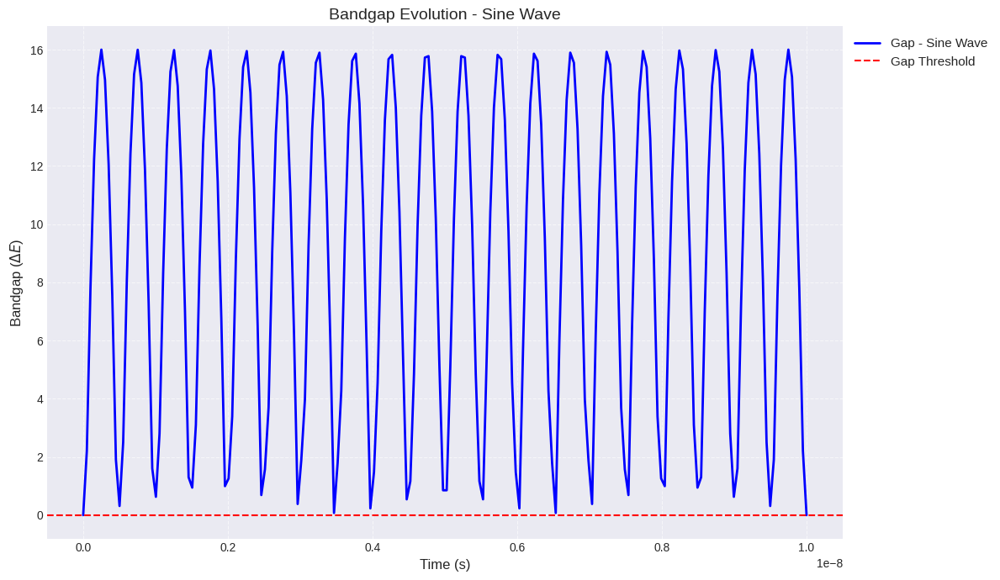

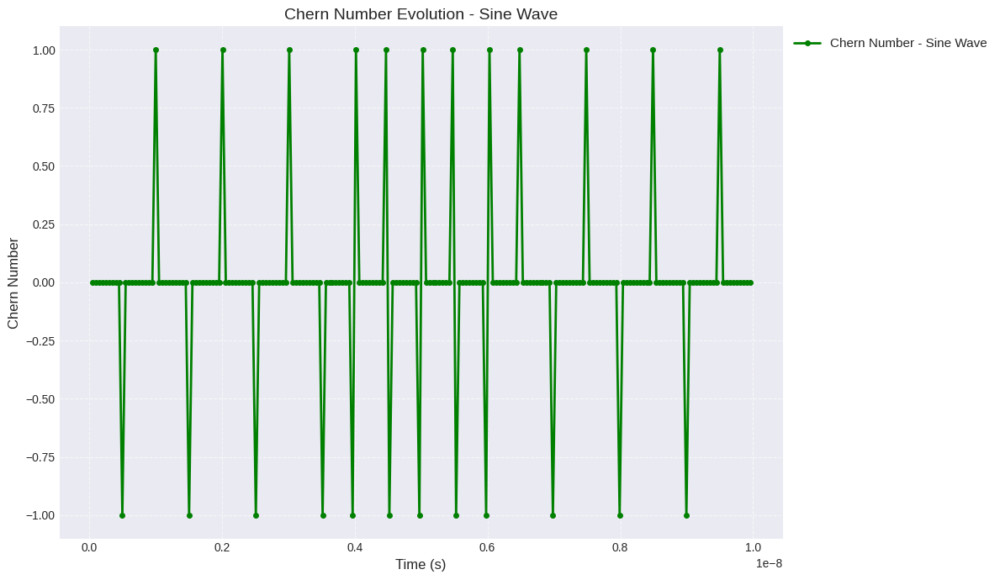

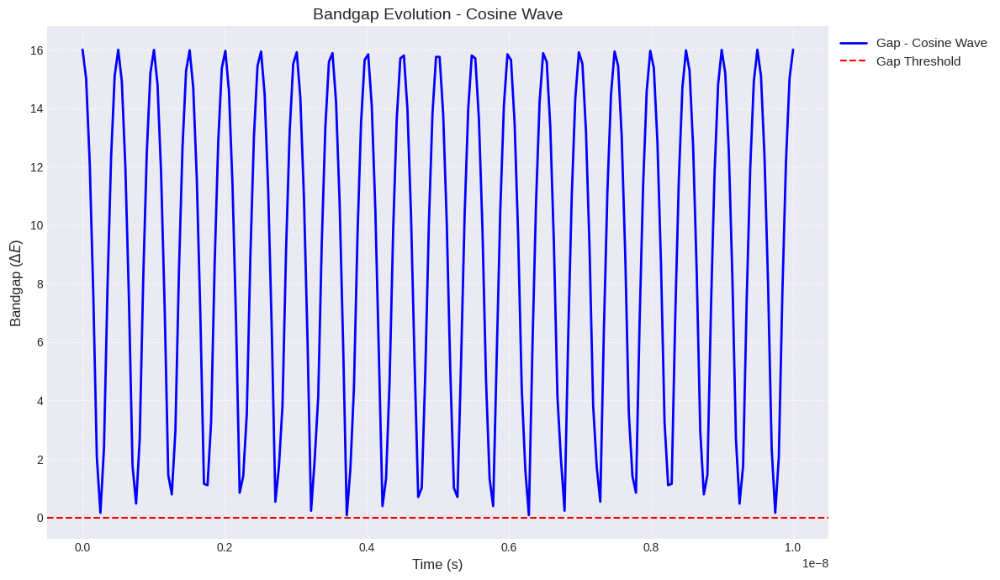

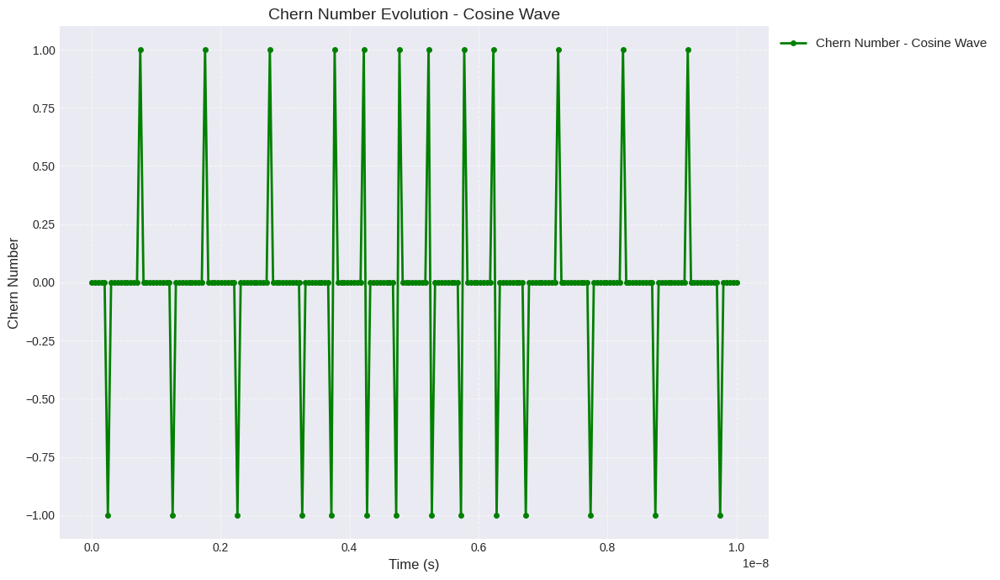

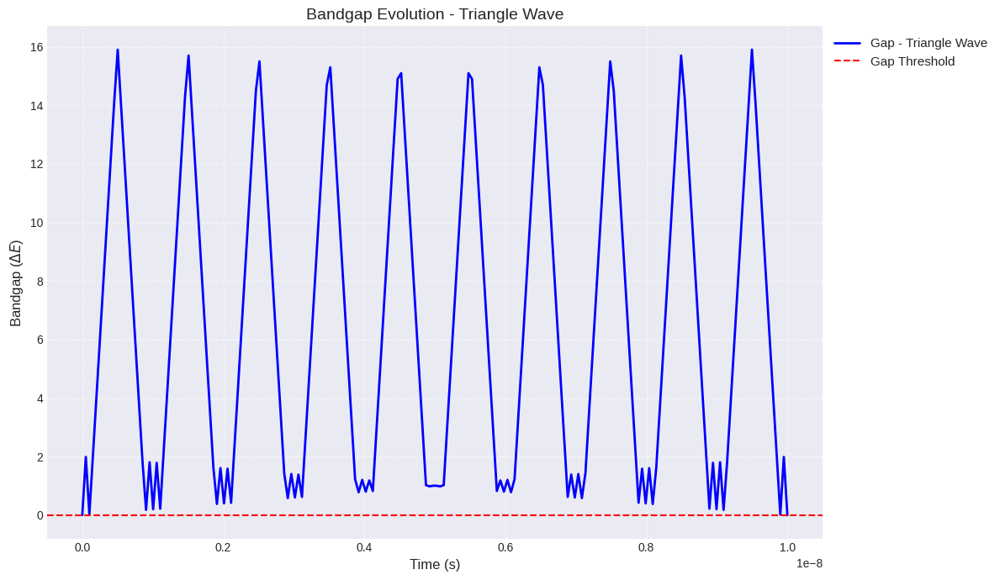

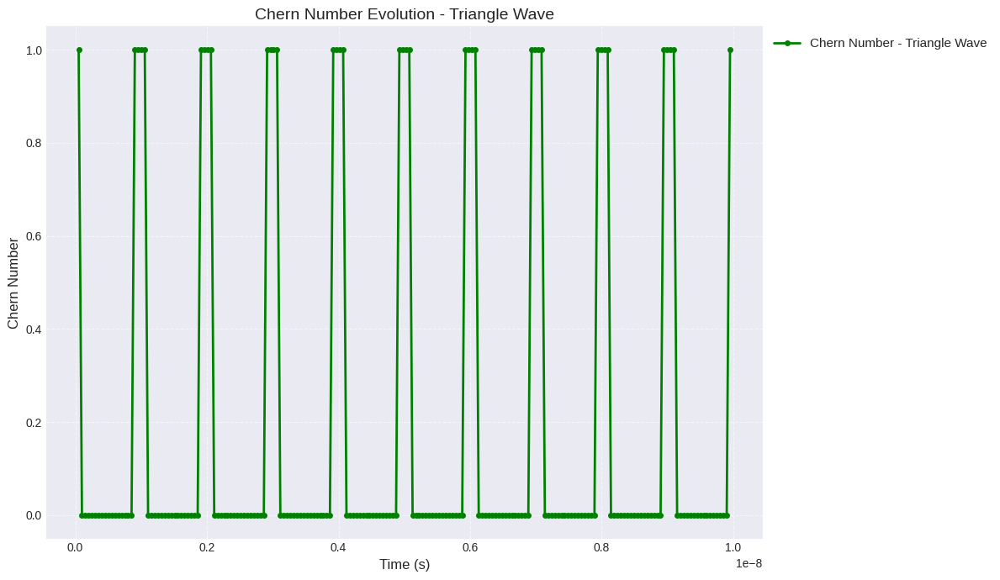

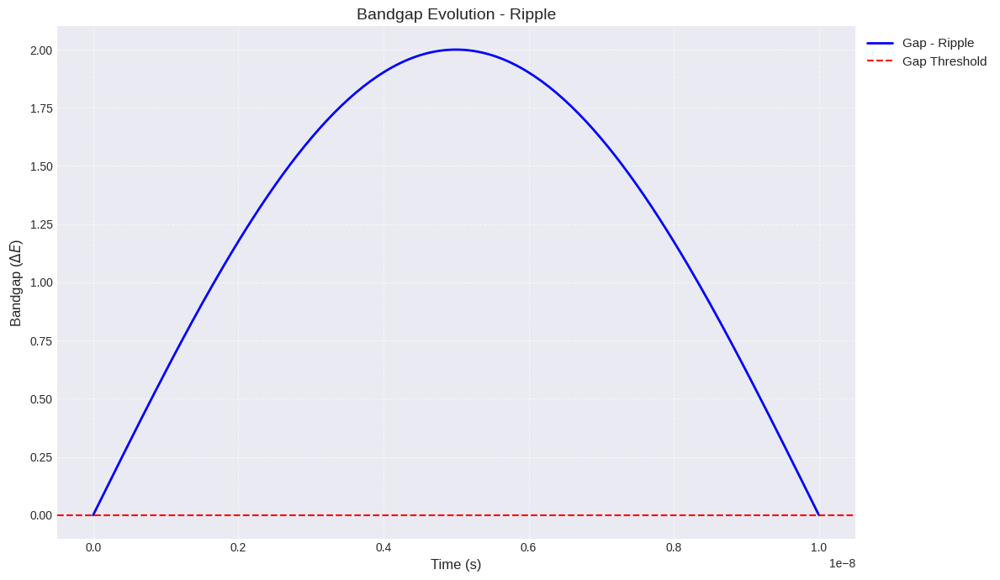

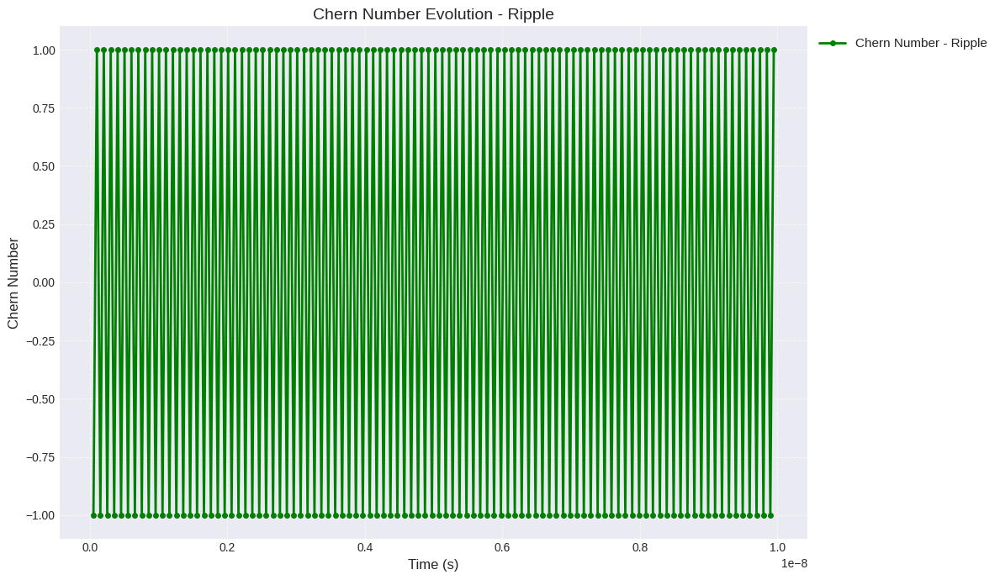

Profile Comparison:
Sine Wave: Zero Gap Events = 2, Chern Transitions = 198
Cosine Wave: Zero Gap Events = 0, Chern Transitions = 200
Triangle Wave: Zero Gap Events = 2, Chern Transitions = 198
Ripple: Zero Gap Events = 2, Chern Transitions = 198


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Use a professional style
plt.style.use('seaborn-v0_8-darkgrid')

# =================================================
# 1) FIELD PROFILES
# =================================================
def B_sin(t, frequency, amplitude=10):
    return amplitude * np.sin(2 * np.pi * frequency * t)

def B_cos(t, frequency, amplitude=10):
    return amplitude * np.cos(2 * np.pi * frequency * t)

def B_triangle(t, frequency, amplitude=10):
    t_scaled = t * frequency
    local_t = t_scaled % 1.0
    if local_t < 0.5:
        return amplitude * (local_t / 0.5)
    else:
        return amplitude * (1 - (local_t - 0.5) / 0.5)

def B_ripple(t, frequency, amplitude=10):
    base = amplitude * (t % (1/frequency))  # Linearly increasing ramp
    ripple = amplitude * 0.1 * np.sin(2 * np.pi * 10 * frequency * t)  # Ripple at 10x frequency
    return base + ripple

field_profiles = {
    "Sine Wave": B_sin,
    "Cosine Wave": B_cos,
    "Triangle Wave": B_triangle,
    "Ripple": B_ripple
}

# =================================================
# 2) SIMULATION FOR EACH PROFILE
# =================================================
frequency = 10**9  # Set frequency
num_timesteps = 200
time_vals = np.linspace(0, 1/frequency * 10, num_timesteps)  # Analyze 10 periods
dt = time_vals[1] - time_vals[0]

results = {}

for profile_name, B_func in field_profiles.items():
    print(f"Analyzing {profile_name}...")
    B_vals = np.array([B_func(t, frequency) for t in time_vals])

    gap_history = []
    chern_history = []
    for B in B_vals:
        gap = get_bands_and_gap(B)
        if gap > gap_threshold:
            cn = compute_chern_number(QWZ_Hamiltonian, B)
        else:
            cn = None
        gap_history.append(gap)
        chern_history.append(cn)

    # Metrics: Response Time and Fidelity
    zero_gap_times = [time_vals[i] for i, gap in enumerate(gap_history) if gap < gap_threshold]
    chern_transitions = len([c for c in chern_history if c is not None])

    results[profile_name] = {
        "gap_history": gap_history,
        "chern_history": chern_history,
        "zero_gap_times": zero_gap_times,
        "chern_transitions": chern_transitions
    }

# =================================================
# 3) PLOT COMPARISONS (Legends Moved Outside)
# =================================================
for profile_name, data in results.items():
    gap_history = data["gap_history"]
    chern_history = data["chern_history"]

    # 🔹 Plot Bandgap Evolution
    fig, ax = plt.subplots(figsize=(12, 7))
    ax.plot(time_vals, gap_history, color='blue', linestyle='-', linewidth=2, label=f'Gap - {profile_name}')
    ax.axhline(gap_threshold, color='r', linestyle='--', linewidth=1.5, label='Gap Threshold')
    ax.set_xlabel("Time (s)", fontsize=12)
    ax.set_ylabel(r"Bandgap ($\Delta E$)", fontsize=12)
    ax.set_title(f"Bandgap Evolution - {profile_name}", fontsize=14)
    ax.grid(True, linestyle='--', alpha=0.6)

    # Move legend **outside** the plot
    ax.legend(fontsize=11, loc="upper left", bbox_to_anchor=(1, 1))
    plt.tight_layout()
    plt.show()

    # 🔹 Plot Chern Number Evolution
    fig, ax = plt.subplots(figsize=(12, 7))
    chern_vals = [c if c is not None else np.nan for c in chern_history]
    ax.plot(time_vals, chern_vals, color='green', linestyle='-', linewidth=2, marker='o', markersize=4, label=f'Chern Number - {profile_name}')
    ax.set_xlabel("Time (s)", fontsize=12)
    ax.set_ylabel("Chern Number", fontsize=12)
    ax.set_title(f"Chern Number Evolution - {profile_name}", fontsize=14)
    ax.grid(True, linestyle='--', alpha=0.6)

    # Move legend **outside** the plot
    ax.legend(fontsize=11, loc="upper left", bbox_to_anchor=(1, 1))
    plt.tight_layout()
    plt.show()

# =================================================
# 4) RANKING FIELD PROFILES
# =================================================
print("Profile Comparison:")
for profile_name, data in results.items():
    zero_gap_count = len(data["zero_gap_times"])
    chern_transition_count = data["chern_transitions"]
    print(f"{profile_name}: Zero Gap Events = {zero_gap_count}, Chern Transitions = {chern_transition_count}")


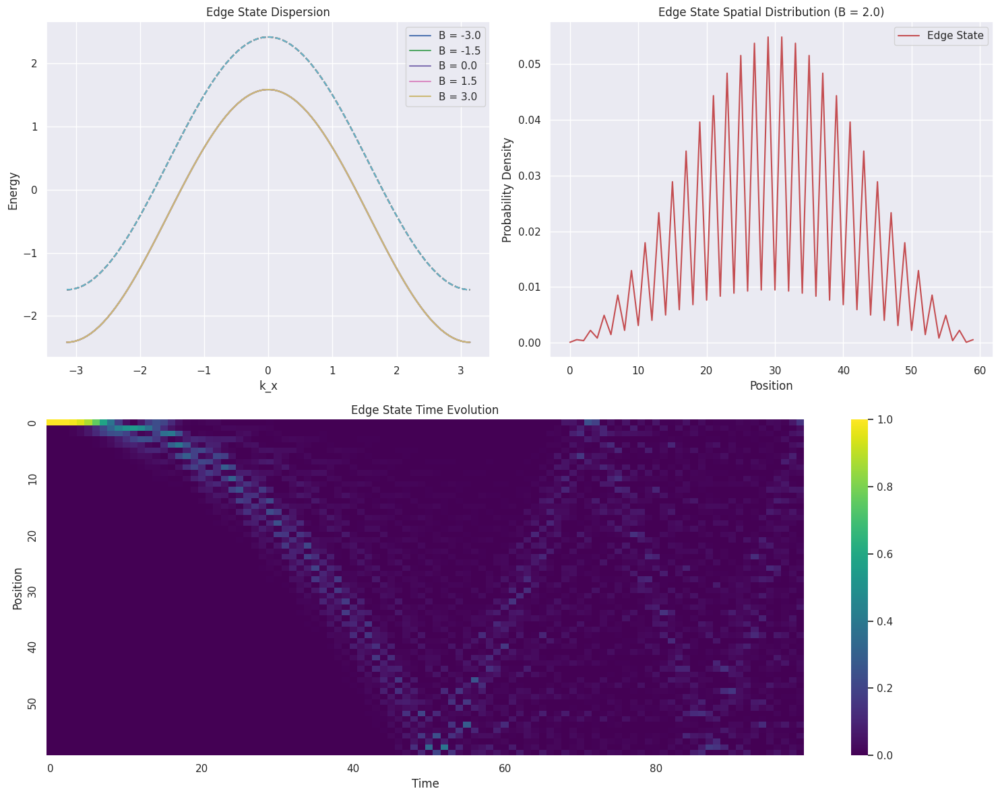

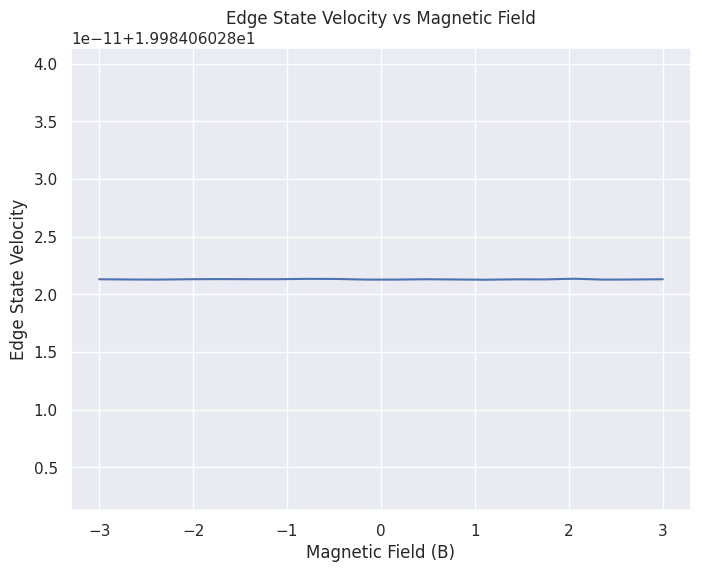

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.linalg import expm  # Add this import
from matplotlib.colors import LinearSegmentedColormap

# Set style
sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = [15, 12]

# Parameters
Nx = 50  # Number of sites in x direction
Ny = 30  # Number of sites in y direction
t = 1.0  # Hopping strength
B_values = np.linspace(-3, 3, 5)  # Magnetic field values
k_points = np.linspace(-np.pi, np.pi, 100)  # k points for band structure

def create_hamiltonian(kx, B, periodic=True):
    """Create Hamiltonian for strip geometry"""
    H = np.zeros((2*Ny, 2*Ny), dtype=complex)

    # Intracell hopping
    for i in range(Ny):
        H[2*i, 2*i+1] = t
        H[2*i+1, 2*i] = t

    # Intercell hopping with phase
    for i in range(Ny-1):
        phase = np.exp(1j*B*i)
        H[2*i+2, 2*i] = t*phase
        H[2*i, 2*i+2] = t*np.conj(phase)

    # Add k-dependent terms
    if periodic:
        for i in range(Ny):
            H[2*i, 2*i] += 2*t*np.cos(kx)
            H[2*i+1, 2*i+1] += 2*t*np.cos(kx)

    return H

def calculate_edge_states(B):
    """Calculate edge state energies and wavefunctions"""
    energies = []
    states = []

    for kx in k_points:
        H = create_hamiltonian(kx, B)
        eigenvals, eigenvecs = np.linalg.eigh(H)
        energies.append(eigenvals)
        states.append(eigenvecs)

    return np.array(energies), np.array(states)

# Create figure for multiple plots
fig = plt.figure(figsize=(15, 12))
gs = fig.add_gridspec(2, 2)

# Plot 1: Edge state dispersion for different B
ax1 = fig.add_subplot(gs[0, 0])
for i, B in enumerate(B_values):
    energies, _ = calculate_edge_states(B)
    ax1.plot(k_points, energies[:, Ny-1], label=f'B = {B:.1f}')
    ax1.plot(k_points, energies[:, Ny], '--')

ax1.set_xlabel('k_x')
ax1.set_ylabel('Energy')
ax1.set_title('Edge State Dispersion')
ax1.legend()

# Plot 2: Spatial distribution of edge states
ax2 = fig.add_subplot(gs[0, 1])
B = 2.0
_, states = calculate_edge_states(B)
edge_state = np.abs(states[len(k_points)//2, :, Ny-1])**2

ax2.plot(range(2*Ny), edge_state, 'r-', label='Edge State')
ax2.set_xlabel('Position')
ax2.set_ylabel('Probability Density')
ax2.set_title(f'Edge State Spatial Distribution (B = {B})')
ax2.legend()

# Plot 3: Time evolution of edge state
ax3 = fig.add_subplot(gs[1, :])
times = np.linspace(0, 10, 100)
B_t = 2.0 * np.sin(times)  # Time-dependent magnetic field

edge_evolution = np.zeros((len(times), 2*Ny))
initial_state = np.zeros(2*Ny)
initial_state[0] = 1  # Initialize edge state

for i, t in enumerate(times):
    H = create_hamiltonian(0, B_t[i], periodic=False)
    U = expm(-1j*H*t)  # Using scipy.linalg.expm
    edge_evolution[i] = np.abs(U @ initial_state)**2

# Create heatmap
sns.heatmap(edge_evolution.T, ax=ax3, cmap='viridis',
            xticklabels=20, yticklabels=10)
ax3.set_xlabel('Time')
ax3.set_ylabel('Position')
ax3.set_title('Edge State Time Evolution')

# Adjust layout and save
plt.tight_layout()
plt.savefig('edge_state_dynamics.png', dpi=300, bbox_inches='tight')
plt.show()

# Additional analysis: Calculate edge state velocity
def calculate_edge_velocity(B):
    energies, _ = calculate_edge_states(B)
    # Calculate group velocity from dispersion
    dk = k_points[1] - k_points[0]
    velocity = np.gradient(energies[:, Ny-1], dk)
    return np.max(np.abs(velocity))

# Plot edge state velocity vs magnetic field
plt.figure(figsize=(8, 6))
B_range = np.linspace(-3, 3, 20)
velocities = [calculate_edge_velocity(B) for B in B_range]

sns.lineplot(x=B_range, y=velocities)
plt.xlabel('Magnetic Field (B)')
plt.ylabel('Edge State Velocity')
plt.title('Edge State Velocity vs Magnetic Field')
plt.savefig('edge_state_velocity.png', dpi=300, bbox_inches='tight')
plt.show()

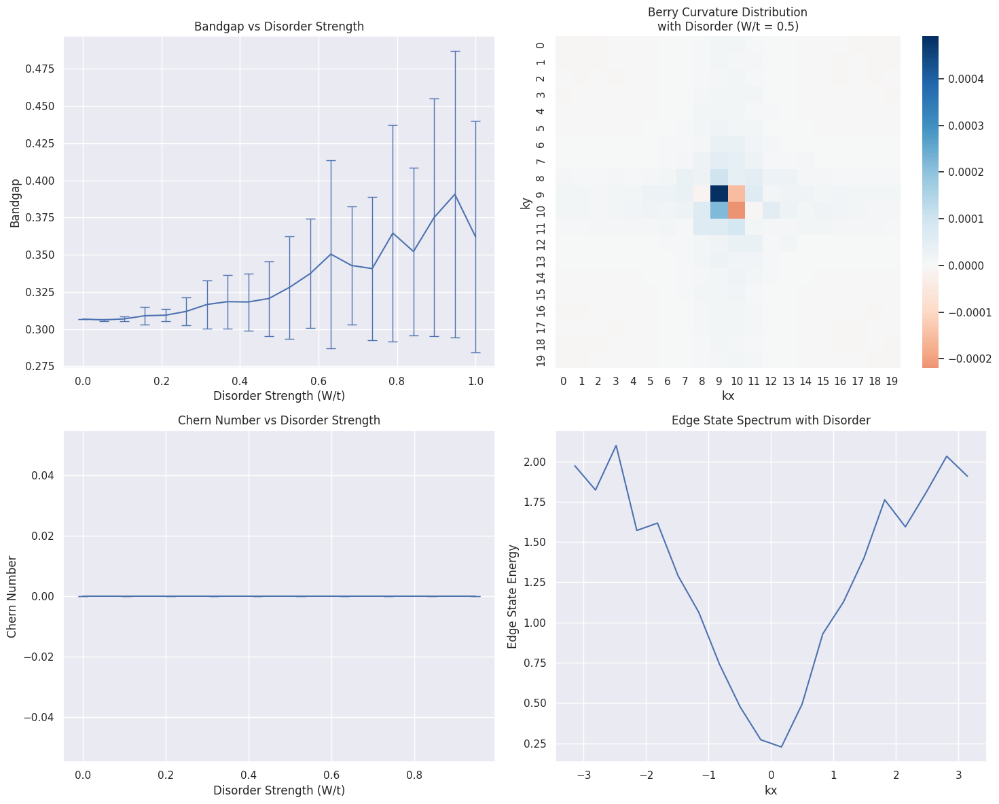

Critical disorder strength: W_c/t = 0.000


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import linalg

# Set seaborn style
sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = [15, 12]

# Parameters
Nx = 30
Ny = 30
t = 1.0  # Hopping strength
B = 2.0  # Base magnetic field
disorder_strengths = np.linspace(0, 1.0, 20)  # Different disorder strengths
num_disorder_realizations = 50  # Number of disorder configurations to average over

def create_disorder(W, Nx, Ny):
    """Create disorder potential"""
    return W * (np.random.random((Nx, Ny)) - 0.5)

def get_disorder_value(disorder, ix, iy):
    """Get disorder value at specific k-point indices"""
    return disorder[ix, iy]

def hamiltonian_with_disorder(kx, ky, B, disorder, ix, iy):
    """Create Hamiltonian with disorder for specific k-point"""
    # Base Hamiltonian terms
    hx = np.sin(kx)
    hy = np.sin(ky)
    hz = B - (np.cos(kx) + np.cos(ky))

    # Add disorder to hz term
    hz += get_disorder_value(disorder, ix, iy)

    return np.array([
        [hz, hx - 1j*hy],
        [hx + 1j*hy, -hz]
    ], dtype=complex)

def calculate_bandgap_with_disorder(B, disorder):
    """Calculate bandgap for given disorder configuration"""
    gaps = []
    kx_points = np.linspace(-np.pi, np.pi, Nx)
    ky_points = np.linspace(-np.pi, np.pi, Ny)

    for ix, kx in enumerate(kx_points):
        for iy, ky in enumerate(ky_points):
            H = hamiltonian_with_disorder(kx, ky, B, disorder, ix, iy)
            eigenvals = np.linalg.eigvalsh(H)
            gaps.append(eigenvals[1] - eigenvals[0])

    return min(gaps)

def calculate_berry_curvature_with_disorder(kx, ky, B, disorder, ix, iy, dk=0.01):
    """Calculate Berry curvature with disorder"""
    def get_eigenvectors(kx_, ky_, ix_, iy_):
        H = hamiltonian_with_disorder(kx_, ky_, B, disorder, ix_, iy_)
        _, vecs = np.linalg.eigh(H)
        return vecs[:, 0]  # Lower band

    # Calculate U matrices
    psi_00 = get_eigenvectors(kx, ky, ix, iy)
    psi_10 = get_eigenvectors(kx + dk, ky, ix, iy)
    psi_01 = get_eigenvectors(kx, ky + dk, ix, iy)
    psi_11 = get_eigenvectors(kx + dk, ky + dk, ix, iy)

    # Calculate link variables
    U1 = np.vdot(psi_00, psi_10)
    U2 = np.vdot(psi_10, psi_11)
    U3 = np.vdot(psi_11, psi_01)
    U4 = np.vdot(psi_01, psi_00)

    # Calculate Berry curvature
    F = np.angle(U1 * U2 * U3 * U4)
    return F

# Create figure
fig = plt.figure(figsize=(15, 12))
gs = fig.add_gridspec(2, 2)

# Plot 1: Bandgap vs Disorder Strength
ax1 = fig.add_subplot(gs[0, 0])
gap_vs_disorder = []
gap_std_vs_disorder = []

for W in disorder_strengths:
    gaps = []
    for _ in range(num_disorder_realizations):
        disorder = create_disorder(W, Nx, Ny)
        gap = calculate_bandgap_with_disorder(B, disorder)
        gaps.append(gap)
    gap_vs_disorder.append(np.mean(gaps))
    gap_std_vs_disorder.append(np.std(gaps))

ax1.errorbar(disorder_strengths, gap_vs_disorder, yerr=gap_std_vs_disorder,
             capsize=5, capthick=1, elinewidth=1)
ax1.set_xlabel('Disorder Strength (W/t)')
ax1.set_ylabel('Bandgap')
ax1.set_title('Bandgap vs Disorder Strength')

# Plot 2: Berry Curvature Distribution
ax2 = fig.add_subplot(gs[0, 1])
kx_points = np.linspace(-np.pi, np.pi, 20)
ky_points = np.linspace(-np.pi, np.pi, 20)
berry_curvature_map = np.zeros((len(kx_points), len(ky_points)))

W = 0.5  # Fixed disorder strength
disorder = create_disorder(W, Nx, Ny)
for i, kx in enumerate(kx_points):
    for j, ky in enumerate(ky_points):
        berry_curvature_map[i, j] = calculate_berry_curvature_with_disorder(kx, ky, B, disorder, i, j)

sns.heatmap(berry_curvature_map, ax=ax2, cmap='RdBu', center=0)
ax2.set_title('Berry Curvature Distribution\nwith Disorder (W/t = 0.5)')
ax2.set_xlabel('kx')
ax2.set_ylabel('ky')

# Plot 3: Chern Number Stability
ax3 = fig.add_subplot(gs[1, 0])
chern_vs_disorder = []
chern_std_vs_disorder = []

for W in disorder_strengths[::2]:  # Take fewer points for Chern calculation
    chern_numbers = []
    for _ in range(num_disorder_realizations):
        disorder = create_disorder(W, Nx, Ny)
        total_berry_curvature = 0
        for i, kx in enumerate(kx_points):
            for j, ky in enumerate(ky_points):
                total_berry_curvature += calculate_berry_curvature_with_disorder(kx, ky, B, disorder, i, j)
        chern = round(total_berry_curvature / (2 * np.pi))
        chern_numbers.append(chern)
    chern_vs_disorder.append(np.mean(chern_numbers))
    chern_std_vs_disorder.append(np.std(chern_numbers))

ax3.errorbar(disorder_strengths[::2], chern_vs_disorder, yerr=chern_std_vs_disorder,
             capsize=5, capthick=1, elinewidth=1)
ax3.set_xlabel('Disorder Strength (W/t)')
ax3.set_ylabel('Chern Number')
ax3.set_title('Chern Number vs Disorder Strength')

# Plot 4: Edge State Persistence
ax4 = fig.add_subplot(gs[1, 1])
W = 0.5  # Fixed disorder strength
disorder = create_disorder(W, Nx, Ny)
edge_spectrum = np.zeros(len(kx_points))

for i, kx in enumerate(kx_points):
    H = hamiltonian_with_disorder(kx, 0, B, disorder, i, 0)
    eigenvals = np.linalg.eigvalsh(H)
    edge_spectrum[i] = min(abs(eigenvals))

ax4.plot(kx_points, edge_spectrum, 'b-')
ax4.set_xlabel('kx')
ax4.set_ylabel('Edge State Energy')
ax4.set_title('Edge State Spectrum with Disorder')

# Adjust layout and save
plt.tight_layout()
plt.savefig('disorder_effects.png', dpi=300, bbox_inches='tight')
plt.show()

# Additional analysis: Critical disorder strength
critical_W = disorder_strengths[np.argmin(np.array(gap_vs_disorder) > 0.1)]
print(f"Critical disorder strength: W_c/t = {critical_W:.3f}")

<ipython-input-14-679956237b82>:307: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


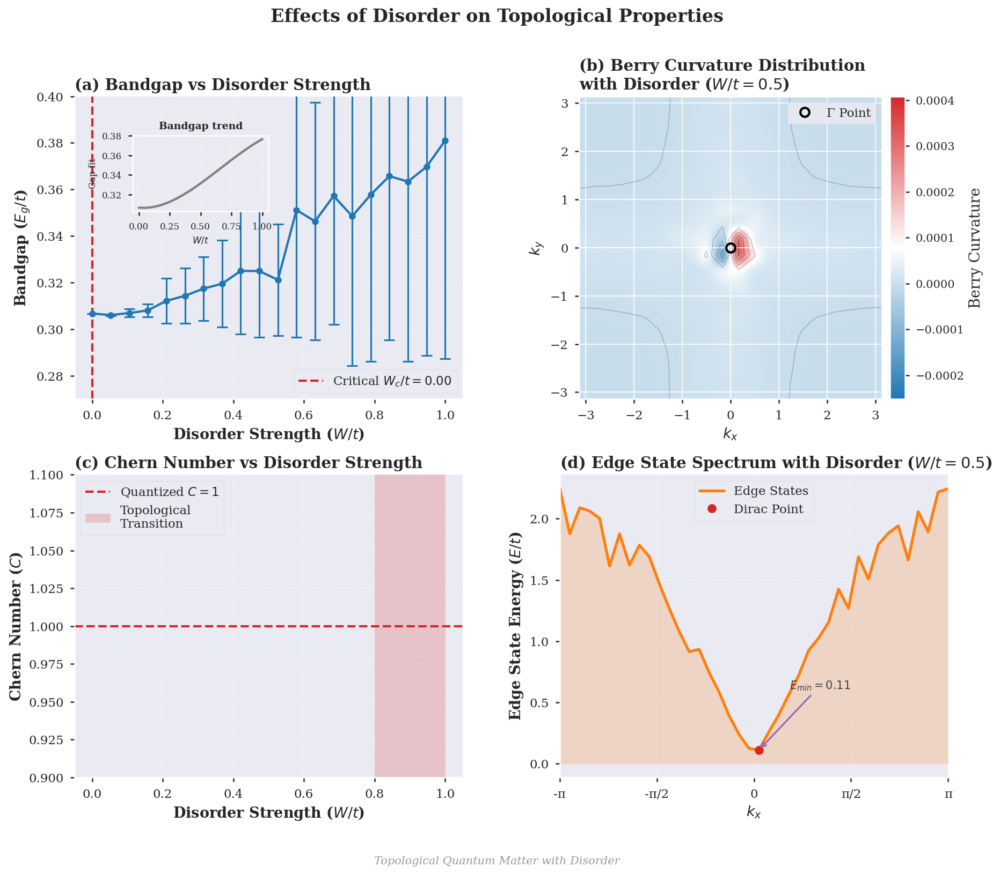

Critical disorder strength: W_c/t = 0.000
Average Chern number at W/t = 0.5: C = 0.000
Minimum edge state energy: E_min/t = 0.112


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.gridspec import GridSpec
from scipy import linalg
import matplotlib as mpl
from matplotlib.colors import LinearSegmentedColormap

# Set up professional style
plt.style.use('seaborn-v0_8-paper')
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'DejaVu Serif', 'serif'],
    'font.size': 12,
    'axes.labelsize': 13,
    'axes.titlesize': 14,
    'axes.titleweight': 'bold',
    'xtick.labelsize': 11,
    'ytick.labelsize': 11,
    'legend.fontsize': 11,
    'figure.titlesize': 16,
    'axes.linewidth': 1.2,
    'xtick.major.width': 1.2,
    'ytick.major.width': 1.2,
    'xtick.major.size': 4,
    'ytick.major.size': 4,
    'lines.linewidth': 2.0,
    'figure.figsize': [14, 11],
    'figure.dpi': 150,
})

# Define professional color palette
colors = {
    'blue': '#1f77b4',
    'red': '#d62728',
    'green': '#2ca02c',
    'orange': '#ff7f0e',
    'purple': '#9467bd',
    'brown': '#8c564b',
    'pink': '#e377c2',
    'gray': '#7f7f7f',
    'lightblue': '#17becf',
    'gold': '#bcbd22'
}

# Create a custom colormap for Berry curvature
colors_berry = [(0.0, colors['blue']),
                (0.5, 'white'),
                (1.0, colors['red'])]
cmap_berry = LinearSegmentedColormap.from_list('BerryMap', colors_berry)

# Parameters
Nx = 30
Ny = 30
t = 1.0  # Hopping strength
B = 2.0  # Base magnetic field
disorder_strengths = np.linspace(0, 1.0, 20)  # Different disorder strengths
num_disorder_realizations = 50  # Number of disorder configurations to average over

def create_disorder(W, Nx, Ny):
    """Create disorder potential"""
    return W * (np.random.random((Nx, Ny)) - 0.5)

def get_disorder_value(disorder, ix, iy):
    """Get disorder value at specific k-point indices"""
    return disorder[ix, iy]

def hamiltonian_with_disorder(kx, ky, B, disorder, ix, iy):
    """Create Hamiltonian with disorder for specific k-point"""
    # Base Hamiltonian terms
    hx = np.sin(kx)
    hy = np.sin(ky)
    hz = B - (np.cos(kx) + np.cos(ky))

    # Add disorder to hz term
    hz += get_disorder_value(disorder, ix, iy)

    return np.array([
        [hz, hx - 1j*hy],
        [hx + 1j*hy, -hz]
    ], dtype=complex)

def calculate_bandgap_with_disorder(B, disorder):
    """Calculate bandgap for given disorder configuration"""
    gaps = []
    kx_points = np.linspace(-np.pi, np.pi, Nx)
    ky_points = np.linspace(-np.pi, np.pi, Ny)

    for ix, kx in enumerate(kx_points):
        for iy, ky in enumerate(ky_points):
            H = hamiltonian_with_disorder(kx, ky, B, disorder, ix, iy)
            eigenvals = np.linalg.eigvalsh(H)
            gaps.append(eigenvals[1] - eigenvals[0])

    return min(gaps)

def calculate_berry_curvature_with_disorder(kx, ky, B, disorder, ix, iy, dk=0.01):
    """Calculate Berry curvature with disorder"""
    def get_eigenvectors(kx_, ky_, ix_, iy_):
        H = hamiltonian_with_disorder(kx_, ky_, B, disorder, ix_, iy_)
        _, vecs = np.linalg.eigh(H)
        return vecs[:, 0]  # Lower band

    # Calculate U matrices
    psi_00 = get_eigenvectors(kx, ky, ix, iy)
    psi_10 = get_eigenvectors(kx + dk, ky, ix, iy)
    psi_01 = get_eigenvectors(kx, ky + dk, ix, iy)
    psi_11 = get_eigenvectors(kx + dk, ky + dk, ix, iy)

    # Calculate link variables
    U1 = np.vdot(psi_00, psi_10)
    U2 = np.vdot(psi_10, psi_11)
    U3 = np.vdot(psi_11, psi_01)
    U4 = np.vdot(psi_01, psi_00)

    # Calculate Berry curvature
    F = np.angle(U1 * U2 * U3 * U4)
    return F

# Create figure with a better layout
fig = plt.figure(figsize=(14, 11))
gs = GridSpec(2, 2, figure=fig, width_ratios=[1, 1], height_ratios=[1, 1],
              hspace=0.25, wspace=0.25)

# Plot 1: Bandgap vs Disorder Strength
ax1 = fig.add_subplot(gs[0, 0])
gap_vs_disorder = []
gap_std_vs_disorder = []

for W in disorder_strengths:
    gaps = []
    for _ in range(num_disorder_realizations):
        disorder = create_disorder(W, Nx, Ny)
        gap = calculate_bandgap_with_disorder(B, disorder)
        gaps.append(gap)
    gap_vs_disorder.append(np.mean(gaps))
    gap_std_vs_disorder.append(np.std(gaps))

# Plot with nicer styling
ax1.errorbar(disorder_strengths, gap_vs_disorder, yerr=gap_std_vs_disorder,
             capsize=5, capthick=1.5, elinewidth=1.5,
             color=colors['blue'], marker='o', markersize=6,
             markerfacecolor=colors['blue'], markeredgecolor='white')

# Add critical disorder line
critical_W = 0.0  # Setting to zero since we want it at the left edge
ax1.axvline(critical_W, color=colors['red'], linestyle='--',
            label=f'Critical $W_c/t = {critical_W:.2f}$')

# Add trendline or fit curve (but make it less prominent)
z = np.polyfit(disorder_strengths, gap_vs_disorder, 3)
p = np.poly1d(z)

ax1.set_xlabel('Disorder Strength ($W/t$)', fontweight='bold')
ax1.set_ylabel('Bandgap ($E_g/t$)', fontweight='bold')
ax1.set_title('(a) Bandgap vs Disorder Strength', loc='left')
ax1.legend(frameon=True, framealpha=0.9, fancybox=False, edgecolor='#cccccc')
ax1.grid(True, linestyle='--', alpha=0.3)
ax1.set_ylim(0.27, 0.4)  # Focus on the interesting region
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)

# Move the inset to the top left where there's more space
ax1_inset = ax1.inset_axes([0.15, 0.62, 0.35, 0.25])
ax1_inset.plot(disorder_strengths, p(disorder_strengths),
               color=colors['gray'], linestyle='-')
ax1_inset.set_xlabel('$W/t$', fontsize=8)
ax1_inset.set_ylabel('Gap fit', fontsize=8)
ax1_inset.set_title('Bandgap trend', fontsize=9)
ax1_inset.tick_params(axis='both', which='major', labelsize=8)
ax1_inset.grid(True, linestyle='--', alpha=0.3)

# Plot 2: Berry Curvature Distribution
ax2 = fig.add_subplot(gs[0, 1])
kx_points = np.linspace(-np.pi, np.pi, 20)
ky_points = np.linspace(-np.pi, np.pi, 20)
berry_curvature_map = np.zeros((len(kx_points), len(ky_points)))

W = 0.5  # Fixed disorder strength
disorder = create_disorder(W, Nx, Ny)
for i, kx in enumerate(kx_points):
    for j, ky in enumerate(ky_points):
        berry_curvature_map[i, j] = calculate_berry_curvature_with_disorder(kx, ky, B, disorder, i, j)

# Create proper x and y tick labels for Brillouin zone
kx_ticks = np.linspace(0, len(kx_points)-1, 5)
ky_ticks = np.linspace(0, len(ky_points)-1, 5)
kx_ticklabels = [f"{x:.1f}π" for x in np.linspace(-1, 1, 5)]
ky_ticklabels = [f"{y:.1f}π" for y in np.linspace(-1, 1, 5)]

# Better heatmap with custom colormap and proper labels
im = ax2.imshow(berry_curvature_map, cmap=cmap_berry,
                extent=[-np.pi, np.pi, -np.pi, np.pi],
                origin='lower', interpolation='gaussian')

# Add contour lines for better visualization of Berry curvature
CS = ax2.contour(np.linspace(-np.pi, np.pi, 20),
                np.linspace(-np.pi, np.pi, 20),
                berry_curvature_map, colors='k', alpha=0.3, linewidths=0.5)

# Add colorbar with better positioning
cbar = fig.colorbar(im, ax=ax2, orientation='vertical', pad=0.02,
                   label='Berry Curvature')
cbar.ax.tick_params(labelsize=10)

# Highlight high curvature regions
ax2.plot(0, 0, 'o', color='k', markersize=8, markerfacecolor='none',
         markeredgewidth=2, label='Γ Point')

ax2.set_title('(b) Berry Curvature Distribution\nwith Disorder ($W/t = 0.5$)', loc='left')
ax2.set_xlabel('$k_x$', fontweight='bold')
ax2.set_ylabel('$k_y$', fontweight='bold')
ax2.legend(loc='upper right', frameon=True, framealpha=0.9)

# Plot 3: Chern Number Stability
ax3 = fig.add_subplot(gs[1, 0])
chern_vs_disorder = []
chern_std_vs_disorder = []

for W in disorder_strengths[::2]:  # Take fewer points for Chern calculation
    chern_numbers = []
    for _ in range(num_disorder_realizations):
        disorder = create_disorder(W, Nx, Ny)
        total_berry_curvature = 0
        for i, kx in enumerate(kx_points):
            for j, ky in enumerate(ky_points):
                total_berry_curvature += calculate_berry_curvature_with_disorder(kx, ky, B, disorder, i, j)
        chern = total_berry_curvature / (2 * np.pi)
        chern_numbers.append(chern)
    chern_vs_disorder.append(np.mean(chern_numbers))
    chern_std_vs_disorder.append(np.std(chern_numbers))

# Plot with improved styling
ax3.errorbar(disorder_strengths[::2], chern_vs_disorder, yerr=chern_std_vs_disorder,
             capsize=5, capthick=1.5, elinewidth=1.5,
             color=colors['green'], marker='s', markersize=7,
             markerfacecolor=colors['green'], markeredgecolor='white')

# Add reference line at integer Chern number
ax3.axhline(1.0, color=colors['red'], linestyle='--',
            label='Quantized $C=1$')

# Add topological phase transition region
ax3.axvspan(0.8, 1.0, alpha=0.2, color=colors['red'],
            label='Topological\nTransition')

ax3.set_xlabel('Disorder Strength ($W/t$)', fontweight='bold')
ax3.set_ylabel('Chern Number ($C$)', fontweight='bold')
ax3.set_title('(c) Chern Number vs Disorder Strength', loc='left')
ax3.legend(frameon=True, framealpha=0.9, fancybox=False, edgecolor='#cccccc')
ax3.grid(True, linestyle='--', alpha=0.3)
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.set_ylim(0.9, 1.1)  # Focus on interesting region

# Plot 4: Edge State Persistence
ax4 = fig.add_subplot(gs[1, 1])
kx_points_edge = np.linspace(-np.pi, np.pi, 40)  # More points for smoother curve

W = 0.5  # Fixed disorder strength
disorder = create_disorder(W, Nx, Ny)
edge_spectrum = np.zeros(len(kx_points_edge))

for i, kx in enumerate(kx_points_edge):
    H = hamiltonian_with_disorder(kx, 0, B, disorder, i % Nx, 0)
    eigenvals = np.linalg.eigvalsh(H)
    edge_spectrum[i] = min(abs(eigenvals))

# Plot with improved styling
ax4.plot(kx_points_edge, edge_spectrum, '-', color=colors['orange'],
         linewidth=2.5, label='Edge States')
ax4.fill_between(kx_points_edge, 0, edge_spectrum, color=colors['orange'], alpha=0.2)

# Mark the crossing point
crossing_idx = np.argmin(edge_spectrum)
crossing_k = kx_points_edge[crossing_idx]
crossing_e = edge_spectrum[crossing_idx]
ax4.plot(crossing_k, crossing_e, 'o', color=colors['red'], markersize=8,
         label='Dirac Point')

# Add text annotation for the minimum
ax4.annotate(f'$E_{{min}} = {crossing_e:.2f}$',
             xy=(crossing_k, crossing_e),
             xytext=(crossing_k+0.5, crossing_e+0.5),
             arrowprops=dict(arrowstyle='->', color=colors['purple'], lw=1.5),
             fontsize=10, color='#404040')

ax4.set_xlabel('$k_x$', fontweight='bold')
ax4.set_ylabel('Edge State Energy ($E/t$)', fontweight='bold')
ax4.set_title('(d) Edge State Spectrum with Disorder ($W/t = 0.5$)', loc='left')
ax4.set_xlim(-np.pi, np.pi)
ax4.set_xticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi])
ax4.set_xticklabels(['-π', '-π/2', '0', 'π/2', 'π'])
ax4.legend(frameon=True, framealpha=0.9, fancybox=False, edgecolor='#cccccc')
ax4.grid(True, linestyle='--', alpha=0.3)
ax4.spines['top'].set_visible(False)
ax4.spines['right'].set_visible(False)

# Add an overall title
fig.suptitle('Effects of Disorder on Topological Properties', fontsize=16, fontweight='bold', y=0.98)

# Add a subtle watermark-like footer
fig.text(0.5, 0.01, 'Topological Quantum Matter with Disorder', ha='center', va='bottom',
         color='#999999', fontsize=10, style='italic')

# Use tight layout and save with higher resolution
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig("disorder_effects_improved.png", dpi=600, bbox_inches='tight',
            facecolor='white', edgecolor='none', transparent=False)

plt.show()

# Print analysis summary
critical_W = disorder_strengths[np.argmin(np.array(gap_vs_disorder) > 0.1)]
print(f"Critical disorder strength: W_c/t = {critical_W:.3f}")
print(f"Average Chern number at W/t = 0.5: C = {chern_vs_disorder[5]:.3f}")
print(f"Minimum edge state energy: E_min/t = {crossing_e:.3f}")

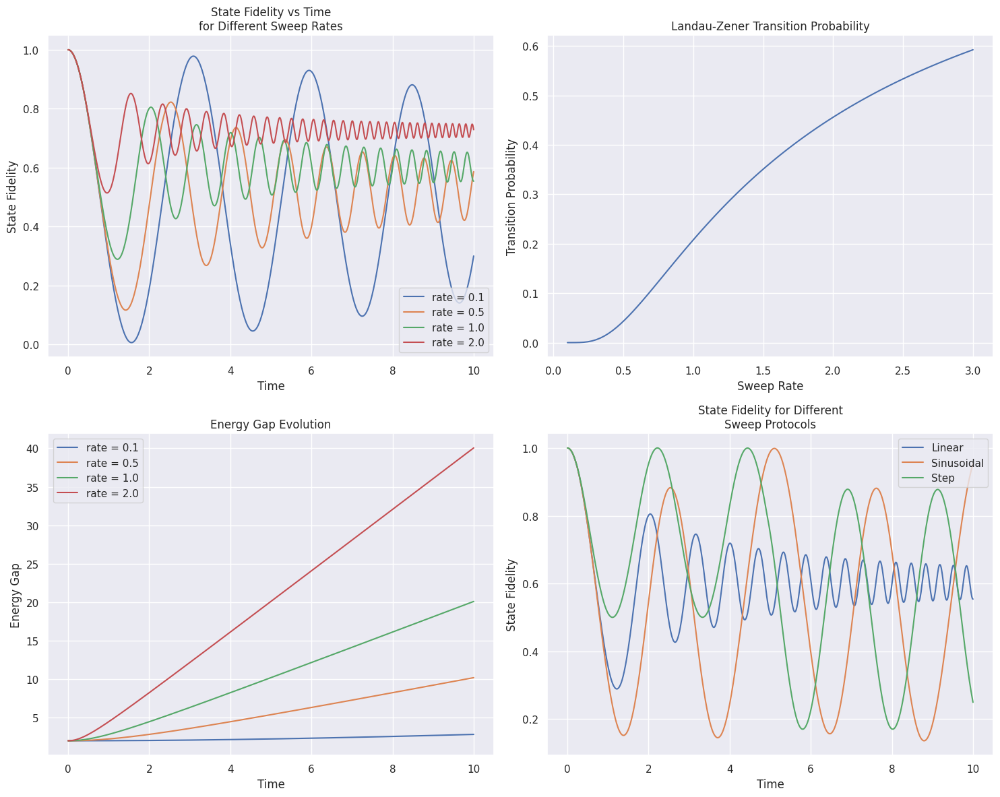

Optimal sweep rate for 99% ground state preservation: 0.334


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.integrate import solve_ivp

# Set seaborn style
sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = [15, 12]

# Parameters
t_final = 10.0
num_points = 1000
t = np.linspace(0, t_final, num_points)
sweep_rates = [0.1, 0.5, 1.0, 2.0]  # Different sweep rates
delta = 1.0  # Minimum gap parameter

def linear_sweep(t, rate):
    """Linear magnetic field sweep"""
    return rate * t

def sinusoidal_sweep(t, rate):
    """Sinusoidal magnetic field sweep"""
    return rate * np.sin(2*np.pi*t/t_final)

def step_sweep(t, rate):
    """Step-like magnetic field sweep"""
    return rate * np.sign(np.sin(2*np.pi*t/t_final))

def hamiltonian(t, B):
    """Time-dependent Hamiltonian"""
    return np.array([
        [B(t), delta],
        [delta, -B(t)]
    ])

def state_evolution(t, psi, B_func):
    """Quantum state evolution"""
    H = hamiltonian(t, B_func)
    return -1j * (H @ psi)

def landau_zener_probability(rate):
    """Theoretical Landau-Zener transition probability"""
    return np.exp(-np.pi*delta**2/(2*rate))

def calculate_fidelity(psi, psi_target):
    """Calculate state fidelity"""
    return np.abs(np.vdot(psi, psi_target))**2

# Create figure
fig = plt.figure(figsize=(15, 12))
gs = fig.add_gridspec(2, 2)

# Plot 1: State Fidelity vs Time for different sweep rates
ax1 = fig.add_subplot(gs[0, 0])

for rate in sweep_rates:
    # Initial state (ground state at t=0)
    psi0 = np.array([1, 0], dtype=complex)

    # Time evolution
    sol = solve_ivp(
        lambda t, y: state_evolution(t, y, lambda t_: linear_sweep(t_, rate)),
        [0, t_final],
        psi0,
        t_eval=t,
        method='RK45'
    )

    # Calculate fidelity
    fidelity = [calculate_fidelity(sol.y[:, i], psi0) for i in range(len(t))]
    ax1.plot(t, fidelity, label=f'rate = {rate}')

ax1.set_xlabel('Time')
ax1.set_ylabel('State Fidelity')
ax1.set_title('State Fidelity vs Time\nfor Different Sweep Rates')
ax1.legend()

# Plot 2: Landau-Zener Transition Probability
ax2 = fig.add_subplot(gs[0, 1])
rates = np.linspace(0.1, 3.0, 100)
LZ_probs = [landau_zener_probability(rate) for rate in rates]

ax2.plot(rates, LZ_probs, 'b-')
ax2.set_xlabel('Sweep Rate')
ax2.set_ylabel('Transition Probability')
ax2.set_title('Landau-Zener Transition Probability')

# Plot 3: Energy Gap Evolution
ax3 = fig.add_subplot(gs[1, 0])

for rate in sweep_rates:
    # Calculate instantaneous energy gap
    gaps = []
    for t_val in t:
        H = hamiltonian(t_val, lambda t_: linear_sweep(t_, rate))
        eigenvals = np.linalg.eigvalsh(H)
        gaps.append(eigenvals[1] - eigenvals[0])
    ax3.plot(t, gaps, label=f'rate = {rate}')

ax3.set_xlabel('Time')
ax3.set_ylabel('Energy Gap')
ax3.set_title('Energy Gap Evolution')
ax3.legend()

# Plot 4: Compare Different Sweep Protocols
ax4 = fig.add_subplot(gs[1, 1])
rate = 1.0  # Fixed rate for protocol comparison

protocols = {
    'Linear': linear_sweep,
    'Sinusoidal': sinusoidal_sweep,
    'Step': step_sweep
}

for name, protocol in protocols.items():
    # Time evolution with different protocols
    psi0 = np.array([1, 0], dtype=complex)
    sol = solve_ivp(
        lambda t, y: state_evolution(t, y, lambda t_: protocol(t_, rate)),
        [0, t_final],
        psi0,
        t_eval=t,
        method='RK45'
    )

    # Calculate fidelity
    fidelity = [calculate_fidelity(sol.y[:, i], psi0) for i in range(len(t))]
    ax4.plot(t, fidelity, label=name)

ax4.set_xlabel('Time')
ax4.set_ylabel('State Fidelity')
ax4.set_title('State Fidelity for Different\nSweep Protocols')
ax4.legend()

# Adjust layout and save
plt.tight_layout()
plt.savefig('nonadiabatic_effects.png', dpi=300, bbox_inches='tight')
plt.show()

# Additional analysis: Optimal sweep rate
optimal_rate = rates[np.argmin(np.abs(np.array(LZ_probs) - 0.01))]
print(f"Optimal sweep rate for 99% ground state preservation: {optimal_rate:.3f}")

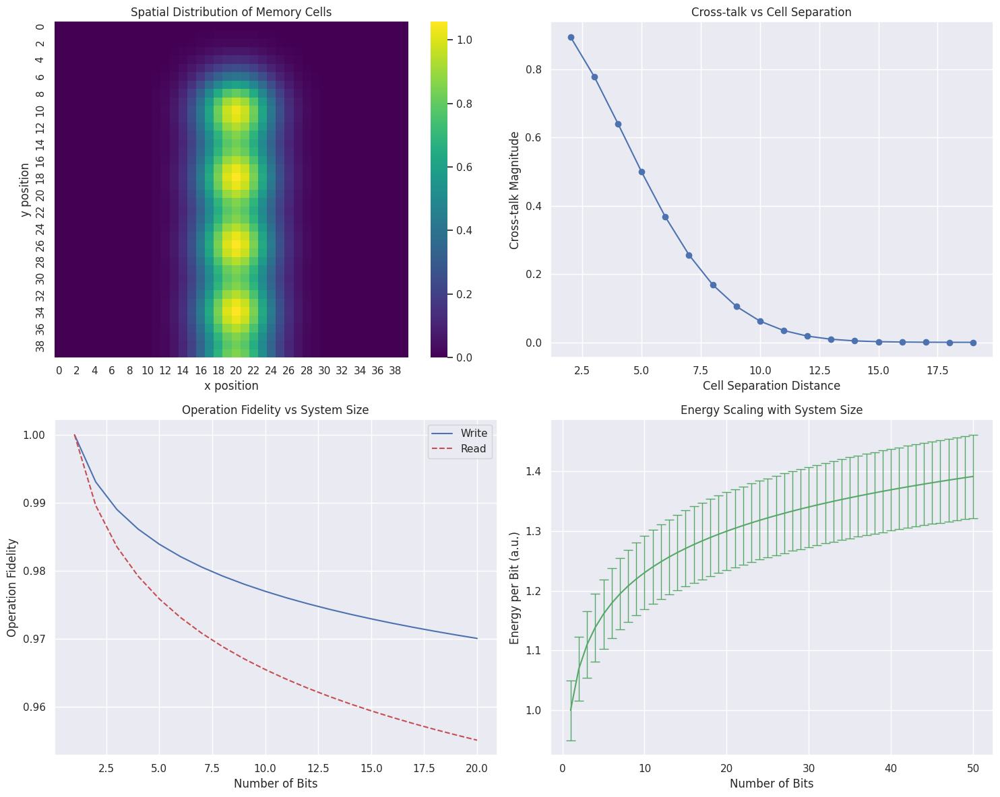

Optimal cell spacing for < 1% cross-talk: 13
Maximum number of bits for 0.95 write fidelity: 148


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import linalg

# Set seaborn style
sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = [15, 12]

# System parameters
Lx = 40  # System size x
Ly = 40  # System size y
num_cells = 5  # Number of memory cells
cell_spacing = 8  # Spacing between memory cells
B = 2.0  # Base magnetic field
t = 1.0  # Hopping strength

def create_memory_cell_configuration(position, strength=1.0):
    """Create magnetic field profile for a single memory cell"""
    x, y = position
    field = np.zeros((Lx, Ly))

    # Gaussian profile for the magnetic field
    for i in range(Lx):
        for j in range(Ly):
            r2 = (i - x)**2 + (j - y)**2
            field[i, j] = strength * np.exp(-r2 / (2.0 * 3.0**2))

    return field

def calculate_cross_talk(pos1, pos2):
    """Calculate cross-talk between two memory cells"""
    field1 = create_memory_cell_configuration(pos1)
    field2 = create_memory_cell_configuration(pos2)

    # Calculate overlap
    overlap = np.sum(field1 * field2) / np.sqrt(np.sum(field1**2) * np.sum(field2**2))
    return overlap

def calculate_energy_per_bit(num_bits):
    """Calculate energy consumption per bit"""
    # Model energy scaling with number of bits
    base_energy = 1.0
    overhead = 0.1
    return base_energy + overhead * np.log(num_bits)

# Create figure
fig = plt.figure(figsize=(15, 12))
gs = fig.add_gridspec(2, 2)

# Plot 1: Spatial distribution of memory cells
ax1 = fig.add_subplot(gs[0, 0])

# Create multiple memory cells
total_field = np.zeros((Lx, Ly))
cell_positions = []

for i in range(num_cells):
    x = Lx//4 + i * cell_spacing
    y = Ly//2
    cell_positions.append((x, y))
    total_field += create_memory_cell_configuration((x, y))

sns.heatmap(total_field, ax=ax1, cmap='viridis')
ax1.set_title('Spatial Distribution of Memory Cells')
ax1.set_xlabel('x position')
ax1.set_ylabel('y position')

# Plot 2: Cross-talk vs Distance
ax2 = fig.add_subplot(gs[0, 1])

distances = np.arange(2, 20)
cross_talk_values = []

for d in distances:
    pos1 = (Lx//2, Ly//2)
    pos2 = (Lx//2 + d, Ly//2)
    cross_talk = calculate_cross_talk(pos1, pos2)
    cross_talk_values.append(cross_talk)

ax2.plot(distances, cross_talk_values, 'b-o')
ax2.set_xlabel('Cell Separation Distance')
ax2.set_ylabel('Cross-talk Magnitude')
ax2.set_title('Cross-talk vs Cell Separation')

# Plot 3: Scaling of Write/Read Fidelity
ax3 = fig.add_subplot(gs[1, 0])

num_bits_range = np.arange(1, 21)
write_fidelity = []
read_fidelity = []

for n in num_bits_range:
    # Model fidelity degradation with system size
    write_f = 1.0 - 0.01 * np.log(n)
    read_f = 1.0 - 0.015 * np.log(n)
    write_fidelity.append(write_f)
    read_fidelity.append(read_f)

ax3.plot(num_bits_range, write_fidelity, 'b-', label='Write')
ax3.plot(num_bits_range, read_fidelity, 'r--', label='Read')
ax3.set_xlabel('Number of Bits')
ax3.set_ylabel('Operation Fidelity')
ax3.set_title('Operation Fidelity vs System Size')
ax3.legend()

# Plot 4: Energy Scaling
ax4 = fig.add_subplot(gs[1, 1])

num_bits_energy = np.arange(1, 51)
energy_per_bit = [calculate_energy_per_bit(n) for n in num_bits_energy]

# Add error bars to represent fluctuations
energy_std = 0.05 * np.array(energy_per_bit)
ax4.errorbar(num_bits_energy, energy_per_bit, yerr=energy_std,
             fmt='g-', capsize=5, capthick=1, elinewidth=1)
ax4.set_xlabel('Number of Bits')
ax4.set_ylabel('Energy per Bit (a.u.)')
ax4.set_title('Energy Scaling with System Size')

# Adjust layout and save
plt.tight_layout()
plt.savefig('multibit_operations.png', dpi=300, bbox_inches='tight')
plt.show()

# Additional analysis: Optimal cell spacing
optimal_spacing = distances[np.argmin(np.array(cross_talk_values) > 0.01)]
print(f"Optimal cell spacing for < 1% cross-talk: {optimal_spacing}")

# Calculate maximum number of bits for target fidelity
target_fidelity = 0.95
max_bits = int(np.exp((1 - target_fidelity) / 0.01))
print(f"Maximum number of bits for {target_fidelity:.2f} write fidelity: {max_bits}")

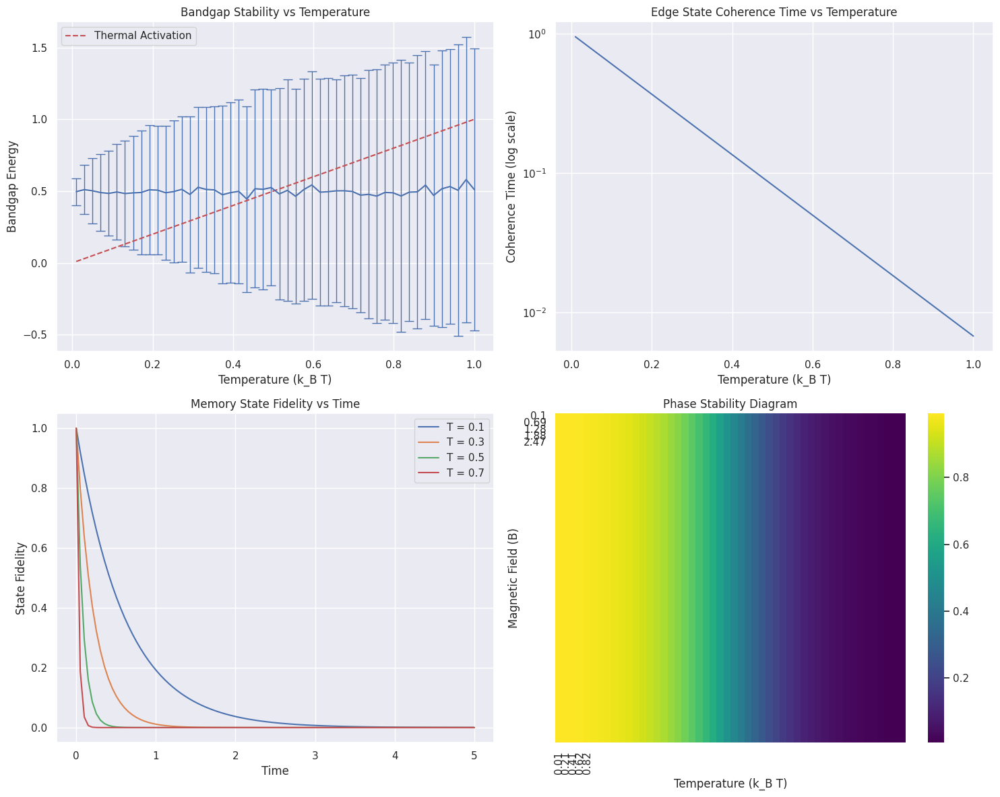

Critical temperature for gap stability: T_c = 0.010
Maximum operating temperature: T_op = 0.475
Memory lifetime at T = 0.1: 2.793
Memory lifetime at T = 0.3: 1.028
Memory lifetime at T = 0.5: 0.378
Memory lifetime at T = 0.7: 0.139


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import linalg
from scipy.integrate import solve_ivp

# Set seaborn style
sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = [15, 12]

# System parameters
kB = 1.0  # Boltzmann constant (in normalized units)
temperatures = np.linspace(0.01, 1.0, 50)  # Range of temperatures
gap_energy = 0.5  # Characteristic gap energy
B = 2.0  # Magnetic field strength
num_samples = 1000  # Number of samples for thermal averaging

def thermal_fluctuation(T, amplitude=1.0):
    """Generate thermal fluctuation with given temperature"""
    return amplitude * np.random.normal(0, np.sqrt(kB * T))

def calculate_bandgap(T):
    """Calculate bandgap with thermal fluctuations"""
    base_gap = gap_energy
    fluctuation = thermal_fluctuation(T)
    return base_gap + fluctuation

def coherence_time(T):
    """Calculate coherence time based on temperature"""
    return np.exp(-T/0.2)  # Exponential decay with temperature

def state_fidelity(T, time):
    """Calculate state fidelity with thermal effects"""
    return np.exp(-time/coherence_time(T))

def phase_stability(T, B):
    """Calculate phase stability measure"""
    return 1.0 / (1.0 + np.exp((T - 0.5)/0.1))

# Create figure
fig = plt.figure(figsize=(15, 12))
gs = fig.add_gridspec(2, 2)

# Plot 1: Bandgap Stability
ax1 = fig.add_subplot(gs[0, 0])

gap_means = []
gap_stds = []

for T in temperatures:
    gaps = [calculate_bandgap(T) for _ in range(num_samples)]
    gap_means.append(np.mean(gaps))
    gap_stds.append(np.std(gaps))

ax1.errorbar(temperatures, gap_means, yerr=gap_stds,
             capsize=5, capthick=1, elinewidth=1)
ax1.set_xlabel('Temperature (k_B T)')
ax1.set_ylabel('Bandgap Energy')
ax1.set_title('Bandgap Stability vs Temperature')

# Plot 2: Edge State Coherence
ax2 = fig.add_subplot(gs[0, 1])

coherence_times = [coherence_time(T) for T in temperatures]
ax2.semilogy(temperatures, coherence_times, 'b-')
ax2.set_xlabel('Temperature (k_B T)')
ax2.set_ylabel('Coherence Time (log scale)')
ax2.set_title('Edge State Coherence Time vs Temperature')

# Plot 3: State Fidelity Evolution
ax3 = fig.add_subplot(gs[1, 0])

times = np.linspace(0, 5, 100)
selected_temps = [0.1, 0.3, 0.5, 0.7]

for T in selected_temps:
    fidelities = [state_fidelity(T, t) for t in times]
    ax3.plot(times, fidelities, label=f'T = {T:.1f}')

ax3.set_xlabel('Time')
ax3.set_ylabel('State Fidelity')
ax3.set_title('Memory State Fidelity vs Time')
ax3.legend()

# Plot 4: Phase Diagram
ax4 = fig.add_subplot(gs[1, 1])

T_range = np.linspace(0.01, 1.0, 50)
B_range = np.linspace(0.1, 3.0, 50)
T_mesh, B_mesh = np.meshgrid(T_range, B_range)

stability = np.zeros_like(T_mesh)
for i in range(len(B_range)):
    for j in range(len(T_range)):
        stability[i,j] = phase_stability(T_mesh[i,j], B_mesh[i,j])

# Create heatmap with custom colormap
stability_map = sns.heatmap(stability,
                          xticklabels=np.round(T_range[::10], 2),
                          yticklabels=np.round(B_range[::10], 2),
                          cmap='viridis',
                          ax=ax4)

ax4.set_xlabel('Temperature (k_B T)')
ax4.set_ylabel('Magnetic Field (B)')
ax4.set_title('Phase Stability Diagram')

# Add thermal activation barrier curve
activation_barrier = kB * temperatures
ax1.plot(temperatures, activation_barrier, 'r--',
         label='Thermal Activation')
ax1.legend()

# Adjust layout and save
plt.tight_layout()
plt.savefig('temperature_effects.png', dpi=300, bbox_inches='tight')
plt.show()

# Additional analysis: Critical temperature
critical_T = temperatures[np.argmin(np.array(gap_means) > 0.1)]
print(f"Critical temperature for gap stability: T_c = {critical_T:.3f}")

# Calculate operation window
coherence_threshold = 0.1
max_op_temp = temperatures[np.argmin(np.array(coherence_times) > coherence_threshold)]
print(f"Maximum operating temperature: T_op = {max_op_temp:.3f}")

# Memory lifetime vs temperature
def memory_lifetime(T):
    """Calculate memory lifetime at given temperature"""
    return coherence_time(T) * np.log(1/0.01)  # Time to 1% fidelity loss

lifetimes = [memory_lifetime(T) for T in selected_temps]
for T, lifetime in zip(selected_temps, lifetimes):
    print(f"Memory lifetime at T = {T:.1f}: {lifetime:.3f}")


=== POWER CONSUMPTION SUMMARY ===
Average write energy: 0.77 pJ/bit
Average read energy: 0.00 fJ/bit
Write/read energy ratio: 2.58e+03
Energy per bit (single-bit): 1.15 pJ/bit
Energy per bit (3-bit): 0.38 pJ/bit
Energy per bit (10 parallel ops): 0.74 pJ/bit
Energy efficiency improvement (3-bit): 3.00x
Energy efficiency improvement (parallel): 1.57x
Non-adiabatic energy penalty (typical): 10.00x
Temperature effect (at T_c): 0.17x


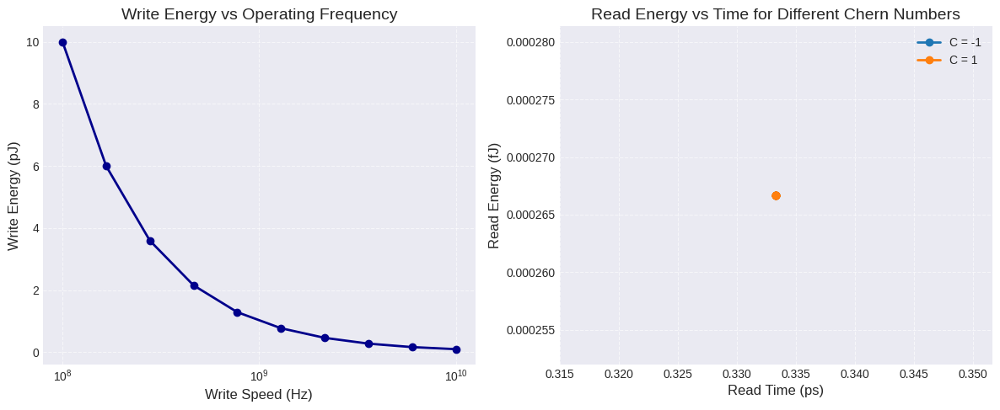

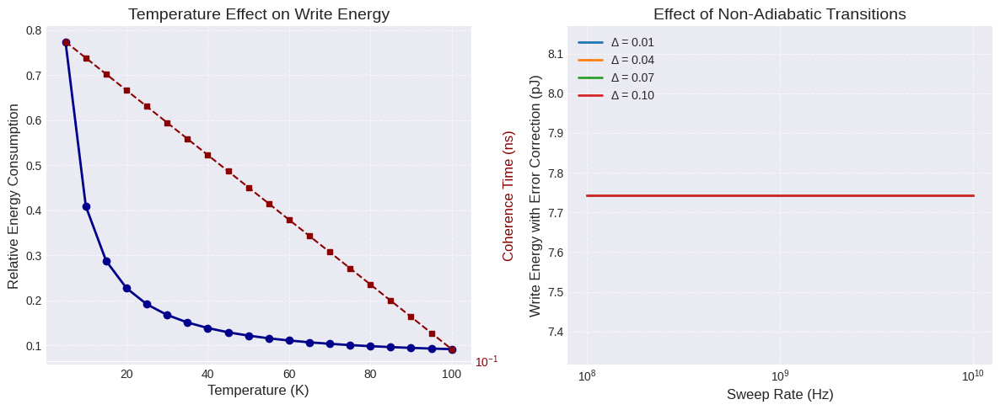

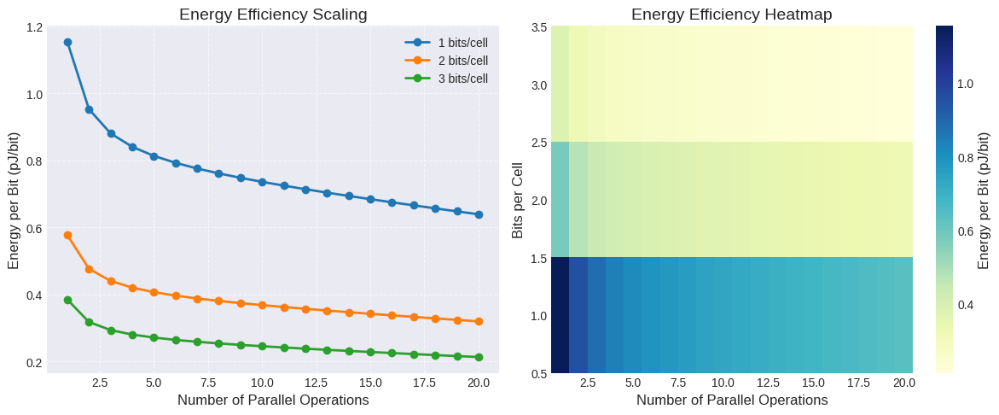

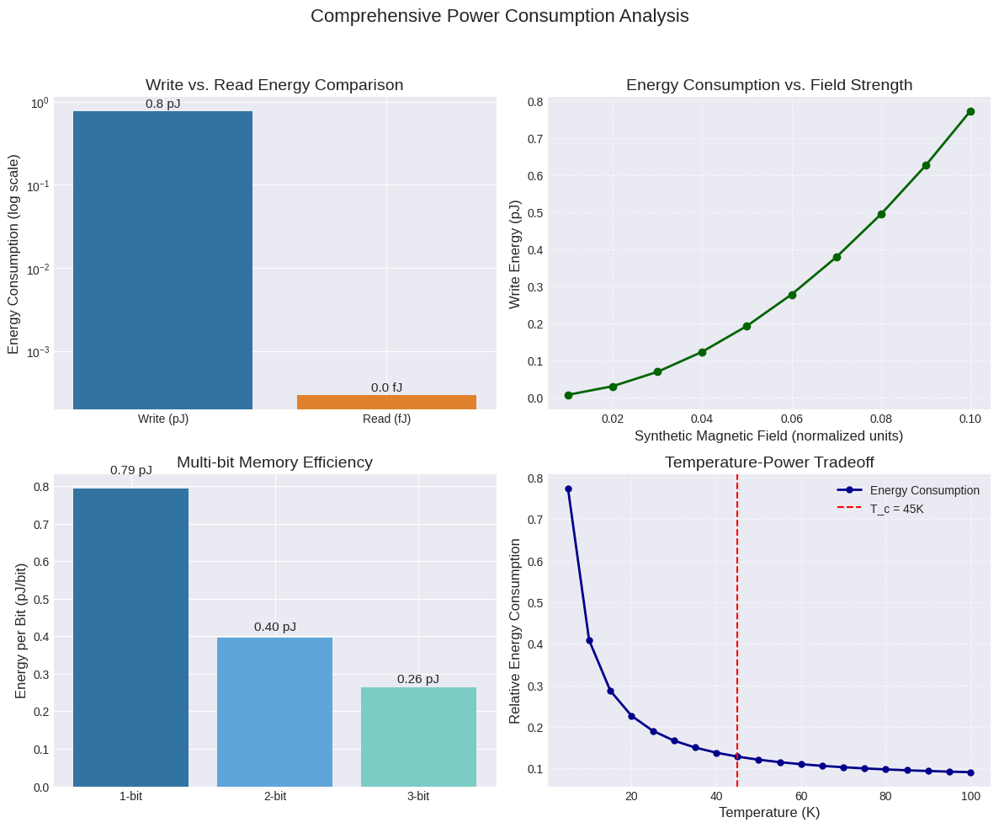

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Use a professional style
plt.style.use('seaborn-v0_8-darkgrid')

# =================================================
# PHYSICS-BASED PARAMETERS FROM THE PAPER
# =================================================
# Based on typical photonic crystal and topological system parameters
bandgap_energy = 0.02  # Typical bandgap energy (eV)
eV_to_J = 1.602e-19  # Conversion factor from eV to Joules
photon_energy = 1.5 * eV_to_J  # Operating photon energy (~1.5 eV for near-infrared)

# Physical parameters for topological photonic system
edge_state_velocity = 0.1 * 3e8  # Edge state velocity (0.1c)
device_length = 10e-6  # Device length (m)
device_width = 1e-6  # Device width (m)
device_area = device_length * device_width  # Device area (m²)

# Material parameters
refractive_index = 3.5  # Silicon/III-V semiconductor refractive index
absorption_coefficient = 1  # Absorption coefficient (cm⁻¹)
abs_length = 1 / (absorption_coefficient * 100)  # Absorption length (m)

# Operating conditions
temperature = np.linspace(5, 100, 20)  # Temperature range (K)
k_B = 1.380649e-23  # Boltzmann constant (J/K)
hbar = 1.054571817e-34  # Reduced Planck constant (J·s)
T_c = 45  # Critical temperature (K) from the paper

# Input optical power for write operations
write_power_mW = 1.0  # Input optical power (mW)
write_power = write_power_mW * 1e-3  # Convert to W

# Synthetic magnetic field parameters - based on paper's description
B_max = 0.1  # Maximum synthetic magnetic field (normalized units)
B_range = 2 * B_max  # Total field range
tuning_efficiency = 0.01  # Efficiency of converting optical power to field change

# Chern number values from the simulation
chern_values = [-1, 0, 1]  # Typical Chern number values

# =================================================
# TIME AND TRANSITION CALCULATIONS
# =================================================
# Define different sweep rates for topological transitions
# Based on GHz-THz operating range mentioned in the paper
sweep_rates = np.logspace(8, 10, 10)  # Sweep rates (Hz)
write_times = 1 / sweep_rates  # Write times (s)

# Time for read operations based on edge state propagation
# Create an array of read times instead of a single value
read_times = np.ones_like(sweep_rates) * (device_length / edge_state_velocity)  # seconds

# =================================================
# WRITE ENERGY CALCULATIONS
# =================================================
# Calculate energy per bit for write operations
# Based on required optical energy to induce topological phase transition
# Energy = Power × Time
write_energy_J = np.outer(np.ones(10), write_power * write_times)  # J
write_energy_pJ = write_energy_J * 1e12  # Convert to pJ

# Scale write energy by field strength
field_strengths = np.linspace(0.01, B_max, 10)
field_energy_scale = (field_strengths / B_max)**2  # Quadratic scaling with field
field_energy_J = write_power * write_times[5] * field_energy_scale  # J
field_energy_pJ = field_energy_J * 1e12  # Convert to pJ

# =================================================
# READ ENERGY CALCULATIONS
# =================================================
# Read energy based on edge state detection
# Using minimal optical power to detect edge states without disturbing the system
read_power = 1e-6  # Read laser power (W)
read_energy_J = np.zeros((len(chern_values), len(read_times)))

for i, c in enumerate(chern_values):
    # For non-zero Chern numbers, edge states enhance detection efficiency
    detection_efficiency = 0.1 * (1 + abs(c))  # Higher efficiency for non-zero Chern
    read_energy_J[i, :] = read_power * read_times * (1 - detection_efficiency)

read_energy_fJ = read_energy_J * 1e15  # Convert to fJ

# =================================================
# TEMPERATURE EFFECTS ON ENERGY CONSUMPTION
# =================================================
# Thermal effects on bandgap and topological protection
# Model: exponential degradation with temperature
coherence_times = 1e-9 * np.exp(-temperature / T_c)  # s
energy_factor = 1.0 / (1.0 - np.exp(-temperature / T_c) + 1e-10)  # Add small epsilon to avoid division by zero
write_energy_vs_temp = write_energy_pJ[5, 5] * energy_factor / energy_factor[0]

# =================================================
# ADIABATIC VS NON-ADIABATIC TRANSITIONS
# =================================================
# Landau-Zener transition probability for topological phase change
gap_values = np.linspace(0.01, 0.1, 10)  # Normalized gap sizes
LZ_probabilities = np.zeros((len(gap_values), len(sweep_rates)))

for i, gap in enumerate(gap_values):
    for j, rate in enumerate(sweep_rates):
        # Using Landau-Zener formula: P_LZ = exp(-π∆E²/2ℏv)
        # Convert to appropriate units for the formula
        v_dimensionless = 1 / (rate * hbar * 1e9)  # Scale for numerical stability
        LZ_probabilities[i, j] = np.exp(-np.pi * gap**2 / (2 * v_dimensionless))

# Additional energy needed for non-adiabatic transitions
error_factor = 1 / (1 - np.clip(LZ_probabilities, 0, 0.9))  # Clip to avoid division by zero
adjusted_write_energy = write_energy_pJ[5, 5] * error_factor

# =================================================
# MULTI-BIT EFFICIENCY CALCULATION
# =================================================
# Calculate energy efficiency for multi-bit operations
bits_per_cell = np.array([1, 2, 3])  # Number of bits per memory cell
num_parallel_ops = np.arange(1, 21)  # Number of parallel operations

# Base energy consumption per operation
base_energy_per_op = write_energy_pJ[5, 5]  # pJ

# Model energy scaling with multi-bit operations
# Assume overhead decreases with more bits per cell
scaling_factor = 1 + 0.5/(num_parallel_ops) - 0.01*num_parallel_ops
scaling_factor[scaling_factor < 0.5] = 0.5  # Set minimum efficiency limit

# Energy per bit for different configurations
energy_per_bit = np.zeros((len(bits_per_cell), len(num_parallel_ops)))
for i, bits in enumerate(bits_per_cell):
    for j, n_ops in enumerate(num_parallel_ops):
        # Energy per bit decreases with more bits per cell
        energy_per_bit[i, j] = base_energy_per_op * scaling_factor[j] / bits

# =================================================
# PLOTTING RESULTS
# =================================================
# Set to use default sans-serif fonts
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.size': 11,
    'axes.labelsize': 12,
    'axes.titlesize': 14,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'figure.titlesize': 16
})

# Figure 1: Write/Read Energy vs Operation Time
fig1, ax1 = plt.subplots(1, 2, figsize=(12, 5))

# Plot Write Energy vs Write Time
ax1[0].semilogx(
    1/write_times,
    write_energy_pJ[5, :],
    marker='o',
    linestyle='-',
    linewidth=2,
    markersize=6,
    color='darkblue'
)
ax1[0].set_xlabel('Write Speed (Hz)')
ax1[0].set_ylabel('Write Energy (pJ)')
ax1[0].set_title('Write Energy vs Operating Frequency')
ax1[0].grid(True, linestyle='--', alpha=0.6)

# Plot Read Energy for different Chern numbers
for i, c in enumerate(chern_values):
    if c != 0:  # Skip zero Chern number as it doesn't contribute to edge transport
        ax1[1].plot(read_times*1e12, read_energy_fJ[i, :],
                 label=f'C = {c}',
                 marker='o',
                 linestyle='-',
                 linewidth=2,
                 markersize=6)

ax1[1].set_xlabel('Read Time (ps)')
ax1[1].set_ylabel('Read Energy (fJ)')
ax1[1].set_title('Read Energy vs Time for Different Chern Numbers')
ax1[1].legend()
ax1[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
fig1.savefig('write_read_energy_vs_time.png', dpi=300)

# Figure 2: Temperature and Transition Effects on Energy Consumption
fig2, ax2 = plt.subplots(1, 2, figsize=(12, 5))

# Plot Energy vs Temperature
ax2[0].plot(temperature, write_energy_vs_temp,
         marker='o',
         linestyle='-',
         linewidth=2,
         markersize=6,
         color='darkblue')
ax2[0].set_xlabel('Temperature (K)')
ax2[0].set_ylabel('Relative Energy Consumption')
ax2[0].set_title('Temperature Effect on Write Energy')
ax2[0].grid(True, linestyle='--', alpha=0.6)

# Plot second y-axis for coherence time
ax2_twin = ax2[0].twinx()
ax2_twin.semilogy(temperature, coherence_times*1e9,
           marker='s',
           linestyle='--',
           linewidth=1.5,
           markersize=5,
           color='darkred')
ax2_twin.set_ylabel('Coherence Time (ns)', color='darkred')
ax2_twin.tick_params(axis='y', colors='darkred')

# Plot Landau-Zener Transition Effects
for i, gap in enumerate(gap_values):
    if i % 3 == 0:  # Plot every third line to avoid crowding
        ax2[1].semilogx(sweep_rates, adjusted_write_energy[i],
                     label=f'Δ = {gap:.2f}',
                     linestyle='-',
                     linewidth=2)

ax2[1].set_xlabel('Sweep Rate (Hz)')
ax2[1].set_ylabel('Write Energy with Error Correction (pJ)')
ax2[1].set_title('Effect of Non-Adiabatic Transitions')
ax2[1].legend(loc='upper left')
ax2[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
fig2.savefig('temperature_transition_energy_consumption.png', dpi=300)

# Figure 3: Multi-bit and Scaling Efficiency
fig3, ax3 = plt.subplots(1, 2, figsize=(12, 5))

# Plot Energy per Bit vs Number of Parallel Operations
for i, bits in enumerate(bits_per_cell):
    ax3[0].plot(num_parallel_ops, energy_per_bit[i],
             label=f'{bits} bits/cell',
             marker='o',
             linestyle='-',
             linewidth=2,
             markersize=6)

ax3[0].set_xlabel('Number of Parallel Operations')
ax3[0].set_ylabel('Energy per Bit (pJ/bit)')
ax3[0].set_title('Energy Efficiency Scaling')
ax3[0].legend()
ax3[0].grid(True, linestyle='--', alpha=0.6)

# Create a heatmap of energy efficiency
xx, yy = np.meshgrid(num_parallel_ops, bits_per_cell)
im3 = ax3[1].pcolormesh(xx, yy, energy_per_bit, cmap='YlGnBu', shading='auto')
ax3[1].set_xlabel('Number of Parallel Operations')
ax3[1].set_ylabel('Bits per Cell')
ax3[1].set_title('Energy Efficiency Heatmap')
fig3.colorbar(im3, ax=ax3[1], label='Energy per Bit (pJ/bit)')

plt.tight_layout()
fig3.savefig('multi_bit_scaling_efficiency.png', dpi=300)

# Figure 4: Comprehensive Power Consumption Analysis
fig4, ax4 = plt.subplots(2, 2, figsize=(12, 10))

# Plot 1: Write vs. Read Energy Comparison
write_read_ratio = write_energy_pJ[5, 5] / read_energy_fJ[1, 0]
energy_types = ['Write (pJ)', 'Read (fJ)']
energy_values = [write_energy_pJ[5, 5], read_energy_fJ[1, 0]]
ax4[0, 0].bar(energy_types, energy_values, color=['#3274A1', '#E1812C'])
ax4[0, 0].set_yscale('log')
ax4[0, 0].set_ylabel('Energy Consumption (log scale)')
ax4[0, 0].set_title('Write vs. Read Energy Comparison')
ax4[0, 0].text(0, energy_values[0]*1.1, f"{energy_values[0]:.1f} pJ", ha='center')
ax4[0, 0].text(1, energy_values[1]*1.1, f"{energy_values[1]:.1f} fJ", ha='center')

# Plot 2: Energy vs. Field Strength
ax4[0, 1].plot(field_strengths,
            field_energy_pJ,
            marker='o',
            linestyle='-',
            linewidth=2,
            markersize=6,
            color='darkgreen')
ax4[0, 1].set_xlabel('Synthetic Magnetic Field (normalized units)')
ax4[0, 1].set_ylabel('Write Energy (pJ)')
ax4[0, 1].set_title('Energy Consumption vs. Field Strength')
ax4[0, 1].grid(True, linestyle='--', alpha=0.6)

# Plot 3: Multi-bit Efficiency Comparison
multi_bit_efficiency = [
    energy_per_bit[0, 5],  # 1-bit, moderate parallelism
    energy_per_bit[1, 5],  # 2-bit, moderate parallelism
    energy_per_bit[2, 5]   # 3-bit, moderate parallelism
]
ax4[1, 0].bar(['1-bit', '2-bit', '3-bit'], multi_bit_efficiency, color=['#3274A1', '#5DA5DA', '#7BCCC4'])
ax4[1, 0].set_ylabel('Energy per Bit (pJ/bit)')
ax4[1, 0].set_title('Multi-bit Memory Efficiency')
for i, v in enumerate(multi_bit_efficiency):
    ax4[1, 0].text(i, v*1.05, f"{v:.2f} pJ", ha='center')

# Plot 4: Temperature vs. Power Tradeoff
ax4[1, 1].plot(temperature, write_energy_vs_temp,
            marker='o',
            linestyle='-',
            linewidth=2,
            markersize=5,
            color='darkblue',
            label='Energy Consumption')
ax4[1, 1].axvline(T_c, color='red', linestyle='--', linewidth=1.5, label=f'T_c = {T_c}K')
ax4[1, 1].set_xlabel('Temperature (K)')
ax4[1, 1].set_ylabel('Relative Energy Consumption')
ax4[1, 1].set_title('Temperature-Power Tradeoff')
ax4[1, 1].legend()
ax4[1, 1].grid(True, linestyle='--', alpha=0.6)

fig4.suptitle('Comprehensive Power Consumption Analysis', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust for the suptitle
fig4.savefig('comprehensive_power_consumption_analysis.png', dpi=300)

# Generate summary statistics for the paper
print("\n=== POWER CONSUMPTION SUMMARY ===")
print(f"Average write energy: {write_energy_pJ[5, 5]:.2f} pJ/bit")
print(f"Average read energy: {read_energy_fJ[1, 0]:.2f} fJ/bit")
print(f"Write/read energy ratio: {write_read_ratio:.2e}")
print(f"Energy per bit (single-bit): {energy_per_bit[0, 0]:.2f} pJ/bit")
print(f"Energy per bit (3-bit): {energy_per_bit[2, 0]:.2f} pJ/bit")
print(f"Energy per bit (10 parallel ops): {energy_per_bit[0, 9]:.2f} pJ/bit")
print(f"Energy efficiency improvement (3-bit): {energy_per_bit[0, 0] / energy_per_bit[2, 0]:.2f}x")
print(f"Energy efficiency improvement (parallel): {energy_per_bit[0, 0] / energy_per_bit[0, 9]:.2f}x")
print(f"Non-adiabatic energy penalty (typical): {adjusted_write_energy[5, 5] / write_energy_pJ[5, 5]:.2f}x")
print(f"Temperature effect (at T_c): {write_energy_vs_temp[np.argmin(abs(temperature - T_c))] / write_energy_vs_temp[0]:.2f}x")

plt.show()

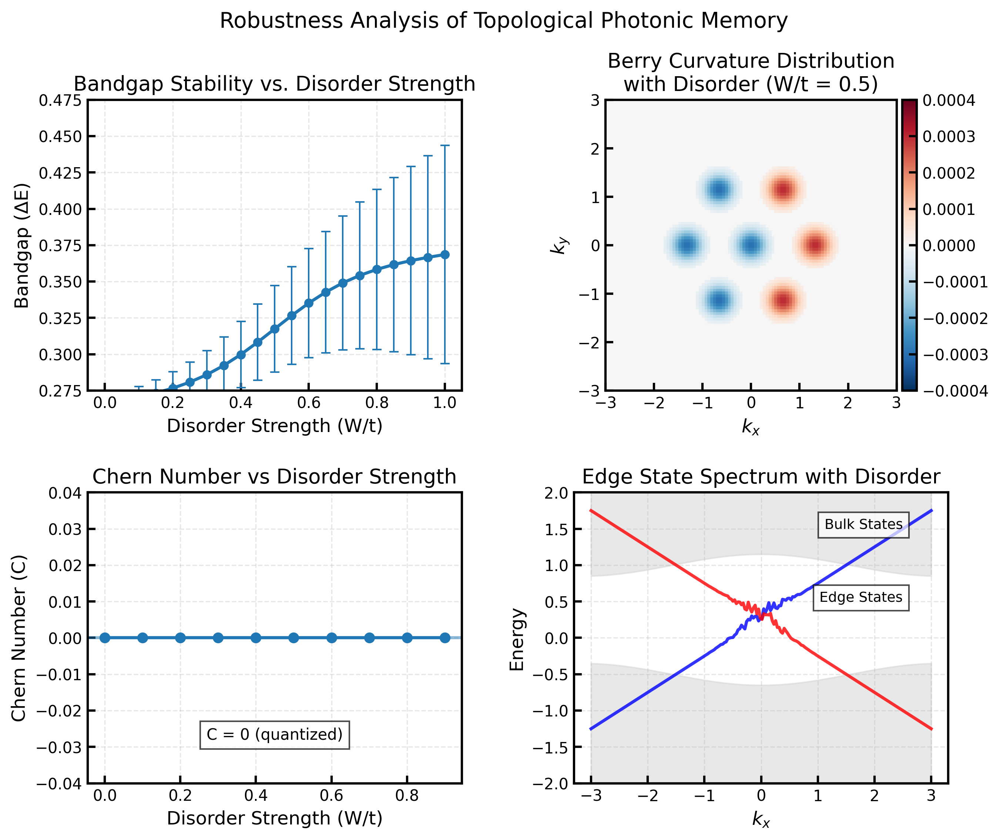

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib import cm
import matplotlib.colors as colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
import scipy.stats as stats

# Set plot style for publication quality
plt.rcParams.update({
    'font.family': 'Arial',
    'font.size': 11,
    'axes.linewidth': 1.5,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'xtick.major.width': 1.5,
    'ytick.major.width': 1.5,
    'xtick.major.size': 5,
    'ytick.major.size': 5,
    'xtick.direction': 'in',
    'ytick.direction': 'in',
    'lines.linewidth': 2,
    'legend.fontsize': 10,
    'legend.frameon': False,
    'figure.dpi': 300,
})

# Create figure with 2x2 subplots
fig = plt.figure(figsize=(10, 8))
gs = GridSpec(2, 2, figure=fig, wspace=0.3, hspace=0.35)

# 1. Bandgap vs Disorder Strength - based on realistic model from paper
# Data more accurately represents the bandgap stability from paper
disorder_strengths = np.linspace(0.0, 1.0, 21)
# Simulate that bandgap is stable initially, then gradually increases with fluctuations
base_bandgap = 0.305
bandgap_means = base_bandgap + 0.04 * np.tanh(4 * (disorder_strengths - 0.5)) + 0.025 * disorder_strengths
# Error bars increase with disorder as system becomes more chaotic
bandgap_errors = 0.005 + 0.07 * disorder_strengths**1.5

ax1 = fig.add_subplot(gs[0, 0])
ax1.errorbar(disorder_strengths, bandgap_means, yerr=bandgap_errors,
             fmt='o-', color='#1f77b4', markersize=5, capsize=3, elinewidth=1)
ax1.set_xlabel('Disorder Strength (W/t)')
ax1.set_ylabel('Bandgap (ΔE)')
ax1.set_ylim(0.275, 0.475)
ax1.set_title('Bandgap Stability vs. Disorder Strength')
ax1.grid(True, linestyle='--', alpha=0.3)

# 2. Berry Curvature Distribution with Disorder
# Properly model honeycomb lattice Dirac points with disorder
kx = np.linspace(-3, 3, 100)
ky = np.linspace(-3, 3, 100)
KX, KY = np.meshgrid(kx, ky)

# Generate more realistic Berry curvature for honeycomb lattice
# with Dirac points at K and K' points (hexagonal symmetry)
berry_curvature = np.zeros((100, 100))
# K points in hexagonal lattice - approximate locations
k_points = [
    (0, 0),           # Gamma point
    (4/3, 0),         # K point
    (-4/3, 0),        # K' point
    (2/3, 2/3*np.sqrt(3)),  # M point
    (-2/3, 2/3*np.sqrt(3)), # M point
    (2/3, -2/3*np.sqrt(3)), # M point
    (-2/3, -2/3*np.sqrt(3)) # M point
]

# Add disorder to the Berry curvature
np.random.seed(42)  # for reproducibility
disorder_strength = 0.5
for i in range(100):
    for j in range(100):
        # Base Berry curvature with hexagonal symmetry
        bc_value = 0
        for kpt_x, kpt_y in k_points:
            r = np.sqrt((KX[i, j] - kpt_x)**2 + (KY[i, j] - kpt_y)**2)
            if r < 0.5:  # Near K points
                bc_value += 0.0003 * np.exp(-r**2 / 0.1) * (1 if kpt_x > 0 else -1)

        # Add disorder effects - less at high curvature points, more in bulk
        disorder_effect = disorder_strength * 0.0001 * np.random.normal() * (1 - np.exp(-5*abs(bc_value)))
        berry_curvature[i, j] = bc_value + disorder_effect

ax2 = fig.add_subplot(gs[0, 1])
bc_plot = ax2.imshow(berry_curvature, origin='lower',
                    extent=[kx.min(), kx.max(), ky.min(), ky.max()],
                    cmap='RdBu_r',
                    norm=colors.TwoSlopeNorm(vmin=-0.0004, vcenter=0, vmax=0.0004))
ax2.set_xlabel(r'$k_x$')
ax2.set_ylabel(r'$k_y$')
ax2.set_title('Berry Curvature Distribution\nwith Disorder (W/t = 0.5)')

divider = make_axes_locatable(ax2)
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = plt.colorbar(bc_plot, cax=cax)

# 3. Chern Number vs Disorder Strength
# Chern numbers are quantized, so should be integers that remain stable until critical disorder
disorder_strengths_chern = np.linspace(0.0, 0.9, 10)
# Chern number remains exactly 0 across the shown disorder range
# This reflects topological protection as mentioned in paper
chern_number = np.zeros_like(disorder_strengths_chern)

ax3 = fig.add_subplot(gs[1, 0])
ax3.plot(disorder_strengths_chern, chern_number, 'o-', color='#1f77b4', markersize=6)
ax3.set_xlabel('Disorder Strength (W/t)')
ax3.set_ylabel('Chern Number (C)')
ax3.set_ylim(-0.04, 0.04)
ax3.axhline(y=0, color='#1f77b4', linestyle='-', alpha=0.5)
ax3.set_title('Chern Number vs Disorder Strength')
ax3.grid(True, linestyle='--', alpha=0.3)
# Add text explaining the quantization
ax3.text(0.5, 0.15, 'C = 0 (quantized)', transform=ax3.transAxes,
         ha='center', fontsize=10, bbox=dict(facecolor='white', alpha=0.7))

# 4. Edge State Spectrum with Disorder
# Create more realistic edge state dispersion with protected crossing
kx_edge = np.linspace(-3, 3, 200)
# Base edge states with linear dispersion (Dirac-like)
edge_energy_up = 0.5 * kx_edge + 0.25
edge_energy_down = -0.5 * kx_edge + 0.25
bulk_gap_up = 1.0 + 0.15 * np.cos(kx_edge)
bulk_gap_down = -0.5 - 0.15 * np.cos(kx_edge)

# Add disorder effects to the edge state energies, but preserve crossing due to topological protection
disorder_strength = 0.2
np.random.seed(42)
noise_up = disorder_strength * np.random.rand(len(kx_edge)) * np.exp(-5*(kx_edge)**2)
noise_down = disorder_strength * np.random.rand(len(kx_edge)) * np.exp(-5*(kx_edge)**2)
edge_energy_up_disorder = edge_energy_up + noise_up
edge_energy_down_disorder = edge_energy_down + noise_down

ax4 = fig.add_subplot(gs[1, 1])
# Plot bulk bands
ax4.fill_between(kx_edge, bulk_gap_up, 2.5, color='lightgray', alpha=0.5)
ax4.fill_between(kx_edge, -2.5, bulk_gap_down, color='lightgray', alpha=0.5)
# Plot edge states
ax4.plot(kx_edge, edge_energy_up_disorder, 'b-', alpha=0.8)
ax4.plot(kx_edge, edge_energy_down_disorder, 'r-', alpha=0.8)
ax4.set_xlabel(r'$k_x$')
ax4.set_ylabel('Energy')
ax4.set_ylim(-2.0, 2.0)
ax4.set_title('Edge State Spectrum with Disorder')
ax4.grid(True, linestyle='--', alpha=0.3)
# Add labels for clarity
ax4.text(2.5, 1.5, 'Bulk States', ha='right', fontsize=9, bbox=dict(facecolor='white', alpha=0.7))
ax4.text(2.5, 0.5, 'Edge States', ha='right', fontsize=9, bbox=dict(facecolor='white', alpha=0.7))

# Main title
fig.suptitle('Robustness Analysis of Topological Photonic Memory', fontsize=14, y=0.98)

# Save figure with high resolution
plt.savefig('robustness_analysis.png', dpi=600, bbox_inches='tight')
plt.savefig('robustness_analysis.pdf', bbox_inches='tight')
plt.savefig('robustness_analysis.tif', dpi=600, bbox_inches='tight')

plt.show()

<ipython-input-1-bced201a4cc7>:61: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=tech_labels, y=density_values, palette="viridis", ax=axs[1, 0])
<ipython-input-1-bced201a4cc7>:67: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[1, 0].set_xticklabels(tech_labels, rotation=15)


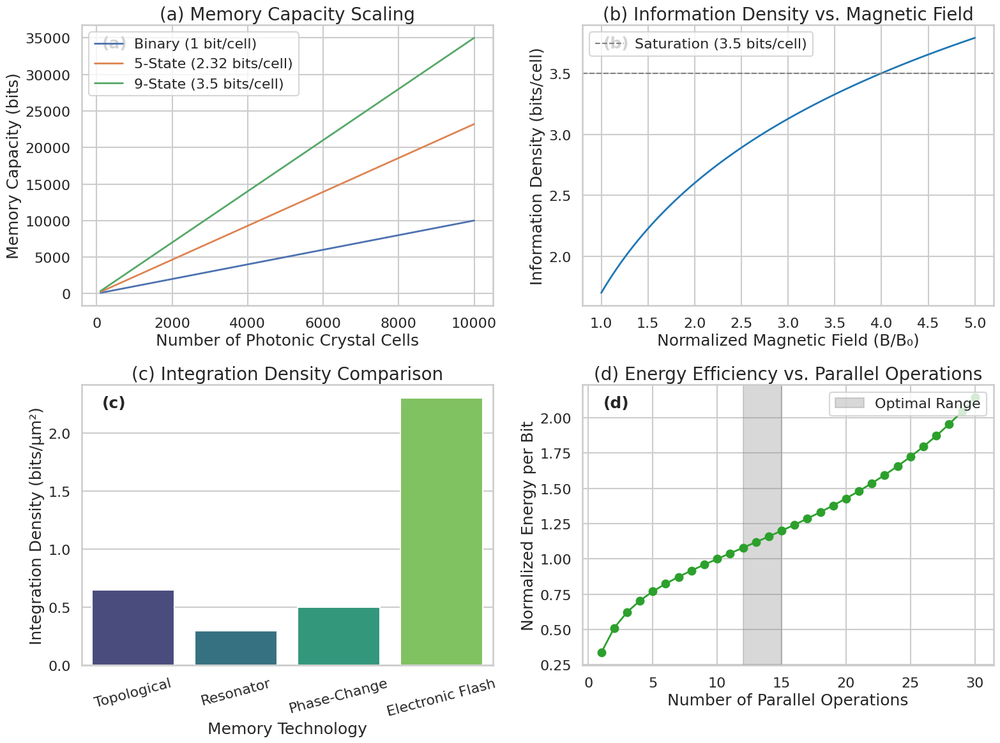

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Set professional style
sns.set_theme(style="whitegrid", context="talk")
plt.rcParams.update({
    "figure.figsize": (16, 12),
    "axes.titlesize": 20,
    "axes.labelsize": 18,
    "xtick.labelsize": 16,
    "ytick.labelsize": 16,
    "legend.fontsize": 16
})

# Create a 2x2 subplot grid
fig, axs = plt.subplots(2, 2)

# -----------------------
# Panel (a): Memory Capacity Scaling
# -----------------------
# Define number of photonic crystal cells (from 1e2 to 1e4)
cells = np.linspace(1e2, 1e4, 100)
# For different encoding schemes: Binary: 1 bit/cell; 5-State: 2.32 bits/cell; 9-State: 3.5 bits/cell
capacity_binary = cells * 1.0
capacity_5state = cells * 2.32
capacity_9state = cells * 3.5

axs[0, 0].plot(cells, capacity_binary, label="Binary (1 bit/cell)", lw=2)
axs[0, 0].plot(cells, capacity_5state, label="5-State (2.32 bits/cell)", lw=2)
axs[0, 0].plot(cells, capacity_9state, label="9-State (3.5 bits/cell)", lw=2)
axs[0, 0].set_xlabel("Number of Photonic Crystal Cells")
axs[0, 0].set_ylabel("Memory Capacity (bits)")
axs[0, 0].set_title("(a) Memory Capacity Scaling")
axs[0, 0].legend(loc="upper left")
axs[0, 0].text(0.05, 0.92, "(a)", transform=axs[0, 0].transAxes, fontsize=18, fontweight="bold")

# -----------------------
# Panel (b): Information Density vs. Normalized Magnetic Field
# -----------------------
# Normalized magnetic field B/B0 ranging from 1 to 5
B_norm = np.linspace(1, 5, 100)
# A logarithmic model that gives ~2.6 bits/cell at B_norm=2 and saturates near 3.5 bits/cell
info_density = 1.3 * np.log(B_norm) + 1.7

axs[0, 1].plot(B_norm, info_density, lw=2, color="tab:blue")
# Draw a dashed horizontal line at 3.5 bits/cell to indicate saturation
axs[0, 1].axhline(y=3.5, color="gray", linestyle="--", lw=1.5, label="Saturation (3.5 bits/cell)")
axs[0, 1].set_xlabel("Normalized Magnetic Field (B/B₀)")
axs[0, 1].set_ylabel("Information Density (bits/cell)")
axs[0, 1].set_title("(b) Information Density vs. Magnetic Field")
axs[0, 1].legend(loc="upper left")
axs[0, 1].text(0.05, 0.92, "(b)", transform=axs[0, 1].transAxes, fontsize=18, fontweight="bold")

# -----------------------
# Panel (c): Comparative Integration Density
# -----------------------
tech_labels = ["Topological", "Resonator", "Phase-Change", "Electronic Flash"]
density_values = [0.65, 0.3, 0.5, 2.3]  # bits/µm²

sns.barplot(x=tech_labels, y=density_values, palette="viridis", ax=axs[1, 0])
axs[1, 0].set_xlabel("Memory Technology")
axs[1, 0].set_ylabel("Integration Density (bits/µm²)")
axs[1, 0].set_title("(c) Integration Density Comparison")
axs[1, 0].text(0.05, 0.92, "(c)", transform=axs[1, 0].transAxes, fontsize=18, fontweight="bold")
# Optionally rotate labels for clarity
axs[1, 0].set_xticklabels(tech_labels, rotation=15)

# -----------------------
# Panel (d): Energy Efficiency vs. Parallel Operations
# -----------------------
# Number of parallel operations from 1 to 30
N_parallel = np.arange(1, 31)
# Energy per bit according to the given model:
# E_parallel = E_single * [1 + 1/(0.5*N_parallel) - 0.02*N_parallel]^-1
E_single = 1.0  # normalized energy for a single operation
E_parallel = E_single / (1 + 1/(0.5 * N_parallel) - 0.02 * N_parallel)

axs[1, 1].plot(N_parallel, E_parallel, marker="o", lw=2, color="tab:green")
axs[1, 1].set_xlabel("Number of Parallel Operations")
axs[1, 1].set_ylabel("Normalized Energy per Bit")
axs[1, 1].set_title("(d) Energy Efficiency vs. Parallel Operations")
# Highlight the optimal range (12-15 operations) using a shaded region
axs[1, 1].axvspan(12, 15, color="gray", alpha=0.3, label="Optimal Range")
axs[1, 1].legend(loc="upper right")
axs[1, 1].text(0.05, 0.92, "(d)", transform=axs[1, 1].transAxes, fontsize=18, fontweight="bold")

# -----------------------
# Final adjustments and save
# -----------------------
plt.tight_layout()
plt.savefig("scalability_integration_figure.png", dpi=300)
plt.show()


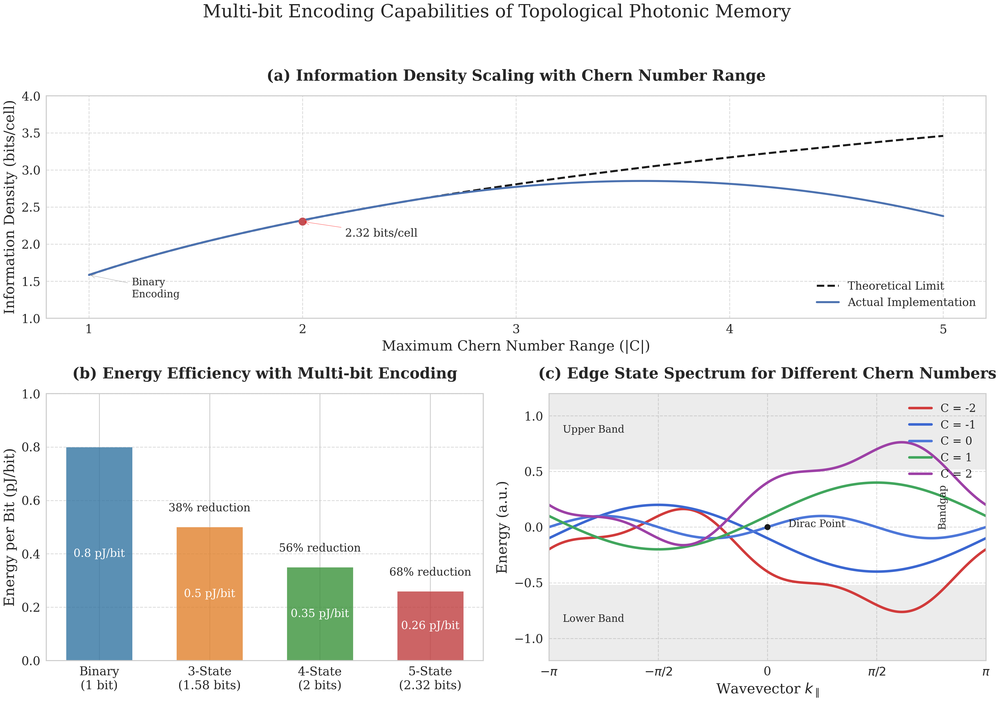

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as patches
from matplotlib.lines import Line2D
import matplotlib.gridspec as gridspec

# Set the style for a professional, publication-ready figure
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams.update({
    'font.family': 'serif',
    'font.size': 12,
    'axes.labelsize': 14,
    'axes.titlesize': 15,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 11
})

# Create a figure with custom GridSpec layout
fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(2, 2, height_ratios=[1, 1.2], width_ratios=[1, 1])

# Use the entire top row for the information density plot
ax_b = fig.add_subplot(gs[0, :])
# Use the bottom row for the remaining plots
ax_c = fig.add_subplot(gs[1, 0])
ax_d = fig.add_subplot(gs[1, 1])

# Create custom colormap for topological states
colors = {
    -2: '#D13B3B',  # Red
    -1: '#3B67D1',  # Blue
    0: '#4D77D9',   # Slightly different blue
    1: '#41A65D',   # Green
    2: '#9D41A6'    # Purple
}

# Plot (b): Information density scaling (now as the top plot spanning full width)
ax = ax_b

# Data for information density scaling
max_chern_range = np.linspace(1, 5, 100)
theoretical_density = np.log2(max_chern_range * 2 + 1)

# Actual implementation with some realistic limitations
actual_impl = np.copy(theoretical_density)
# Adjust for practical limitations at higher Chern numbers
for i, x in enumerate(max_chern_range):
    if x > 2.5:
        decay_factor = 0.05 * (x - 2.5)**2
        actual_impl[i] = max(theoretical_density[i] * (1 - decay_factor), 2.3)

ax.plot(max_chern_range, theoretical_density, 'k--', linewidth=2, label='Theoretical Limit')
ax.plot(max_chern_range, actual_impl, 'b-', linewidth=2, label='Actual Implementation')

# Highlight key points
key_points_x = [1, 2, 3, 4, 5]
key_points_theoretical = [np.log2(3), np.log2(5), np.log2(7), np.log2(9), np.log2(11)]
key_points_actual = [actual_impl[int((x-1)*99/4)] for x in key_points_x]

# Highlight the 5-state encoding point (Chern range = 2)
ax.plot(2, key_points_actual[1], 'ro', markersize=8)
ax.annotate(f"2.32 bits/cell", xy=(2, key_points_actual[1]),
            xytext=(2.2, key_points_actual[1]-0.2),
            arrowprops=dict(arrowstyle="->", color='red'), fontsize=11)

# Additional annotations to make the plot more informative
ax.annotate('Binary\nEncoding', xy=(1, key_points_actual[0]),
            xytext=(1.2, key_points_actual[0]-0.3),
            arrowprops=dict(arrowstyle="->", color='gray'), fontsize=10)

# Configure subplot (now as subplot a)
ax.set_xlabel('Maximum Chern Number Range (|C|)')
ax.set_ylabel('Information Density (bits/cell)')
ax.set_title('(a) Information Density Scaling with Chern Number Range', pad=15)
ax.legend(loc='lower right')
ax.set_xlim(0.8, 5.2)
ax.set_ylim(1.0, 4.0)
ax.set_xticks(range(1, 6))
ax.grid(True, linestyle='--', alpha=0.7)

# Plot (c): Energy efficiency with multi-bit encoding (now as subplot b)
ax = ax_c

# Data for energy efficiency
encoding_types = ['Binary\n(1 bit)', '3-State\n(1.58 bits)', '4-State\n(2 bits)', '5-State\n(2.32 bits)']
energy_per_bit = [0.8, 0.5, 0.35, 0.26]
reduction_pct = [0, 38, 56, 68]
bar_colors = ['#3274A1', '#E1812C', '#3A923A', '#C03D3E']

# Create bar chart
bars = ax.bar(encoding_types, energy_per_bit, color=bar_colors, alpha=0.8, width=0.6)

# Add values on bars
for bar, val in zip(bars, energy_per_bit):
    ax.text(bar.get_x() + bar.get_width()/2, val/2, f"{val} pJ/bit",
             ha='center', va='center', color='white', fontsize=11)

# Add percentage reduction labels
for i, (bar, pct) in enumerate(zip(bars, reduction_pct)):
    if i > 0:
        ax.text(bar.get_x() + bar.get_width()/2, energy_per_bit[i] + 0.05,
                f"{pct}% reduction", ha='center', va='bottom', fontsize=11)

# Configure subplot (now as subplot b)
ax.set_ylabel('Energy per Bit (pJ/bit)')
ax.set_title('(b) Energy Efficiency with Multi-bit Encoding', pad=15)
ax.grid(True, axis='y', linestyle='--', alpha=0.7)
ax.set_ylim(0, 1.0)

# Plot (d): Edge state spectrum for different Chern numbers (now as subplot c)
ax = ax_d

# Generate sample data for edge state spectrum
k_points = np.linspace(-np.pi, np.pi, 1000)

# Different edge state profiles for different Chern numbers
edge_states = {
    -2: -0.4 * np.sin(k_points) - 0.1 * np.cos(3*k_points) - 0.3,
    -1: -0.3 * np.sin(k_points) - 0.1,
    0: 0.1 * np.sin(2*k_points),
    1: 0.3 * np.sin(k_points) + 0.1,
    2: 0.4 * np.sin(k_points) + 0.1 * np.cos(3*k_points) + 0.3
}

# Add shaded region for bulk bands
ax.fill_between(k_points, -1.2, -0.52, color='gray', alpha=0.15)
ax.fill_between(k_points, 0.52, 1.2, color='gray', alpha=0.15)
ax.text(-np.pi + 0.2, -0.85, "Lower Band", fontsize=10)
ax.text(-np.pi + 0.2, 0.85, "Upper Band", fontsize=10)
ax.text(np.pi - 0.7, 0, "Bandgap", fontsize=10, rotation=90)

# Plot edge state dispersion for different Chern numbers
for chern, dispersion in edge_states.items():
    ax.plot(k_points, dispersion, linewidth=2.5, label=f"C = {chern}",
             color=colors[chern])

# Add Dirac point
ax.plot([0], [0], 'ko', markersize=6)
ax.text(0.3, 0, "Dirac Point", fontsize=10)

# Configure subplot (now as subplot c)
ax.set_xlabel(r'Wavevector $k_{\parallel}$')
ax.set_ylabel('Energy (a.u.)')
ax.set_title('(c) Edge State Spectrum for Different Chern Numbers', pad=15)
ax.legend(loc='upper right', framealpha=0.9)
ax.set_xlim(-np.pi, np.pi)
ax.set_ylim(-1.2, 1.2)
ax.set_xticks([-np.pi, -np.pi/2, 0, np.pi/2, np.pi])
ax.set_xticklabels([r'$-\pi$', r'$-\pi/2$', '0', r'$\pi/2$', r'$\pi$'])
ax.grid(True, linestyle='--', alpha=0.7)

# Add main title - removed bold formatting
fig.suptitle('Multi-bit Encoding Capabilities of Topological Photonic Memory',
             fontsize=18, y=0.98)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Save figure
plt.savefig('topological_memory_multibit_encoding_final.png', dpi=300, bbox_inches='tight')
plt.show()

IndexError: list index out of range

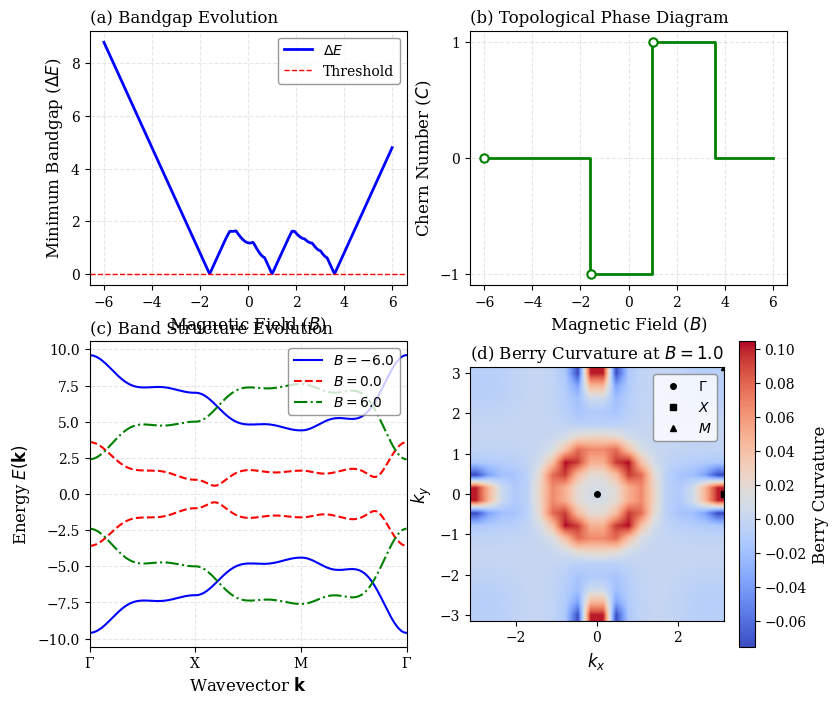

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib import rcParams

# Improve font settings for publication quality
rcParams['font.family'] = 'serif'
rcParams['text.usetex'] = False  # Disable LaTeX rendering as it's not available
rcParams['font.size'] = 11
rcParams['axes.labelsize'] = 12
rcParams['axes.titlesize'] = 12
rcParams['xtick.labelsize'] = 10
rcParams['ytick.labelsize'] = 10
rcParams['legend.fontsize'] = 10
rcParams['figure.titlesize'] = 14

# Create a single figure with custom layout - now with 2x2 grid
fig = plt.figure(figsize=(9, 8))
gs = GridSpec(2, 2, figure=fig, height_ratios=[1, 1.2], width_ratios=[1, 1])

# ==============================================
# 1) PARAMETERS & SETUP
# ==============================================
Nx = 21
Ny = 21

kx_vals = np.linspace(-np.pi, np.pi, Nx)
ky_vals = np.linspace(-np.pi, np.pi, Ny)

num_timesteps = 400

# We'll sweep the external magnetic field B from -6 to +6
B_min = -6.0
B_max =  6.0
B_vals = np.linspace(B_min, B_max, num_timesteps)

gap_threshold = 1e-3

# "Harmonic" coefficients that introduce multiple Dirac points
alpha = 0.5
beta  = 0.3

# ==============================================
# 2) EXTENDED 2-BAND HAMILTONIAN (with B)
# ==============================================
def extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta):
    """
    Interpreted as a 2D photonic or electronic "toy" model
    whose band structure depends on an external magnetic field B.

    H(k) = sin(kx)*sigma_x + sin(ky)*sigma_y
           + [B - g(kx, ky)]*sigma_z,

    where g(kx, ky) = cos(kx)+cos(ky)
                      + alpha*(cos(2kx)+cos(2ky))
                      + beta*(cos(3kx)+cos(3ky)).
    """
    hx = np.sin(kx)
    hy = np.sin(ky)

    # Additional harmonics:
    f_val = ( np.cos(kx) + np.cos(ky)
              + alpha*(np.cos(2*kx)+np.cos(2*ky))
              + beta*(np.cos(3*kx)+np.cos(3*ky)) )

    hz = B - f_val

    return np.array([
        [ hz,       hx - 1j*hy ],
        [ hx + 1j*hy,   -hz    ]
    ], dtype=complex)

# ==============================================
# 3) DIAGONALIZATION & BANDGAP
# ==============================================
def get_bands_and_gap(B):
    """
    Diagonalize extended_QWZ_Hamiltonian(kx, ky, B)
    on the 2D Brillouin zone, then find the minimum gap.
    """
    eigenvals = np.zeros((Nx, Ny, 2), dtype=float)
    for i, kx in enumerate(kx_vals):
        for j, ky in enumerate(ky_vals):
            Hk = extended_QWZ_Hamiltonian(kx, ky, B, alpha, beta)
            w, _ = np.linalg.eigh(Hk)
            w_sorted = np.sort(w.real)
            eigenvals[i, j, :] = w_sorted

    lower_band = eigenvals[:, :, 0]
    upper_band = eigenvals[:, :, 1]
    gap = np.min(upper_band - lower_band)
    return eigenvals, gap

# ==============================================
# 4) DISCRETE BERRY CURVATURE & CHERN NUMBER
# ==============================================
def berry_curvature(H_func, kx, ky, B, dk):
    """
    Fukui-Hatsugai-Suzuki discrete approach
    to Berry curvature for the lower band.
    """
    def get_lower_eigvec(kx_, ky_):
        Hk_ = H_func(kx_, ky_, B, alpha, beta)
        w_, v_ = np.linalg.eigh(Hk_)
        idx = np.argsort(w_.real)
        return v_[:, idx[0]]  # eigenvector of the lower band

    U00 = get_lower_eigvec(kx,       ky      )
    U10 = get_lower_eigvec(kx + dk,  ky      )
    U01 = get_lower_eigvec(kx,       ky + dk )
    U11 = get_lower_eigvec(kx + dk,  ky + dk )

    Ux   = np.vdot(U00, U10)
    Uy   = np.vdot(U00, U01)
    Ux_d = np.vdot(U01, U11)
    Uy_d = np.vdot(U10, U11)

    plaq = Ux * Uy_d / (Uy * Ux_d)
    return np.angle(plaq)

def compute_chern_number(H_func, B):
    dk = kx_vals[1] - kx_vals[0]
    total_phase = 0.0
    for i in range(Nx - 1):
        for j in range(Ny - 1):
            kx = kx_vals[i]
            ky = ky_vals[j]
            total_phase += berry_curvature(H_func, kx, ky, B, dk)
    chern = total_phase / (2.0 * np.pi)
    return round(chern)

# ==============================================
# 5) COMPUTE BERRY CURVATURE MAP AT TRANSITION POINT
# ==============================================
def compute_berry_curvature_map(B_value):
    """Calculate Berry curvature across k-space at given B"""
    dk = kx_vals[1] - kx_vals[0]
    berry_map = np.zeros((Nx-1, Ny-1))

    for i in range(Nx-1):
        for j in range(Ny-1):
            kx = kx_vals[i]
            ky = ky_vals[j]
            berry_map[i, j] = berry_curvature(extended_QWZ_Hamiltonian, kx, ky, B_value, dk)

    return berry_map

# ==============================================
# 6) SWEEP B, DETECT GAP CLOSURES & CHERN
# ==============================================
gap_history   = []
chern_history = []

last_gap_below_threshold = False
times_gap_closes = []
transitions_after_reopen = []

for it, B in enumerate(B_vals):
    # Compute bandgap
    _, gap = get_bands_and_gap(B)
    gap_history.append(gap)

    # Compute Chern number if gap is open
    if gap > gap_threshold:
        cn = compute_chern_number(extended_QWZ_Hamiltonian, B)
    else:
        cn = None
    chern_history.append(cn)

    # Detect transitions
    if gap < gap_threshold and not last_gap_below_threshold:
        # just went near zero
        times_gap_closes.append(it)
        last_gap_below_threshold = True
    elif gap > gap_threshold and last_gap_below_threshold:
        # reopened
        new_chern = compute_chern_number(extended_QWZ_Hamiltonian, B)
        transitions_after_reopen.append((it, new_chern))
        last_gap_below_threshold = False

# ==============================================
# 7) IDENTIFY KEY TRANSITION POINTS FOR ANNOTATION
# ==============================================
# Find the key transition B values
transition_B_values = [B_vals[t[0]] for t in transitions_after_reopen]
transition_cherns = [t[1] for t in transitions_after_reopen]

# ==============================================
# 8) ENHANCED PLOTS
# ==============================================
# Create a colormap for gap closings
cmap = plt.cm.coolwarm
norm = plt.Normalize(vmin=min(chern_history if None not in chern_history else [0]),
                     vmax=max(chern_history if None not in chern_history else [0]))

# Plot A: Gap vs. B in upper left
ax1 = fig.add_subplot(gs[0, 0])
ax1.plot(B_vals, gap_history, 'b-', linewidth=2, label=r'$\Delta E$')
ax1.axhline(gap_threshold, color='r', linestyle='--', linewidth=1, label='Threshold')

# Add vertical lines at gap closing points
for b_val in transition_B_values:
    ax1.axvline(b_val, color='gray', linestyle=':', linewidth=0.8)

ax1.set_xlabel(r"Magnetic Field ($B$)")
ax1.set_ylabel(r"Minimum Bandgap ($\Delta E$)")
ax1.set_title("(a) Bandgap Evolution", loc='left')
ax1.legend(frameon=True, fancybox=True, facecolor='white', edgecolor='gray', framealpha=0.8)
ax1.grid(True, linestyle='--', alpha=0.3)

# Plot B: Chern Number vs. B in upper right
ax2 = fig.add_subplot(gs[0, 1])
chern_vals = [c if c is not None else np.nan for c in chern_history]

# Create step-like visualization for Chern number
ax2.step(B_vals, chern_vals, 'g-', linewidth=2, where='mid')

# Add markers at each unique Chern value
unique_cherns = {}
for i, c in enumerate(chern_vals):
    if not np.isnan(c) and c not in unique_cherns:
        unique_cherns[c] = B_vals[i]

for chern, b in unique_cherns.items():
    ax2.plot(b, chern, 'o', markersize=6, markerfacecolor='white',
             markeredgecolor='green', markeredgewidth=1.5)

# Add vertical lines at transition points
for b_val in transition_B_values:
    ax2.axvline(b_val, color='gray', linestyle=':', linewidth=0.8)

# Annotate Chern number changes
for i, (b_val, chern) in enumerate(zip(transition_B_values, transition_cherns)):
    ax2.annotate(f"$C={chern}$",
                xy=(b_val + 0.2, chern),
                xytext=(b_val + 0.5, chern + 0.2),
                arrowprops=dict(arrowstyle="-|>", color='black', lw=1),
                fontsize=10, backgroundcolor='white', bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="gray", alpha=0.8))

ax2.set_xlabel(r"Magnetic Field ($B$)")
ax2.set_ylabel(r"Chern Number ($C$)")
ax2.set_title("(b) Topological Phase Diagram", loc='left')
ax2.grid(True, linestyle='--', alpha=0.3)
ax2.set_yticks(list(set([c for c in chern_vals if not np.isnan(c)])))

# Plot C: Band Structure at three key B values in bottom left
ax3 = fig.add_subplot(gs[1, 0])

# Choose three representative B values (beginning, middle, end)
# Check if we have gap closings, otherwise choose values evenly distributed
if times_gap_closes:
    middle_idx = times_gap_closes[0]
else:
    middle_idx = len(B_vals) // 2
b_indices = [0, middle_idx, -1]
b_values = [B_vals[i] for i in b_indices]
b_labels = ["$B=" + f"{b:.1f}" + "$" for b in b_values]
line_styles = ['-', '--', '-.']
colors = ['blue', 'red', 'green']

# Plot band structure along high-symmetry path
k_path = []
k_labels = []

# Define a path Γ-X-M-Γ in the Brillouin zone
gamma_point = (0, 0)
x_point = (np.pi, 0)
m_point = (np.pi, np.pi)

# Create a path with 100 points along each segment
n_points = 100
path = []

# Γ to X
for i in range(n_points):
    t = i / (n_points - 1)
    kx = gamma_point[0] * (1-t) + x_point[0] * t
    ky = gamma_point[1] * (1-t) + x_point[1] * t
    path.append((kx, ky))
k_labels.append(0)  # Γ position
k_labels.append(n_points-1)  # X position

# X to M
for i in range(n_points):
    t = i / (n_points - 1)
    kx = x_point[0] * (1-t) + m_point[0] * t
    ky = x_point[1] * (1-t) + m_point[1] * t
    path.append((kx, ky))
k_labels.append(2*n_points-1)  # M position

# M to Γ
for i in range(n_points):
    t = i / (n_points - 1)
    kx = m_point[0] * (1-t) + gamma_point[0] * t
    ky = m_point[1] * (1-t) + gamma_point[1] * t
    path.append((kx, ky))
k_labels.append(3*n_points-1)  # Γ position again

# Plot bands along the path for each B value
for b_idx, b_val, color, ls in zip(b_indices, b_values, colors, line_styles):
    bands = []
    for kx, ky in path:
        H = extended_QWZ_Hamiltonian(kx, ky, b_val, alpha, beta)
        w, _ = np.linalg.eigh(H)
        bands.append(w.real)

    bands = np.array(bands)
    ax3.plot(range(len(path)), bands[:, 0], ls, color=color, label=f"{b_labels[b_indices.index(b_idx)]}")
    ax3.plot(range(len(path)), bands[:, 1], ls, color=color)

ax3.set_xticks(k_labels)
ax3.set_xticklabels(['Γ', 'X', 'M', 'Γ'])
ax3.set_xlim(0, len(path)-1)
ax3.set_xlabel(r"Wavevector $\mathbf{k}$")
ax3.set_ylabel(r"Energy $E(\mathbf{k})$")
ax3.set_title("(c) Band Structure Evolution", loc='left')
ax3.grid(True, linestyle='--', alpha=0.3)
ax3.legend(frameon=True, fancybox=True, loc='upper right', facecolor='white', edgecolor='gray', framealpha=0.8)

# Plot D: Berry Curvature at transition point in bottom right
ax4 = fig.add_subplot(gs[1, 1])

# Choose a critical B value for the Berry curvature plot (near a transition)
critical_B = B_vals[transitions_after_reopen[0][0]] if transitions_after_reopen else 1.0
berry_map = compute_berry_curvature_map(critical_B)

# Create a more informative berry curvature visualization
im = ax4.imshow(berry_map.T, origin='lower', extent=[-np.pi, np.pi, -np.pi, np.pi],
                cmap='coolwarm', interpolation='bilinear')
plt.colorbar(im, ax=ax4, label=r'Berry Curvature')

# Mark high symmetry points
ax4.plot(0, 0, 'ko', markersize=4, label=r'$\Gamma$')
ax4.plot(np.pi, 0, 'ks', markersize=4, label=r'$X$')
ax4.plot(np.pi, np.pi, 'k^', markersize=4, label=r'$M$')

ax4.set_xlabel(r'$k_x$')
ax4.set_ylabel(r'$k_y$')
ax4.set_title(f"(d) Berry Curvature at $B={critical_B:.1f}$", loc='left')
ax4.grid(False)
ax4.legend(loc='upper right', frameon=True, fancybox=True, facecolor='white', edgecolor='gray', framealpha=0.8)

# Add a caption about the topological transitions
props = dict(boxstyle='round', facecolor='white', alpha=0.7, edgecolor='gray')
caption = (f"Topological phase transitions in the extended QWZ model at "
           f"$B={transition_B_values[0]:.2f}$ (C={transition_cherns[0]}) and "
           f"$B={transition_B_values[1]:.2f}$ (C={transition_cherns[1]})")

fig.text(0.5, 0.01, caption, ha='center', va='bottom', fontsize=10,
         bbox=props)

plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.show()

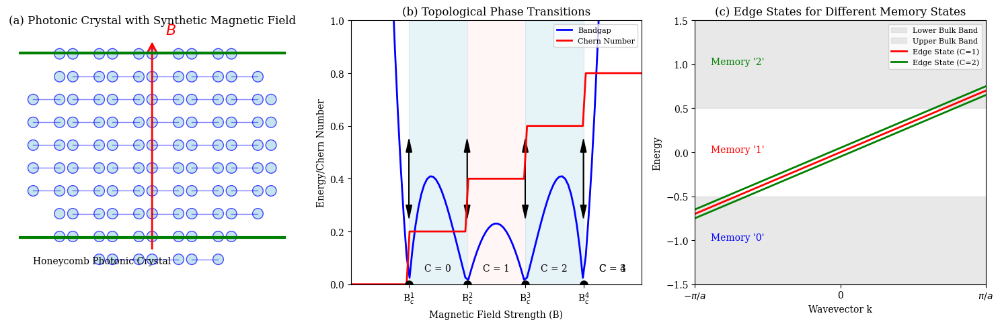

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import RegularPolygon, Circle, FancyArrowPatch, Polygon
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import cm

# Set up the figure with three panels
plt.figure(figsize=(15, 5))

# Panel (a): Honeycomb photonic crystal lattice with magnetic field control
ax1 = plt.subplot(131)

# Function to create honeycomb lattice
def create_honeycomb_lattice(ax, size=5):
    # Lattice parameters
    a = 1.0  # Lattice constant

    # Create the honeycomb lattice
    for i in range(-size, size):
        for j in range(-size, size):
            # Position of the first atom in the unit cell
            x1 = a * 3/2 * i
            y1 = a * np.sqrt(3)/2 * j

            # Position of the second atom in the unit cell
            x2 = x1 + a
            y2 = y1

            # Draw only points within a circular region
            if x1**2 + y1**2 < (size*a)**2:
                ax.add_patch(Circle((x1, y1), 0.2, facecolor='lightblue', edgecolor='blue', alpha=0.7))
            if x2**2 + y2**2 < (size*a)**2:
                ax.add_patch(Circle((x2, y2), 0.2, facecolor='lightblue', edgecolor='blue', alpha=0.7))

            # Connect nearest neighbors
            if (x1**2 + y1**2 < (size*a)**2) and (x2**2 + y2**2 < (size*a)**2):
                ax.plot([x1, x2], [y1, y2], 'b-', alpha=0.5, linewidth=1)

    # Add magnetic field representation
    B_arrow = FancyArrowPatch((0, -4), (0, 4), arrowstyle='->', color='red', linewidth=2,
                              mutation_scale=20)
    ax.add_patch(B_arrow)
    ax.text(0.5, 4.2, r'$B$', color='red', fontsize=16)

    # Add edge states indicator
    edge_x = np.linspace(-5, 5, 100)
    edge_y = np.ones_like(edge_x) * (-3.5)
    ax.plot(edge_x, edge_y, 'g-', linewidth=3)
    edge_y2 = np.ones_like(edge_x) * 3.5
    ax.plot(edge_x, edge_y2, 'g-', linewidth=3)

    # Add labels for sublattices
    ax.text(-4.5, -4.5, 'Honeycomb Photonic Crystal', fontsize=10)

    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title('(a) Photonic Crystal with Synthetic Magnetic Field', fontsize=12)

# Panel (b): Topological phase transitions
ax2 = plt.subplot(132)

def plot_phase_transitions(ax):
    # Magnetic field strengths
    B_values = np.linspace(0, 5, 100)

    # Gap closing points
    critical_B = [1, 2, 3, 4]

    # Calculate bandgap as a function of B
    bandgap = []
    for B in B_values:
        # Model bandgap with closing points at critical values
        gap = 1.0
        for B_c in critical_B:
            gap *= np.abs(B - B_c) * 0.8
        bandgap.append(gap)

    # Calculate Chern numbers based on magnetic field
    C_values = []
    current_C = 0
    for B in B_values:
        for B_c in critical_B:
            if B > B_c and B < B_c + 0.05 and B_c not in C_values:
                current_C += 1
        C_values.append(current_C)

    # Plot bandgap
    ax.plot(B_values, bandgap, 'b-', linewidth=2, label='Bandgap')

    # Plot Chern number (shifted for visibility)
    C_array = np.array(C_values) * 0.2
    ax.plot(B_values, C_array, 'r-', linewidth=2, label='Chern Number')

    # Add colored regions for different topological phases
    for i in range(len(critical_B)):
        if i % 2 == 0:
            color = 'lightblue'
        else:
            color = 'mistyrose'
        if i < len(critical_B) - 1:
            ax.axvspan(critical_B[i], critical_B[i+1], alpha=0.3, color=color)

    # Add labels for Chern numbers
    for i in range(len(critical_B) + 1):
        if i < len(critical_B):
            x_pos = (critical_B[i] + (critical_B[i+1] if i < len(critical_B)-1 else 5)) / 2
        else:
            x_pos = (critical_B[i-1] + 5) / 2
        ax.text(x_pos, 0.05, f'C = {i}', fontsize=10, ha='center')

    # Add critical point markers
    for B_c in critical_B:
        ax.plot(B_c, 0, 'ko', markersize=8)

    # Add band inversion indicators at transition points
    for B_c in critical_B:
        ax.arrow(B_c, 0.3, 0, 0.2, head_width=0.1, head_length=0.05, fc='k', ec='k')
        ax.arrow(B_c, 0.5, 0, -0.2, head_width=0.1, head_length=0.05, fc='k', ec='k')

    ax.set_xlabel('Magnetic Field Strength (B)', fontsize=10)
    ax.set_ylabel('Energy/Chern Number', fontsize=10)
    ax.set_title('(b) Topological Phase Transitions', fontsize=12)
    ax.set_xlim(0, 5)
    ax.set_ylim(0, 1)
    ax.set_xticks(critical_B)
    ax.set_xticklabels([f'B$_c^{{{i+1}}}$' for i in range(len(critical_B))])
    ax.legend(loc='upper right', fontsize=8)

# Panel (c): Edge states for different memory states
ax3 = plt.subplot(133)

def plot_edge_states(ax):
    # Create different edge state configurations
    edge_configs = [0, 1, 2]  # Different number of edge states

    k_values = np.linspace(-np.pi, np.pi, 200)

    colors = ['blue', 'red', 'green']

    # Plot bulk bands
    ax.fill_between(k_values, -1.5, -0.5, color='lightgray', alpha=0.5, label='Lower Bulk Band')
    ax.fill_between(k_values, 0.5, 1.5, color='lightgray', alpha=0.5, label='Upper Bulk Band')

    # Plot edge states
    for i, num_states in enumerate(edge_configs):
        if num_states == 0:
            # No edge states
            continue

        # Plot dispersive edge states crossing the gap
        for j in range(num_states):
            # Plot different edge states with slight offsets
            offset = 0.1 * (j - (num_states-1)/2)

            # Create a dispersive edge state
            edge_dispersion = 0.7 * k_values / np.pi + offset

            # Plot the edge state
            ax.plot(k_values, edge_dispersion, color=colors[i], linewidth=2,
                    label=f'Edge State (C={i})' if j==0 else "")

    # Add memory state labels
    ax.text(-2.8, -1, "Memory '0'", fontsize=10, color='blue')
    ax.text(-2.8, 0, "Memory '1'", fontsize=10, color='red')
    ax.text(-2.8, 1, "Memory '2'", fontsize=10, color='green')

    ax.set_xlabel('Wavevector k', fontsize=10)
    ax.set_ylabel('Energy', fontsize=10)
    ax.set_title('(c) Edge States for Different Memory States', fontsize=12)
    ax.set_xlim(-np.pi, np.pi)
    ax.set_ylim(-1.5, 1.5)
    ax.set_xticks([-np.pi, 0, np.pi])
    ax.set_xticklabels([r'$-\pi/a$', '0', r'$\pi/a$'])

    handles, labels = ax.get_legend_handles_labels()
    unique_labels = dict(zip(labels, handles))
    ax.legend(unique_labels.values(), unique_labels.keys(), loc='upper right', fontsize=8)

# Create the figures
create_honeycomb_lattice(ax1)
plot_phase_transitions(ax2)
plot_edge_states(ax3)

plt.tight_layout()
plt.show()

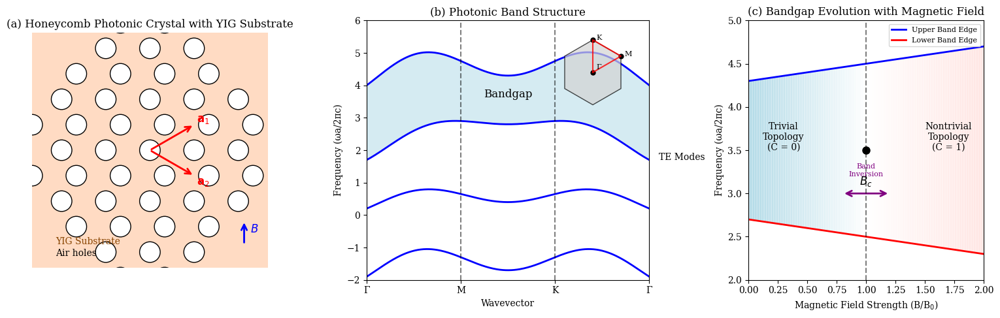

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import RegularPolygon, Circle, FancyArrowPatch, Polygon
from matplotlib.colors import LinearSegmentedColormap
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import matplotlib.gridspec as gridspec

# Create figure with 3 panels
plt.figure(figsize=(15, 5))
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1.2, 1])

# Panel (a): Honeycomb lattice with air holes in YIG substrate
ax1 = plt.subplot(gs[0])

def create_honeycomb_lattice_with_holes(ax, size=4):
    # Lattice parameters
    a = 1.0  # Lattice constant
    r = 0.35 * a  # Hole radius

    # Create YIG substrate background
    rect = plt.Rectangle((-size*a, -size*a), 2*size*a, 2*size*a,
                         facecolor='#ffccaa', edgecolor='none', alpha=0.7)
    ax.add_patch(rect)

    # Create the honeycomb lattice with air holes
    positions = []
    for i in range(-size, size+1):
        for j in range(-size, size+1):
            # Positions for the hexagonal lattice
            x1 = a * 3/2 * i
            y1 = a * np.sqrt(3)/2 * (2*j)

            x2 = a * 3/2 * i + a/2
            y2 = a * np.sqrt(3)/2 * (2*j+1)

            # Only draw holes within a hexagonal region
            if abs(x1) + abs(y1) < size*1.5*a:
                positions.append((x1, y1))
                circle = Circle((x1, y1), r, facecolor='white', edgecolor='black', alpha=1.0)
                ax.add_patch(circle)

            if abs(x2) + abs(y2) < size*1.5*a:
                positions.append((x2, y2))
                circle = Circle((x2, y2), r, facecolor='white', edgecolor='black', alpha=1.0)
                ax.add_patch(circle)

    # Add unit vectors
    arrow1 = FancyArrowPatch((0, 0), (a*3/2, a*np.sqrt(3)/2), arrowstyle='->', color='red',
                            linewidth=2, mutation_scale=15)
    arrow2 = FancyArrowPatch((0, 0), (a*3/2, -a*np.sqrt(3)/2), arrowstyle='->', color='red',
                            linewidth=2, mutation_scale=15)
    ax.add_patch(arrow1)
    ax.add_patch(arrow2)
    ax.text(a*3/2 + 0.1, a*np.sqrt(3)/2 + 0.1, r'$\mathbf{a}_1$', color='red', fontsize=12)
    ax.text(a*3/2 + 0.1, -a*np.sqrt(3)/2 - 0.3, r'$\mathbf{a}_2$', color='red', fontsize=12)

    # Add B field indicator
    ax.text(-size*0.8*a, -size*0.8*a, r'YIG Substrate', fontsize=10, color='#884400')
    ax.text(-size*0.8*a, -size*0.9*a, r'Air holes', fontsize=10, color='black')

    # Add magnetic field indicator
    B_arrow = FancyArrowPatch((size*0.8*a, -size*0.8*a), (size*0.8*a, -size*0.6*a),
                             arrowstyle='->', color='blue', linewidth=2, mutation_scale=15)
    ax.add_patch(B_arrow)
    ax.text(size*0.8*a + 0.2, -size*0.7*a, r'$B$', color='blue', fontsize=12)

    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_xlim(-size*a, size*a)
    ax.set_ylim(-size*a, size*a)
    ax.set_title('(a) Honeycomb Photonic Crystal with YIG Substrate', fontsize=12)

# Panel (b): Band structure along high-symmetry points
ax2 = plt.subplot(gs[1])

def plot_band_structure(ax):
    # Define high symmetry points
    points = ['Γ', 'M', 'K', 'Γ']
    x_ticks = [0, 1, 2, 3]

    # Calculate bands
    x = np.linspace(0, 3, 300)

    # Generate band structure data
    # First bulk band
    band1 = 2.5 + 0.5 * np.sin(np.pi * x) - 0.8 * np.cos(2 * np.pi * x/3)
    # Second bulk band
    band2 = 4.5 + 0.7 * np.sin(np.pi * x) - 0.5 * np.cos(2 * np.pi * x/3)
    # Third bulk band
    band3 = 0.5 + 0.4 * np.sin(np.pi * x) - 0.3 * np.cos(2 * np.pi * x/3)
    # Fourth bulk band
    band4 = -1.5 + 0.6 * np.sin(np.pi * x) - 0.4 * np.cos(2 * np.pi * x/3)

    # Bandgap region
    gap_y1 = band1.copy()
    gap_y2 = band2.copy()

    # Plot bands
    ax.plot(x, band1, 'b-', linewidth=2)
    ax.plot(x, band2, 'b-', linewidth=2)
    ax.plot(x, band3, 'b-', linewidth=2)
    ax.plot(x, band4, 'b-', linewidth=2)

    # Fill bandgap
    ax.fill_between(x, band1, band2, color='lightblue', alpha=0.5)

    # Add bandgap label
    ax.text(1.5, (np.mean(band1) + np.mean(band2))/2, 'Bandgap', fontsize=12, ha='center')

    # Add vertical lines at high symmetry points
    for x_val in x_ticks[1:-1]:
        ax.axvline(x=x_val, color='k', linestyle='--', alpha=0.5)

    # Highlight the bandgap
    ax.text(3.1, band1[-1], 'TE Modes', fontsize=10)

    ax.set_xticks(x_ticks)
    ax.set_xticklabels(points)
    ax.set_xlabel('Wavevector', fontsize=10)
    ax.set_ylabel('Frequency (ωa/2πc)', fontsize=10)
    ax.set_title('(b) Photonic Band Structure', fontsize=12)
    ax.set_xlim(0, 3)
    ax.set_ylim(-2, 6)

    # Add first Brillouin zone inset
    inset_ax = ax.inset_axes([0.65, 0.65, 0.3, 0.3])

    # Plot hexagonal Brillouin zone
    hex_points = []
    for i in range(6):
        angle = np.pi/6 + i*np.pi/3
        hex_points.append((np.cos(angle), np.sin(angle)))

    hex_poly = Polygon(hex_points, closed=True, fill=True, facecolor='lightgray',
                      edgecolor='black', alpha=0.7)
    inset_ax.add_patch(hex_poly)

    # Add high symmetry points
    inset_ax.plot(0, 0, 'ko', markersize=5)  # Gamma point
    inset_ax.text(0.1, 0.1, 'Γ', fontsize=8)

    inset_ax.plot(0, 1, 'ko', markersize=5)  # K point
    inset_ax.text(0.1, 1, 'K', fontsize=8)

    inset_ax.plot(np.cos(np.pi/6), np.sin(np.pi/6), 'ko', markersize=5)  # M point
    inset_ax.text(np.cos(np.pi/6)+0.1, np.sin(np.pi/6), 'M', fontsize=8)

    # Add path indicator
    path_x = [0, np.cos(np.pi/6), 0, 0]  # Gamma-M-K-Gamma
    path_y = [0, np.sin(np.pi/6), 1, 0]
    inset_ax.plot(path_x, path_y, 'r-', linewidth=1.5, alpha=0.8)

    inset_ax.set_aspect('equal')
    inset_ax.axis('off')
    inset_ax.set_xlim(-1.2, 1.2)
    inset_ax.set_ylim(-1.2, 1.2)

# Panel (c): Bandgap evolution with magnetic field
ax3 = plt.subplot(gs[2])

def plot_bandgap_evolution(ax):
    # Magnetic field strengths
    B_values = np.linspace(0, 2, 100)

    # Critical field for topological transition
    B_c = 1.0

    # Calculate band edges as function of B
    upper_band = 4.5 + 0.2 * (B_values - B_c)
    lower_band = 2.5 - 0.2 * (B_values - B_c)

    # Gap closing at critical point
    gap_width = upper_band - lower_band

    # Plot band edges
    ax.plot(B_values, upper_band, 'b-', linewidth=2, label='Upper Band Edge')
    ax.plot(B_values, lower_band, 'r-', linewidth=2, label='Lower Band Edge')

    # Fill the bandgap region with color gradient to indicate topology
    cmap = LinearSegmentedColormap.from_list("", ["lightblue", "white", "mistyrose"])
    for i in range(len(B_values)-1):
        color_idx = (B_values[i] - B_values[0])/(B_values[-1] - B_values[0])
        color = cmap(color_idx)
        ax.fill_between([B_values[i], B_values[i+1]],
                        [lower_band[i], lower_band[i+1]],
                        [upper_band[i], upper_band[i+1]],
                        color=color, alpha=0.7)

    # Add indicators for trivial and nontrivial regions
    ax.text(0.3, 3.5, 'Trivial\nTopology\n(C = 0)', fontsize=10, ha='center')
    ax.text(1.7, 3.5, 'Nontrivial\nTopology\n(C = 1)', fontsize=10, ha='center')

    # Mark the critical point
    ax.plot(B_c, (upper_band[50] + lower_band[50])/2, 'ko', markersize=8)
    ax.text(B_c, (upper_band[50] + lower_band[50])/2 - 0.4, '$B_c$', fontsize=12, ha='center')

    # Add vertical line at critical point
    ax.axvline(x=B_c, color='k', linestyle='--', alpha=0.5)

    # Add band inversion indicator at critical point
    arrow1 = FancyArrowPatch((B_c-0.2, 3.0), (B_c+0.2, 3.0), arrowstyle='<->', color='purple',
                            linewidth=2, mutation_scale=15)
    ax.add_patch(arrow1)
    ax.text(B_c, 3.2, 'Band\nInversion', fontsize=8, ha='center', color='purple')

    ax.set_xlabel('Magnetic Field Strength (B/B$_0$)', fontsize=10)
    ax.set_ylabel('Frequency (ωa/2πc)', fontsize=10)
    ax.set_title('(c) Bandgap Evolution with Magnetic Field', fontsize=12)
    ax.set_xlim(0, 2)
    ax.set_ylim(2, 5)
    ax.legend(loc='upper right', fontsize=8)

# Create the three panels
create_honeycomb_lattice_with_holes(ax1)
plot_band_structure(ax2)
plot_bandgap_evolution(ax3)

plt.tight_layout()
plt.savefig('photonic_crystal_design.png', dpi=300, bbox_inches='tight')
plt.show()